In [1]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm

def root_getter_oof(E, L, C, spin):
    a, b, c, d, e = np.array([(E**2 - 1.0), 2.0, ((spin**2)*(E**2 - 1.0) - L**2 - C),  (2*((L - spin*E)**2) + 2*C), -(spin**2)*C]).astype(complex)
    #print(a,b,c,d,e)
    p1 = 2*(c**3) - 9*b*c*d + 27*a*(d**2) + 27*(b**2)*e - 72*a*c*e
    p2 = p1 + (-4*(c**2 - 3*b*d + 12*a*e)**3 + p1**2)**0.5
    p3 = (c**2 - 3*b*d + 12*a*e)/(3*a*((0.5*p2)**(1/3))) + ((0.5*p2)**(1/3))/(3*a)
    p4 = ((b**2)/(4*(a**2)) - (2*c)/(3*a) + p3)**(0.5)
    p5 = (b**2)/(2*(a**2)) - (4*c)/(3*a) - p3
    p6 = (-(b**3)/(a**3) + (4*b*c)/(a**2) - 8*d/a)/(4*p4)
    x1 = -b/(4*a) - p4/2 - 0.5*((p5 - p6)**0.5)
    x2 = -b/(4*a) - p4/2 + 0.5*((p5 - p6)**0.5)
    x3 = -b/(4*a) + p4/2 - 0.5*((p5 + p6)**0.5)
    x4 = -b/(4*a) + p4/2 + 0.5*((p5 + p6)**0.5) 
    turns = np.array([np.real(num) if np.abs(np.imag(num)) < 1e-12 else num for num in [x1, x2, x3, x4]]).astype(complex)
    
    try:
        flats = np.roots([4*a,3*b,2*c,d])
    except:
        print(a,b,c,d,e)
        print(E, L, C, L**2, np.sqrt(L**2 + C))
        flats = np.array([float(input("number baybee: ")) for i in range(5)])
    flats = np.array([np.real(num) if np.abs(np.imag(num)) < 1e-12 else num for num in flats]).astype(complex)
    
    a, b, c, d, e = np.array([(a**2)*(1 - E**2), 0.0, -(C + (a**2)*(1 - E**2) + L**2), 0.0, C]).astype(complex)
    p1 = 2*(c**3) - 9*b*c*d + 27*a*(d**2) + 27*(b**2)*e - 72*a*c*e
    p2 = p1 + (-4*(c**2 - 3*b*d + 12*a*e)**3 + p1**2)**0.5
    p3 = (c**2 - 3*b*d + 12*a*e)/(3*a*((0.5*p2)**(1/3))) + ((0.5*p2)**(1/3))/(3*a)
    p4 = ((b**2)/(4*(a**2)) - (2*c)/(3*a) + p3)**(0.5)
    p5 = (b**2)/(2*(a**2)) - (4*c)/(3*a) - p3
    p6 = (-(b**3)/(a**3) + (4*b*c)/(a**2) - 8*d/a)/(4*p4)
    x1 = -b/(4*a) - p4/2 - 0.5*((p5 - p6)**0.5)
    x2 = -b/(4*a) - p4/2 + 0.5*((p5 - p6)**0.5)
    x3 = -b/(4*a) + p4/2 - 0.5*((p5 + p6)**0.5)
    x4 = -b/(4*a) + p4/2 + 0.5*((p5 + p6)**0.5) 
    zs = np.array([np.real(num) if np.abs(np.imag(num)) < 1e-5 else num for num in [x1, x2, x3, x4]]).astype(complex)
    
    return np.sort(turns), np.sort(flats), np.sort(zs)

def glamper(p, e, i, a, mu, frac):
    b = (64/5)*mu*(1 + mu)
    full = ((p/(1 - e**2))**4)/(4*b)
    dt = full*frac
    E, L, C = mm.schmidtparam3(p/(1 - e**2), e, i, a)
    print(E, L, C)
    cosi = L/np.sqrt(L**2 + C)
    f1 = lambda x: 1 + (73/24)*(x**2) + (37/96)*(x**4)
    f2 = lambda x: 73/12 + (823/24)*(x**2) + (949/32)*(x**4) + (491/192)*(x**6)
    f3 = lambda x: 1 + (7/8)*(x**2)
    f4 = lambda x: 61/24 + (63/8)*(x**2) + (94/64)*(x**4)
    f5 = lambda x: 61/8 + (91/4)*(x**2) + (461/64)*(x**4)
    f6 = lambda x: 97/12 + (37/2)*(x**2) + (211/32)*(x**4)
    vals = [[0, p, e, cosi, E, L, C]]
    p0 = p
    pbar = tqdm(total = 10000, position=0)
    thing = mm.find_rms(a)*(1 + e)
    pbar.set_postfix_str("Semilat: %s, Ecc %s" %(np.round(p, 3), np.round(e, 3)))
    while p/(1 + e) > mm.find_rms(a):
        E_dot = (-32/5)*(mu**2)*(p**(-5))*((1 - e**2)**(3/2))*(f1(e) - a*(p**(-3/2))*cosi*f2(e))
        L_dot = (-32/5)*(mu**2)*(p**(-7/2))*((1 - e**2)**(3/2))*(cosi*f3(e) + a*(p**(-3/2))*(f4(e) - (cosi**2)*f5(e)))
        Q_dot = (-64/5)*(mu**3)*(p**(-3))*((1 - e**2)**(3/2))*(f3(e) - a*(p**(-3/2))*cosi*f6(e))
        C_dot = 2*(C/L)*L_dot if L != 0 else Q_dot - 2*L*L_dot
        E += E_dot*dt
        L += L_dot*dt
        C += C_dot*dt
        turns, flats, zs = root_getter_oof(E, L, C, a)
        turns = np.real(turns)
        e = (turns[-1] - turns[-2])/(turns[-1] + turns[-2])
        cosi = L/np.sqrt(L**2 + C)
        p = 0.5*(turns[-1] + turns[-2])*(1 - e**2)
        vals.append([vals[-1][0] + dt, p, e, cosi, E, L, C])
        if p < 0.99*p0:
            #print(p)
            pbar.set_postfix_str("Semilat: %s, Ecc %s" %(np.round(p, 3), np.round(e, 3)))
            p0 = p
        #print(p, e, cosi)
        pbar.update(1)
    pbar.close()
    return np.array(vals)

#test = glamper(10, 0.1, np.pi/2, 0.0, 1e-3, 1e-2)
#print(len(test))

In [ ]:
test = ml.EMRIGenerator(0.8, 1e-100, endflag="rad_orbit > 100", params=[10, 0.7391, np.pi/4], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-11)
#print(np.shape(test["diag_times"]))
#plt.plot(test["diag_times"][:, 2][np.where(test["diag_times"][:, 2]) == 0])
#print(test["diag_times"][0]/len(test["time"]), test["diag_times"][1:]/len(test["tracktime"]))
#plt.plot(test["diag_times"][:, 1][np.where(test["diag_times"][:, 2] != 0)])
#np.where(test["diag_times"][:, 2] == 0)
#plt.hist(test["diag_times"][:,2])
#plt.yscale("log")

new


10000074.77475544it [03:18, 50492.08it/s, Semilat: 4.537, Ecc 0.739]                               


KeyError: 'diag_times'

In [2]:
test = ml.EMRIGenerator(0.8, 1e-100, endflag="rad_orbit > 100", params=[10, 0.7391, np.pi/4], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-11)
#print(np.shape(test["diag_times"]))
#plt.plot(test["diag_times"][:, 2][np.where(test["diag_times"][:, 2]) == 0])
#print(test["diag_times"][0]/len(test["time"]), test["diag_times"][1:]/len(test["tracktime"]))
#plt.plot(test["diag_times"][:, 1][np.where(test["diag_times"][:, 2] != 0)])
#np.where(test["diag_times"][:, 2] == 0)
#plt.hist(test["diag_times"][:,2])
#plt.yscale("log")

new


10000074.77475544it [03:20, 49821.13it/s]                               


In [15]:
thing = []
thing.append([1,1,2])
print(thing)
thing.append([1,1,2])
print(thing)

[[1, 1, 2]]
[[1, 1, 2], [1, 1, 2]]


I'm doing a lot of stuff here to basically say That the geodesic takes the longest time to run

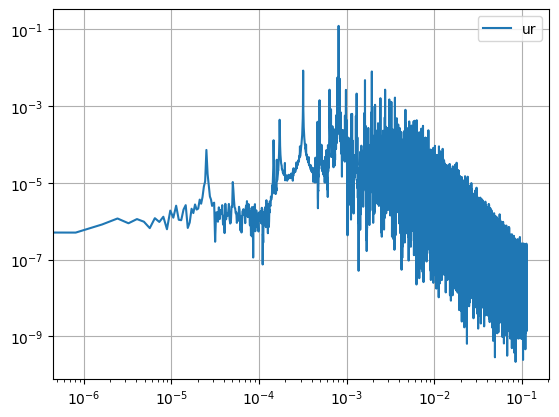

In [174]:
from scipy.fft import fft, fftfreq
# Number of sample points
# sample spacing
def thingything(t_mult):
    t = test["time"]
    N = len(t)
    T_sub = t[-1]/N
    T_mult = 1
    T = T_sub*T_mult
    us = [test["raw"][:,i+4] for i in range(4)]
    labs = ["ut", "ur", "uthet", "uphi"]
    yf_s = [fft(u) for u in us]
    xf = fftfreq(N, T)[:N//2]
    #[plt.plot(xf, 2.0/N * np.abs(yf_s[i][0:N//2]), label=labs[i]) for i in range(len(yf_s))]
    plt.plot(xf*T_mult, 2.0/N * np.abs(yf_s[1][0:N//2]), label=labs[1])
    #print(xf[np.where(yf_s[1][0:N//2] == max(yf_s[1][0:N//2]))[0][0]]*T_mult)

thingything(1)
#thingything(10)
#thingything(100)
#thingything(10000)
plt.legend()
plt.xscale("log")
plt.yscale("log")
#plt.xlim(1e-2, 1.02e-2)
plt.grid()
plt.show()

sawtooth = lambda n, x: 0.0*np.ones(len(x)) if n == 0 else np.sin(n*x/200)/(n*np.pi)


42621.87805320497 50000
AHYE
16
40
16 17 41
(array([558]),)


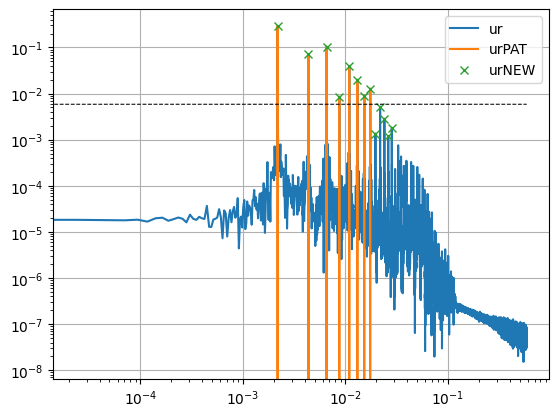

In [605]:
from scipy.fft import fft, fftfreq, ifft
from scipy.signal import argrelmin, find_peaks
thresh = 0.02
ix = 1
T_mult = 1
old_t = test["time"]
t = np.linspace(old_t[0], old_t[-1], len(old_t))
N = 50000 #len(t)
print(max(t), N)
T_sub = t[-1]/N
T_mult = 1
T = T_sub*T_mult
us = [np.interp(t, old_t, test["raw"][:,i+4]) for i in range(4)]
labs = ["ut", "ur", "uthet", "uphi"]
yf_s = [fft(u) for u in us]
xf = fftfreq(N, T)[:N//2]
#[plt.plot(xf, 2.0/N * np.abs(yf_s[i][0:N//2]), label=labs[i]) for i in range(len(yf_s))]

#Original Fourier Transform
plt.plot(xf*T_mult, 2.0/N * np.abs(yf_s[ix][0:N//2]), label=labs[ix])

#All above threshold (AAT)
## Find the highest value and include all values greater than (threshold*highest_value)
absval = np.max(np.abs(yf_s[ix]))
AAT_plot = np.where(np.abs(yf_s[ix])/absval >= thresh, yf_s[ix], 0)
#plt.plot(xf*T_mult, 2.0/N * np.abs(AAT_plot)[0:N//2], label=labs[ix]+"AAT")

#Peaks above threshold (PAT)
## Find the highest value and include all values that are greater than (threshold*highest_value) AND are peaks
peak_ix = np.array(argrelmin(-np.abs(yf_s[ix])))
PAT_plot = np.where(np.logical_and(np.sum((yf_s[ix][:, None] == yf_s[ix][peak_ix][None, :])[0], axis=1), np.abs(yf_s[ix])/absval >= thresh), yf_s[ix], 0)
PAT_plot[0] = yf_s[ix][0]
plt.plot(xf*T_mult, 2.0/N * np.abs(PAT_plot)[0:N//2], label=labs[ix]+"PAT")
#plt.plot(fftfreq(N, T)[peak_ix]*T_mult, 2.0/N * np.abs(yf_s[peak_ix]), "x", label=labs[ix]+"PAT")

#New thing where I use built in functions instead of fuckery
new_peak_ix, stuff = find_peaks((2/N)*np.abs(yf_s[ix]), threshold=1e-3)
#print(np.sum((yf_s[ix][:, None] == yf_s[ix][new_peak_ix][None, :]), axis=1))
FPT_plot = np.where(np.sum((yf_s[ix][:, None] == yf_s[ix][new_peak_ix][None, :]), axis=1), yf_s[ix], 0)
FPT_plot[0] = yf_s[ix][0]
plt.plot(xf*T_mult, 2.0/N * np.abs(FPT_plot)[:N//2], "x", label=labs[ix]+"NEW")
                    
#Neigborhood around peaks above threshold (NPT)
## Find the highest value and include all values that are greater than (threshold*highest_value) AND they're within some distance around the peaks
PAT_ix = np.where(np.logical_and(np.sum((yf_s[ix][:, None] == yf_s[ix][peak_ix][None, :])[0], axis=1), np.abs(yf_s[ix])/absval >= thresh))[0]
bnd = 2
nbhood = np.array([val for val in np.unique([np.arange(val - bnd, val + bnd + 1) for val in PAT_ix]) if (val >= 0 and val < N) ])
print("AHYE")
print(len(PAT_ix))
print(len(nbhood))
#print(nbhood)
#print(np.sum((yf_s[ix][0:N//2][:, None] == yf_s[ix][nbhood][None, :]), axis=1), np.shape(np.sum((yf_s[ix][0:N//2][:, None] == yf_s[ix][nbhood][None, :]), axis=1)))
NPT_plot = np.where(np.sum((yf_s[ix][:, None] == yf_s[ix][nbhood][None, :]), axis=1), yf_s[ix], 0)
NPT_plot[0] = yf_s[ix][0]
#plt.plot(xf*T_mult, 2.0/N * np.abs(NPT_plot)[0:N//2], label=labs[ix]+"NPT")
print(len(np.where(np.abs(AAT_plot) != 0)[0]), len(np.where(np.abs(PAT_plot) != 0)[0]), len(np.where(np.abs(NPT_plot) != 0)[0]))

#Threshold
plt.plot(xf*T_mult, 2*absval*thresh*np.ones(len(xf))/N, linewidth=0.75, linestyle="--", color="k")

#Harmonics of highest?
high = np.max(yf_s[ix][1:])
print(np.where(yf_s[ix] == high))


plt.legend()
plt.xscale("log")
#plt.xlim(4e-4,1e-2)
#plt.xlim(-1e-3, 1e-2)
plt.yscale("log")
#plt.xlim(1e-2, 1.02e-2)
plt.grid()
#print(PAT_ix[0], PAT)
#print(PAT_ix)
#print(len(xf))
#print(PAT_ix[0], PAT_ix[len(PAT_ix)//2 - 1])
#plt.xlim(xf[PAT_ix[0]]/2, xf[PAT_ix[len(PAT_ix)//2 - 1]]*2)
plt.show()



0


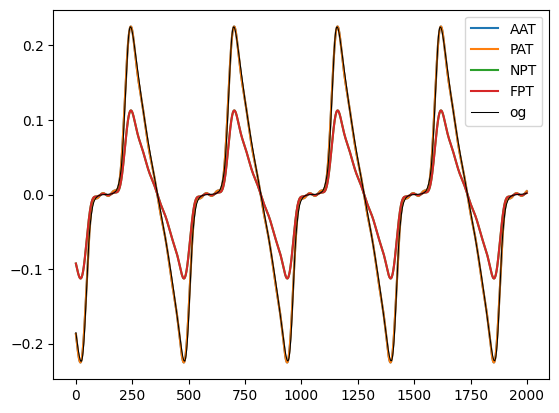

"\nOKAY SO BASICALLY IM TRYING TO SEE WHAT THE BARE MIN AMOUNT OF INFORMATION I NEED IS TO REPRODUCE A PATH THROUGH SPACE\nTRIED FOURIER SIGNAL THAT WORKSDUH\nTRIED CUTTING OFF FOURIER COMPONENTS BELOW A CERTAIN THRESHOLD, WORKS OKAY, FIGURE OUT IDEAL THRESHOLD\nTRIED ONLY GETTING PEAK FOURIER COMPONENTS, DOESN'T WORK, WONDER WHY\n    CAUSE I WAS DOING STUFF WRONG ITS ACTUALLY COMPARABLE\nMAYBE NEXT TRY GETTING NEIGHBORHOOD AROUND PEAKS? HOW WIDE SHOULD NEIGHBORHOOD BE?? FREQUENCY DEPENDENT? WEIRD????\n    ALSO COMPARABLE\nALSO FOR NEXT TIME SEE ABOUT GETTING SOME SORT OF GRADIENT FUNCTION FOR SPACETIME INTERVAL\nSEE IF POSSIBLE TO CORRECT RECONSTRUCTED PATH INTO SOMETHING THAT'S NOT DOOKIE\nALSO ALSO SEE IF ITS POSSIBLE TO GET ARBITRARY TIMES IN SIGNAL FROM FOURIER TRANSFORM? LIKE A FUNCTION BASICALLY\nALSO ALSO ALSO TALK TO JEREMY AND SEE IF THIS IS KINDA STUPID TO BE WORKING ON RIGHT NOW\n"

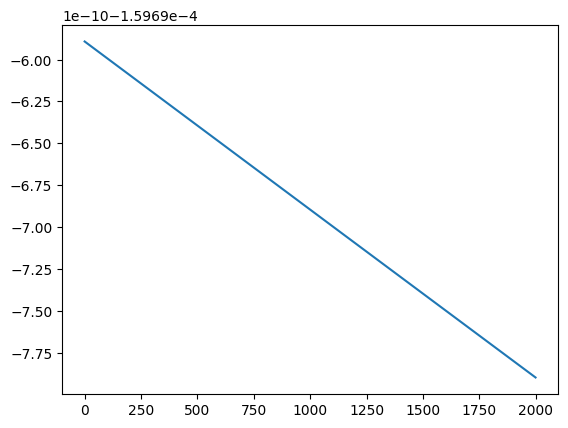

In [607]:
real=1
ti, tf = 0, 2000
a, b = op.get_index(t, ti), op.get_index(t, tf)
AAT_rebuild = ifft(AAT_plot)
PAT_rebuild = ifft(PAT_plot)
NPT_rebuild = ifft(NPT_plot)
FPT_rebuild = ifft(FPT_plot)
if real == True:
    print(0)
    plt.plot(t[a:b], AAT_rebuild[a:b], label="AAT")
    plt.plot(t[a:b], PAT_rebuild[a:b], label="PAT")
    plt.plot(t[a:b], NPT_rebuild[a:b], label="NPT")
    plt.plot(t[a:b], NPT_rebuild[a:b], label="FPT")
    plt.plot(t[a:b], us[ix][a:b], label="og", color="k", linewidth=0.75)
    #plt.plot(old_t[a:b], test["raw"][a:b,ix+4])
    
else:
    plt.plot(t[a:b], 100*abs(us[ix][a:b] - AAT_rebuild[a:b])/max(abs(us[ix])), label="AAT")
    plt.plot(t[a:b], 100*abs(us[ix][a:b] - PAT_rebuild[a:b])/max(abs(us[ix])), label="PAT")
    plt.plot(t[a:b], 100*abs(us[ix][a:b] - NPT_rebuild[a:b])/max(abs(us[ix])), label="NPT")
    #plt.plot(t[a:b], 100*abs(us[ix][a:b] - AAT_rebuild[a:b])/max(abs(us[ix])), label="AAT")
plt.legend()
plt.show()

new_pat = np.insert(PAT_ix[:len(PAT_ix)], 0, 0)
'''
print(PAT_ix[:len(PAT_ix)//2])
print(list(PAT_ix[:len(PAT_ix)//2]))
print(list(PAT_ix[:len(PAT_ix)//2]))
print(len(PAT_ix))
print(new_pat)
print(xf[new_pat])
print(yf_s[ix][new_pat])
'''

new_time = np.arange(2000)
oop = np.zeros(2000, dtype='complex128')
for i in range(len(new_pat)):
    oop += yf_s[ix][i]*np.exp(2.0j * np.pi * xf[i] * new_time/N)
    #if i != 0:
    #    plt.plot(yf_s[ix][i]*np.exp(2.0j * np.pi * xf[i] * oop/N).real)
oop = oop/N
plt.plot(new_time, oop)

'''
OKAY SO BASICALLY IM TRYING TO SEE WHAT THE BARE MIN AMOUNT OF INFORMATION I NEED IS TO REPRODUCE A PATH THROUGH SPACE
TRIED FOURIER SIGNAL THAT WORKSDUH
TRIED CUTTING OFF FOURIER COMPONENTS BELOW A CERTAIN THRESHOLD, WORKS OKAY, FIGURE OUT IDEAL THRESHOLD
TRIED ONLY GETTING PEAK FOURIER COMPONENTS, DOESN'T WORK, WONDER WHY
    CAUSE I WAS DOING STUFF WRONG ITS ACTUALLY COMPARABLE
MAYBE NEXT TRY GETTING NEIGHBORHOOD AROUND PEAKS? HOW WIDE SHOULD NEIGHBORHOOD BE?? FREQUENCY DEPENDENT? WEIRD????
    ALSO COMPARABLE
ALSO FOR NEXT TIME SEE ABOUT GETTING SOME SORT OF GRADIENT FUNCTION FOR SPACETIME INTERVAL
SEE IF POSSIBLE TO CORRECT RECONSTRUCTED PATH INTO SOMETHING THAT'S NOT DOOKIE
ALSO ALSO SEE IF ITS POSSIBLE TO GET ARBITRARY TIMES IN SIGNAL FROM FOURIER TRANSFORM? LIKE A FUNCTION BASICALLY
ALSO ALSO ALSO TALK TO JEREMY AND SEE IF THIS IS KINDA STUPID TO BE WORKING ON RIGHT NOW
'''

-0.26785044429833255


(array([100]), array([3]))

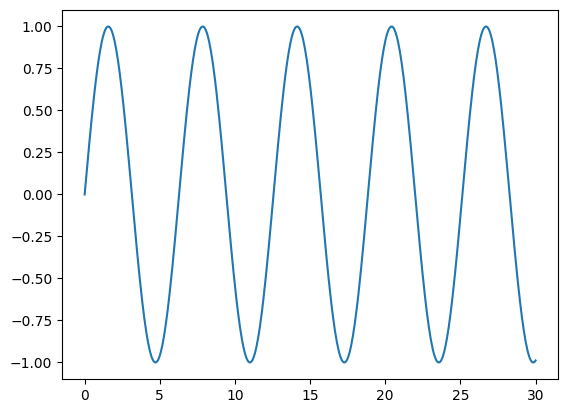

In [307]:
time = np.linspace(0, 30, 500)
func = np.sin(time)
plt.plot(time, func)
#plt.plot(time, 0.5*(np.roll(func,1) + np.roll(func, -1)))
#plt.plot(time, np.where(func > 0.5*(np.roll(func,1) + np.roll(func, -1)), func, -0.25))
#plt.xlim(1.5,1.64)
#plt.ylim(0.995, 1.005)
print(func[100])
np.where(func[:, None] == np.array([0.1, -0.33, 0.76, func[100]])[None, :])

In [303]:
npArr = np.array([
    [1, 4, 5, 5, 3],
    [2, 5, 6, 6, 1],
    [0, 0, 1, 0, 0],
    [3, 3, 2, 4, 3]])

arr = np.array([3,5,8])
print(arr[:,None, None])
print(np.where(npArr[None,:,:] == arr[:,None, None]))
#print(np.where(npArr[None,:,:] == arr[:,None, None], 0, a))
#np.min(np.where(npArr[None,:,:] == arr[:,None,None], 0, a),0)


[[[3]]

 [[5]]

 [[8]]]
(array([0, 0, 0, 0, 1, 1, 1]), array([0, 3, 3, 3, 0, 0, 1]), array([4, 0, 1, 4, 2, 3, 1]))


In [328]:
bool(np.sum([False, True, False, True]))

True

In [243]:
#val = np.unique([np.arange(val - 3, val + 3 + 1) for val in [1, 30, 35]])
#print(val)
print(xf)
print(np.diff(xf))
print(t[-1])
print(10/t[-1])

[0.00000000e+00 1.50082617e-05 3.00165233e-05 ... 9.63605440e-01
 9.63620448e-01 9.63635456e-01]
[1.50082617e-05 1.50082617e-05 1.50082617e-05 ... 1.50082617e-05
 1.50082617e-05 1.50082617e-05]
66629.9684115559
0.00015008261655224888


I'm suddenly not sure if this is even really feasible? let me break this down and see if something I'm doing stops making sense

1) Receive initial state
2) Calculate E,L,C,p,e, etc.
3) MLA uses appropriate info to create [frequency set]
4) Reconstruct approximate path from inverse fourier transform
5) Do (iterative?) correction to make sure path is physical
6) Profit

Okay BUT steps 3 and 4 are the complicated bits
I've been trying to take fourier transforms of example orbits and see if there's a way to extract "essential" information?
Like, if there's some minimum amount of frequency information I need to reliably reproduce something close to the orbital path, which I'm taking to be "get the velocities to all be within 5% of their true values". 
Maybe it doesn't have to be the same number of frequencies each time? But the problem is still "How do I do that?"
Also! I didn't even consider how the phase information might feed in? Technically this is just something for the ML Program to deal with, right? yes, I believe so. The part *I* need to worry about is figuring out how to *extract* the information I need.

How should the *training* work?

1) Generate a random E,L,C from the allowable space (dependent on a, how to find for C??)
     Track down Chandrasekhar I guess? If that even helps
     Holy heck this is a trip
2) Generate an orbit (with random allowable position, but keep track of it) w/ OTOO ~50 orbits
3) Get the fourier transform of all the velocity components, extract whatever peak frequencies+coefficients get that to match to within XX percent
     I have to figure out what this percentage is? That's a pre-testing thing, presumably there's a cutoff where this magical "allowable orbit converter" function I'm making ends up returning something too unlike the original orbit
     Speaking of, I should make that
     Speaking of, I should make the thing that turns frequencies+coefficients into functions
4) Repeat a bajillion times
5) Train an algorithm to come up with appropriate whosiwhatsit

In [5]:
np.abs(1.0 + 3.0j)

np.float64(3.1622776601683795)

29
(np.float64(-100.0), np.float64(2100.0))
(np.float64(-0.13388676536736904), np.float64(0.13387445091301095))
Error in callback <function _draw_all_if_interactive at 0x00000211420D3100> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

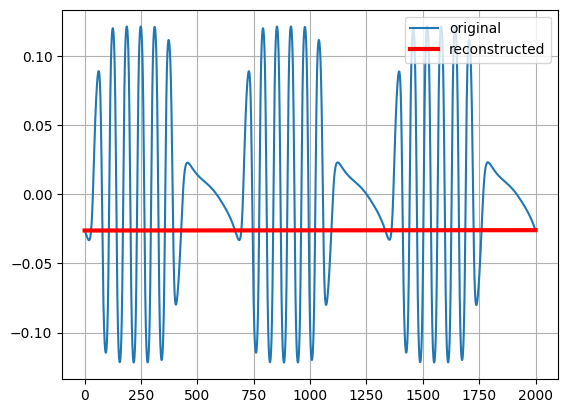

In [147]:

"""Test partial (i.e. filtered) Fourier reconstruction of a square signal.

Args:
    N (int): Number of time (and frequency) points. We support both even
        and odd N.
    square_width (int): Number of "high" points in the time domain signal.
        This number must be less than or equal to N.
    num_coefficients (int): Number of frequencies, in addition to the dc
        term, to use in Fourier reconstruction. This is the number of
        positive frequencies _and_ the number of negative frequencies.
        Therefore, if N is odd, this number cannot be larger than
        (N - 1)/2, and if N is even this number cannot be larger than
        N/2.
"""
#M = 2000
time_axis = np.linspace(0, 2000, N)

#signal = square_function(N, square_width)
ft = yf_s[ix][new_pat]

reconstructed_signal = np.zeros(N, dtype="complex128")
reconstructed_signal += ft[0] * np.ones(N)
# Adding the dc term explicitly makes the looping easier in the next step.
P = len(new_pat)
print(P)
for k in range((P-1)//2):
    #k += 1  # Bump by one since we already took care of the dc term.
    #print(xf[k])
    #reconstructed_signal += ft[k] * np.exp(
    #    1.0j*2 * np.pi * (xf[k]) * time_axis / N)
    
    k += 1  # Bump by one since we already took care of the dc term.
    if k == P-k:
        reconstructed_signal += ft[k] * np.exp(
            1.0j*2 * np.pi * (xf[k]) * time_axis / N)
    # This catches the case where N is even and ensures we don't double-
    # count the frequency k=N/2.

    else:
        reconstructed_signal += ft[k] * np.exp(
            1.0j*2 * np.pi * (xf[k]) * time_axis / N)
        reconstructed_signal += ft[P-k] * np.exp(
            1.0j*2 * np.pi * (xf[-k]) * time_axis / N)

reconstructed_signal = reconstructed_signal / N
# Normalize by the number of points in the signal. numpy's discete Fourier
# transform convention puts the (1/N) normalization factor in the inverse
# transform, so we have to do it here.

plt.plot(t[:op.get_index(t, 2000)], us[ix][:op.get_index(t, 2000)],
            markersize=20,
            label='original')
plt.plot(time_axis, reconstructed_signal.real,
            'r-', linewidth=3,
            label='reconstructed')
# The imaginary part is zero anyway. We take the real part to
# avoid matplotlib warnings.

plt.grid()
plt.legend(loc='upper right')
print(plt.xlim())
print(plt.ylim())

29


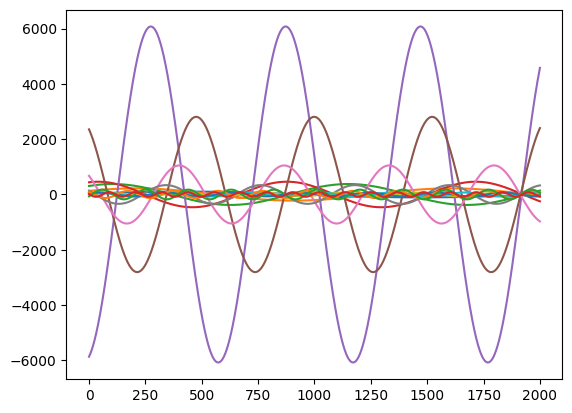

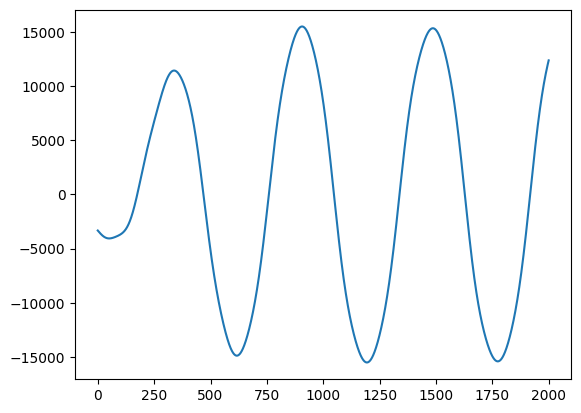

In [132]:
print(len(new_pat))
time_axis = np.arange(0, 2000, 0.1)
gorp = np.zeros(len(time_axis), dtype='complex128')
P = len(new_pat)
gorp += yf_s[ix][new_pat[i]]*np.ones(len(time_axis))
for i in range((P-1)//2):
    i += 1
    gorp += (yf_s[ix][new_pat[i]]*np.exp(1.0j * xf[new_pat[i]]* time_axis))
    gorp += (yf_s[ix][new_pat[-i]]*np.exp(1.0j * -xf[new_pat[i]]* time_axis))
    plt.plot(time_axis, (yf_s[ix][new_pat[i]]*np.exp(1.0j * xf[new_pat[i]]* time_axis)).real)
plt.show()
plt.plot(time_axis, gorp.real)

In [117]:
print(len(new_pat))
time_axis = np.arange(0, 2000, 0.1)
gorp = np.zeros(len(time_axis), dtype='complex128')
lim = 0.01
for i in range(len(xf)):
    gorp += (yf_s[ix][i]*np.exp(1.0j * xf[i]* time_axis))
    #plt.plot(time_axis, (yf_s[ix][i]*np.exp(1.0j * xf[i]* time_axis)).real)
    if i/len(xf) >= lim:
        print(lim)
        lim += 0.01
plt.show()
plt.plot(time_axis, gorp.real)

29
0.01
0.02
0.03
0.04


KeyboardInterrupt: 

In [105]:
print(len(xf))

64208


In [130]:
L = len(xf)
print(L)
print(yf_s[ix][1:5], yf_s[ix][-4:])

64208
[-0.26025899-0.00097988j -0.23800548-0.00199412j -0.26728565-0.00787354j
 -0.27848648+0.00779381j] [-0.27848648-0.00779381j -0.26728565+0.00787354j -0.23800548+0.00199412j
 -0.26025899+0.00097988j]


In [144]:
xf[new_pat[:P//2 +1]]
yf_s[ix][new_pat[:P//2 +1]]


array([  -12.14661522   -0.j        ,    29.76876439 -100.62044326j,
         129.91661445 -179.62628963j,   307.26338981 -221.20625582j,
         440.69593465 -138.01582614j, -5865.2009046 -1580.38219491j,
        2354.64620451+1528.69218931j,   673.62188639 +805.73170332j,
         136.78176453 +309.47919716j,    17.47157156  -61.86315524j,
          34.23800802  -63.73683704j,    42.52127729  -53.39266345j,
          86.00800649  +96.38237492j,   -67.75775223 -161.75854413j,
           9.5228393   +82.38200436j])

In [145]:
print(N)

128417


# OKAY SO YES
I've shown below that I CAN just extract the key frequencies and coefficients, then apply them to an abritrary time thing and have it not blow up in my face. The important thing is to make sure the original data is interpolated, or else the true frequencies/timing get thrown off.

Now I'm gonna try and package all of this into a convenient function so I don't have to run back and forth everywhere to test stuff.

[    0    93   186   279   372   465   558   651   744 98466 98559 98652
 98745 98838 98931 99024 99117] 17
(array([ 93, 186, 279, 372, 465, 558, 651, 744]),)
[  0  93 186 279 372 465 558 651 744]
[-4.51992839e-01   -0.j         -7.11589585e+03+1704.54819031j
 -7.94745663e+02-1563.55514184j -1.96752276e+03+1675.27566179j
  1.72513456e+02 +125.16445182j -3.80474326e+02 +912.17351037j
  4.90783086e+02  +78.42848229j  1.68679555e+01 +225.28519087j
  3.02439015e+02  -97.82074157j]


c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\.venv\Lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\.venv\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


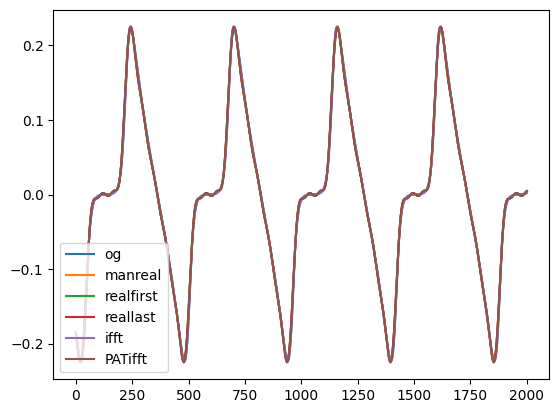

In [566]:
timed = np.arange(0,2000, 0.1)
new_pat = np.insert(PAT_ix[:len(PAT_ix)], 0, 0)
P = len(new_pat)
print(new_pat, len(new_pat))
#print(peak_ix)
print(np.where(np.logical_and(np.sum((yf_s[ix][:N//2, None] == yf_s[ix][peak_ix][None, :])[0], axis=1), np.abs(yf_s[ix][:N//2])/absval >= thresh)))
sub_pat = new_pat[:P//2 + 1]
print(sub_pat)
recon = np.ones(len(timed))*(0.0 + 0.0j)
recon2 = np.ones(len(timed))*(0.0 + 0.0j)
recon3 = np.ones(len(timed))*(0.0 + 0.0j)

print(yf_s[ix][sub_pat])
for i in sub_pat:
    recon += (np.real(yf_s[ix][i])*np.cos(2*np.pi*xf[i]*timed) - np.imag(yf_s[ix][i])*np.sin(2*np.pi*xf[i]*timed))/(N)
    recon2 += np.real(yf_s[ix][i]*np.exp(2*np.pi*1.0j*xf[i]*timed))/(N)
    recon3 += yf_s[ix][i]*np.exp(2*np.pi*1.0j*xf[i]*timed)

recon3 = np.real(recon3/(N))
plt.plot(t[:op.get_index(t, 2000)], us[ix][:op.get_index(t, 2000)], label="og")
plt.plot(timed, recon, label="manreal")
plt.plot(timed, recon2, label="realfirst")
plt.plot(timed, recon3, label="reallast")
plt.plot(t[:op.get_index(t, 2000)], 1*ifft(yf_s[ix])[:op.get_index(t, 2000)], label="ifft")
plt.plot(t[:op.get_index(t, 2000)], ifft(PAT_plot)[:op.get_index(t, 2000)], label="PATifft")
plt.legend()
#print(len(np.where(PAT_plot != 0)[0]))



[nan inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf]
[0.         1.         1.88172043 1.94623656 2.         2.05376344
 2.88172043 2.94623656 3.         3.02150538 3.05376344 3.11827957
 3.94623656 4.         4.05376344 5.         6.        ]
[0.         0.53142857 1.         1.03428571 1.06285714 1.09142857
 1.53142857 1.56571429 1.59428571 1.60571429 1.62285714 1.65714286
 2.09714286 2.12571429 2.15428571 2.65714286 3.18857143]
[0.         0.51381215 0.96685083 1.         1.02762431 1.05524862
 1.48066298 1.51381215 1.54143646 1.55248619 1.56906077 1.60220994
 2.02762431 2.05524862 2.08287293 2.56906077 3.08287293]
[0.         0.5        0.94086022 0.97311828 1.         1.02688172
 1.44086022 1.47311828 1.5        1.51075269 1.52688172 1.55913978
 1.97311828 2.         2.02688172 2.5        3.        ]
[0.         0.48691099 0.91623037 0.94764398 0.97382199 1.
 1.40314136 1.43455497 1.46073298 1.47120419 1.48691099 1.51832461
 1.92146597 1.94764398 1.97382199 2.4345

c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\.venv\Lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\.venv\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_27068\2706245403.py:3: RuntimeWarning: divide by zero encountered in divide
  print(xf[sub_pat]/i)
C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_27068\2706245403.py:3: RuntimeWarning: invalid value encountered in divide
  print(xf[sub_pat]/i)


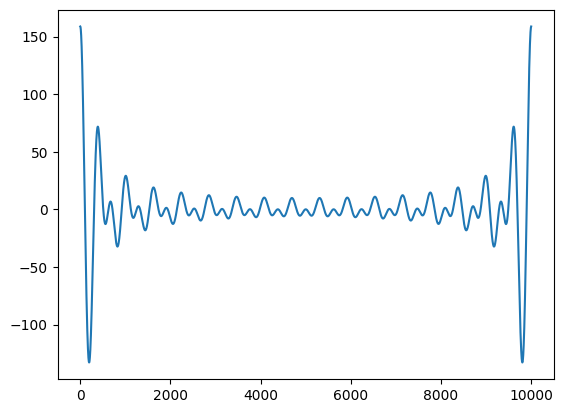

In [230]:
plt.plot(ifft(new_pat, 10000))
for i in xf[sub_pat]:
    print(xf[sub_pat]/i)

In [272]:
#print(xf[sub_pat])
#print(np.diff(xf[sub_pat]))
#for i in np.diff(xf[sub_pat]):
    #print(np.diff(xf[sub_pat])/i)
jip = np.min(np.diff(xf[sub_pat]))
#print(jip)
#print(np.diff(xf[sub_pat])/jip)
xf_mim = np.arange(0, xf[sub_pat[-1]] + jip, jip/2)
#print(np.round(xf[sub_pat][1], 15))
#print(np.round(xf_mim[93], 15))
#print(xf_mim[93:])
xf_mim = np.array([num if np.round(num, 15) in np.round(xf[sub_pat], 15) else 0.0 for num in xf_mim])
#print(xf_mim)
print(xf[sub_pat])
print(np.insert(xf_mim[np.where(xf_mim != 0)[0]], 0,0))

[0.         0.00218198 0.00410587 0.00424665 0.00436396 0.00448127
 0.00628785 0.00642862 0.00654593 0.00659286 0.00666324 0.00680402
 0.0086106  0.00872791 0.00884522 0.01090989 0.01309187]
[0.         0.00218198 0.00410587 0.00424665 0.00436396 0.00448127
 0.00628785 0.00642862 0.00654593 0.00659286 0.00666324 0.00680402
 0.0086106  0.00872791 0.00884522 0.01090989 0.01309187]


2.3462128974037654e-05
2.3462128974037654e-05
[0.         0.00218198 0.00410587 0.00424665 0.00436396 0.00448127
 0.00628785 0.00642862 0.00654593 0.00659286 0.00666324 0.00680402
 0.0086106  0.00872791 0.00884522 0.01090989 0.01309187]
[0.         0.00218198 0.00410587 0.00424665 0.00436396 0.00448127
 0.00628785 0.00642862 0.00654593 0.00659286 0.00666324 0.00680402
 0.0086106  0.00872791 0.00884522 0.01090989 0.01309187]
[0.00000000e+00 7.97972799e-16 1.50140317e-15 1.55257751e-15
 1.59594560e-15 1.63931368e-15 2.29937597e-15 2.35055031e-15
 2.39391840e-15 2.41039827e-15 2.43641912e-15 2.48759346e-15
 3.14852311e-15 3.19189120e-15 3.23352456e-15 3.98812927e-15
 4.78783679e-15]


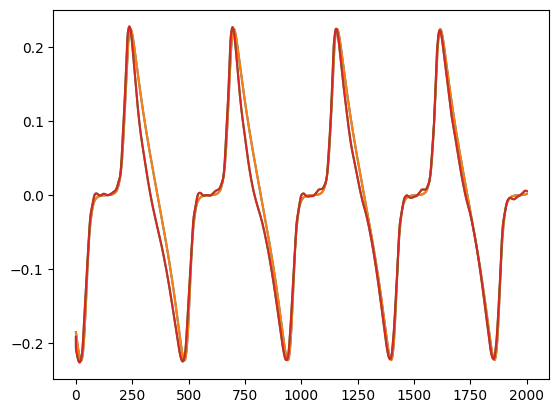

In [457]:
plt.plot(t[:op.get_index(t, 2000)], us[ix][:op.get_index(t, 2000)])
plt.plot(t[:op.get_index(t, 2000)], ifft(yf_s[ix])[:op.get_index(t, 2000)])
plt.plot(t[:op.get_index(t, 2000)], PAT_rebuild[:op.get_index(t, 2000)])
plt.plot(t[:op.get_index(t, 2000)], ifft(PAT_plot)[:op.get_index(t, 2000)])
freqs, coeffs = xf[sub_pat], yf_s[ix][sub_pat]
div = min(np.diff(freqs))
jump = np.nanmin(np.where(np.diff(freqs)%div > 1e-15, np.diff(freqs)%div, np.nan))
exp_freqs = np.arange(0, jump*50000, jump)
exp_coeffs = np.zeros(len(exp_freqs), dtype="complex128")
for i in range(len(freqs)):
    idx = np.where(np.round(exp_freqs, 13) == np.round(freqs[i],13))
#    #print(np.where(np.round(exp_freqs, 14) == np.round(freqs[i],14)))
    exp_coeffs[idx] = coeffs[i]
#np.where(val in exp_fre)
#mask = np.array([True if np.round(exp_freqs[i], 14) in np.round(freqs, 14) else False for i in range(len(exp_freqs))])
#print(np.where(exp_coeffs != 0), len(exp_coeffs))
exp_coeffs = np.append(exp_coeffs, exp_coeffs[1:][::-1])
#plt.plot(1*np.arange(len(exp_coeffs)), ifft(exp_coeffs))
#plt.plot(xf, np.abs(yf_s[ix][:N//2]))#2.0/N * np.abs(yf_s[i][0:N//2])
#plt.plot(exp_freqs, np.abs(exp_coeffs[:50000]))
#plt.plot(xf, np.abs(PAT_plot[:N//2]))

#plt.plot(ifft(exp_coeffs))

#print(len(exp_coeffs))
#print(xf[:10])
#print(exp_freqs[:10])
#print(len(xf), len(exp_freqs))
#print(len(yf_s[ix]), len(ifft(yf_s[ix])))
#plt.xlim(-100, 2100)

print(1/t[-1])
print(xf[1])
#print(xf[-1])
#print(1/xf[-1])
#print(xf[-1]/xf[1])
#print(N//2)
#plt.show()
#plt.plot()
#plt.xscale("log")
#plt.yscale("log")
#print(sub_pat)
#print(PAT_plot[:10])
#print(exp_coeffs[:10])
print(xf[np.where(PAT_plot[:N//2] != 0)[0]])
print(exp_freqs[np.where(exp_coeffs[:N//2] != 0)[0]])
print(xf[np.where(PAT_plot[:N//2] != 0)[0]]- exp_freqs[np.where(exp_coeffs[:N//2] != 0)[0]])
#plt.xlim(2e-3, 1.6e-2)



In [322]:
goop = np.array([1/7, 1/6, 1/5, 1/4, 1/3, 1/2])
div = min(abs(np.diff(goop)))
print(div)
print(np.diff(goop)/div)
print(np.diff(goop)%div)
sub = np.where(np.diff(goop)%div > 1e-15, np.diff(goop)%div, np.nan)
print(np.nanmin(sub))
harb = np.arange(0, goop[-1] + np.nanmin(sub), np.nanmin(sub))
#len(harb)
print(1/5 in harb)
print(harb[-2])
print(np.round(harb[-2], 14))
#print()
harb = np.array([num if np.round(num, 14) in np.round(goop, 14) else 0.0 for num in harb])
print("u")
print(np.round(harb[-2], 10))
print(1/5 in harb)
print(harb[-2])
print(goop)
print(np.insert(harb[np.where(harb != 0)[0]], 0,0))

0.023809523809523808
[1.  1.4 2.1 3.5 7. ]
[0.00000000e+00 9.52380952e-03 2.38095238e-03 1.19047619e-02
 2.77555756e-17]
0.0023809523809523725
False
0.4999999999999982
0.5
u
0.5
False
0.4999999999999982
[0.14285714 0.16666667 0.2        0.25       0.33333333 0.5       ]
[0.         0.14285714 0.16666667 0.2        0.25       0.33333333
 0.5       ]


In [318]:
np.round(0.4999999999999982, 10)

np.float64(0.5)

In [326]:
xs = np.asarray([45, 67, 32, 52, 94, 64, 21])
ys = np.asarray([67, 94])

mask=xs[np.isin(xs,ys)]
print(xs[mask])

IndexError: index 67 is out of bounds for axis 0 with size 7

In [369]:
hurp = np.arange(10)
print(hurp)
print(hurp[1:][::-1])
print(yf_s[ix][1:6])
print(yf_s[ix][-5:])

[0 1 2 3 4 5 6 7 8 9]
[9 8 7 6 5 4 3 2 1]
[ -8.6186165 +0.85189818j  -9.8924642 -2.71419019j
 -17.61837487-2.34700619j -20.25528376-0.6320486j
 -52.55632147+2.65317442j]
[-52.55632147-2.65317442j -20.25528376+0.6320486j
 -17.61837487+2.34700619j  -9.8924642 +2.71419019j
  -8.6186165 -0.85189818j]


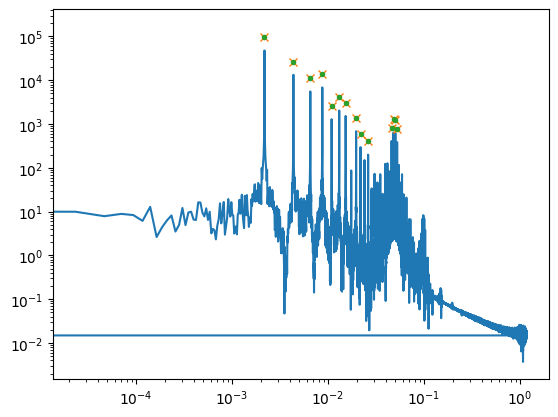

15 15
(1.7602449361417574+0j)
(1.7602449361417574+0j)


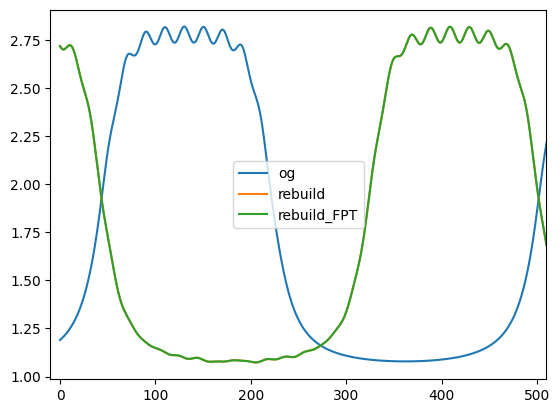

In [ ]:
#Funtion that extracts essential frequency information
#What counts as essential tbd
def peak_extractor(sim, thresh):
    from scipy.fft import fft, fftfreq, ifft
    from scipy.signal import argrelmin, find_peaks
    old_t = sim["time"]
    t = np.linspace(old_t[0], old_t[-1], len(old_t))
    print(len(t))
    N = len(old_t)
    T = old_t[-1]/N
    us = np.array([np.interp(t, old_t, sim["raw"][:,i+4]) for i in range(4)])
    yf_s = np.array([fft(u) for u in us])
    xf = fftfreq(N, T)

    #Peaks above threshold (PAT) 
    ## Find the highest value and include all values that are greater than (threshold*highest_value) AND are peaks
    absval = np.max(np.abs(yf_s), axis=1)
    peak_ix = [argrelmin(-np.abs(yf_s[ix][:N//2]))[0] for ix in range(4)]
    #print(peak_ix)

    #Relevant indices
    #Ignoring indices that correspond to negative frequency terms
    PAT_ix = [np.insert(np.where(np.logical_and(np.sum((yf_s[ix][:N//2, None] == yf_s[ix][peak_ix[ix]][None, :]), axis=1), np.abs(yf_s[ix][:N//2])/absval[ix] >= thresh)), 0, 0) for ix in range(4)]
    #The frequencies at peaks
    peak_xf = [xf[PAT_ix[ix]] for ix in range(4)]                
    #The (complex) coefficients of those frequencies, scaled so we don't have to care how long the original datalist was
    #Also add a factor of 2 to account for ignoring the negative frequencies: f= x Hz and f= -x Hz work together for that contribution
    peak_yf_s = [2*yf_s[ix][PAT_ix[ix]]/N for ix in range(4)]  
    for i in range(4):
        #That's not true for f = 0 Hz, so we have to go back in and divide that by 2 again
        peak_yf_s[i][0] *= 1/2

    #test this find peaks thing
    print(absval*thresh)
    new_peak_ix = [find_peaks(np.abs(yf_s[ix]), threshold=absval[ix]*thresh)[0] for ix in range(4)]
    FPT_ix = [np.insert(np.where(np.sum((yf_s[ix][:N//2, None] == yf_s[ix][new_peak_ix[ix]][None, :]), axis=1)), 0, 0) for ix in range(4)]
    peak_xf_FPT = [xf[FPT_ix[ix]] for ix in range(4)] 
    peak_yf_s_FPT = [2*yf_s[ix][FPT_ix[ix]]/N for ix in range(4)]  
    for i in range(4):
        #That's not true for f = 0 Hz, so we have to go back in and divide that by 2 again
        peak_yf_s_FPT[i][0] *= 1/2

    return xf, yf_s, peak_xf, peak_yf_s, peak_xf_FPT, peak_yf_s_FPT

#x_full, y_full, x_peaks, y_peaks, x_peaks_new, y_peaks_new = peak_extractor(test, 0.001)
ix = 0
plt.plot(x_full, np.abs(y_full[ix]))
plt.plot(x_peaks[ix], np.abs(y_peaks[ix])*len(test["time"]), "x")
plt.plot(x_peaks_new[ix], np.abs(y_peaks_new[ix])*len(test["time"]), ".")
plt.xscale("log")
plt.yscale("log")
plt.show()

timed = np.linspace(0, 1/x_full[1], len(x_full))

plt.plot(test["time"], test["raw"][:, 4 + ix], label="og")
#plt.plot(timed, ifft(yf_s[ix]), label="ifft", linestyle="--")

plt.xlim(-10, 510)

print(len(x_peaks[ix]), len(x_peaks_new[ix]))
def rebuild(key_freqs, key_coeffs):
    time = np.arange(0, 2000, 0.01)
    rebuild = time*(0.0 + 0.0j)
    print(key_coeffs[0])

    for i in range(len(key_freqs)):
        rebuild += key_coeffs[i]*np.exp(2.0*np.pi*1.0j*key_freqs[i]*time)
        #recon3 +=  yf_s[ix][i]  *np.exp(2*  np.pi*1.0j*xf[i]*      timed)
    
    rebuild = np.real(rebuild)

    return time, rebuild

#x, y = 
plt.plot(*rebuild(x_peaks[ix], y_peaks[ix]), label="rebuild")
plt.plot(*rebuild(x_peaks_new[ix], y_peaks_new[ix]), label="rebuild_FPT")
#plt.xlim(250, 450)
#plt.ylim(0, 0.1)
plt.legend()

#The real question is, can I distinguish between similar orbits in different positions like this?
#For example, same (p,e,i,a), but one that starts at phi=pi/2 instead of phi=0
#That takes advantage of the symmetry, but what about one that starts "further" in the orbit? Try that stuff in the next bit.

#Nothing that can't be distinguished with a starting state, which is what we'll get anyway assuming the next step can be done well


In [483]:
print(np.reshape(np.arange(12), (3,4)))
print(np.max(np.reshape(np.arange(12), (3,4)), axis=1))

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]
[ 3  7 11]


In [ ]:
#use the original "test" as the baseline, start from the starting state in "raw"
print(test["raw"][0])
test_pos, test_vel = np.copy(test["raw"][0, :4]), np.copy(test["raw"][0, 4:])
print(test_pos, test_vel)
test1_a = ml.EGTimer(0.8, 1e-100, endflag="rad_orbit > 100", pos=test_pos, veltrue=test_vel, bonk=3, label="pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-11)
#same stuff, BUT change the initial phi so it *should* look like a rotated version of the original
test_pos[3] = 3*np.pi/2  #90 rotation
print(test_pos, test_vel)
#test1_b = ml.EGTimer(0.8, 1e-100, endflag="rad_orbit > 100", pos=test_pos, veltrue=test_vel, bonk=3, label="pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-11)
#Similar thing, but now use a state from further in the orignal orbit 
ind = op.get_index(test["raw"][:,3], np.pi/2)   #Index where original orbit was at phi=pi/2
test_pos, test_vel = np.copy(test["raw"][ind*10, :4]), np.copy(test["raw"][ind*10, 4:])
test_pos[0] = 0  #set the start to 0 just for gp
print(test_pos, test_vel)
test1_c = ml.EGTimer(0.8, 1e-100, endflag="rad_orbit > 100", pos=test_pos, veltrue=test_vel, bonk=3, label="pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-11)

[ 0.         10.          1.57079633  0.          1.18955091 -0.18520178
 -0.02126881  0.02293015]
[ 0.         10.          1.57079633  0.        ] [ 1.18955091 -0.18520178 -0.02126881  0.02293015]
[ 0.         10.          1.57079633  4.71238898] [ 1.18955091 -0.18520178 -0.02126881  0.02293015]
[ 0.          2.62625549  2.17138938 30.61139846] [2.73714888 0.00440237 0.21797554 0.60243559]
new


10000014.870147742it [03:19, 50100.10it/s]                               


99205
[174.63159503   7.316757     5.60721721  23.59904431]
(1.7603104180968185+0j)


(-100.0, 2000.0)

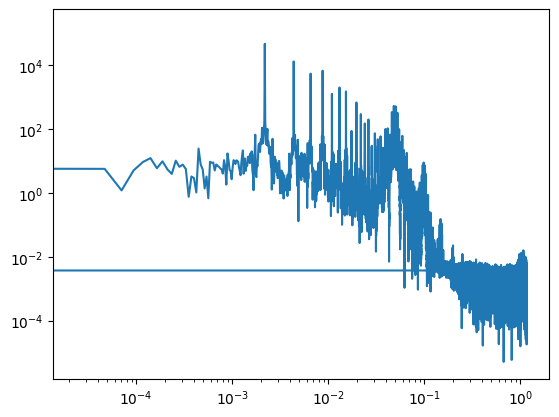

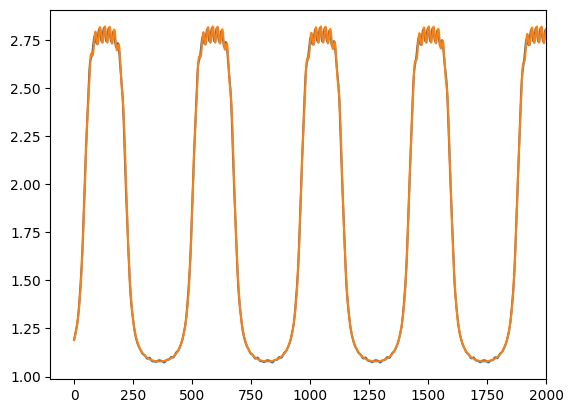

In [725]:
#op.plotvalue3([test1_a, test1_b, test1_c], "time", "radial_v", end=2000)
#op.plotvalue3([test1_a, test1_b, test1_c], "time", "theta_v", end=2000)
#op.plotvalue3([test1_a, test1_b, test1_c], "time", "phi_v", end=2000)

fig1, ax1 = plt.subplots()
fig2, ax2 = plt.subplots()
ix = 0
for sim in [test1_a]:
    x_full, y_full, x_peaks, y_peaks, x_peaks_new, y_peaks_new = peak_extractor(sim, 0.001)
    ax1.plot(x_full, np.abs(y_full[ix]))
    ax2.plot(*rebuild(x_peaks[ix], y_peaks[ix]))


ax1.set_xscale("log")
ax1.set_yscale("log")
ax2.plot(test1_a["raw"][:,0], test1_a["raw"][:,4])
ax2.set_xlim(-100, 2000)



#plt.plot(x_peaks[ix], np.abs(y_peaks[ix])*len(test["time"]), "x")
#plt.plot(x_peaks_new[ix], np.abs(y_peaks_new[ix])*len(test["time"]), ".")
#plt.xscale("log")
#plt.yscale("log")
#plt.show()


Calculating initial velocity from constants E,L,C
new


  0%|          | 0/10000000 [00:00<?, ?it/s, Semilat: 2.903, Ecc 0.159]

10000107.166370489it [01:08, 145174.27it/s, Semilat: 2.903, Ecc 0.159]                              


59009
59009
(59009,)
(4, 59009)
(59009,)


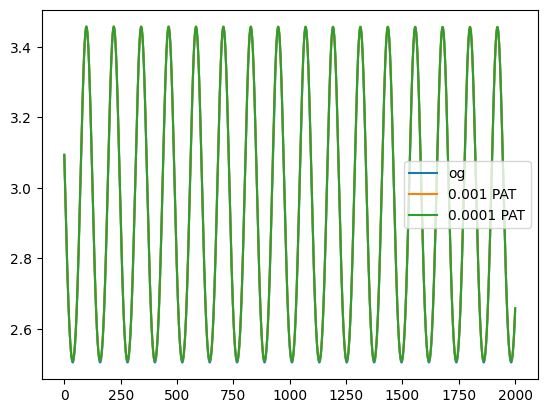

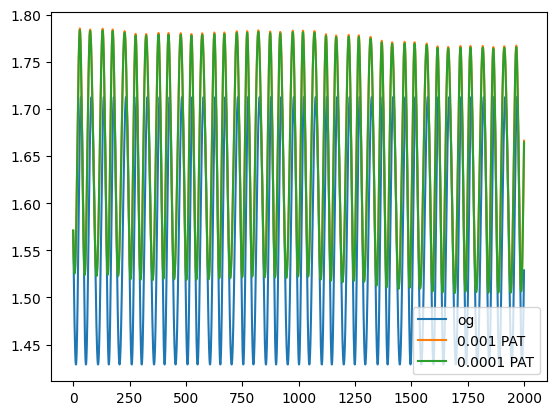

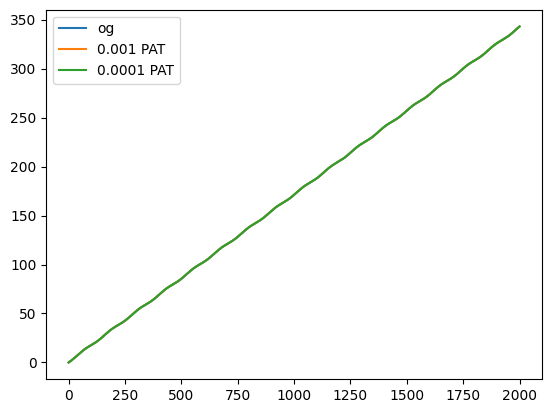

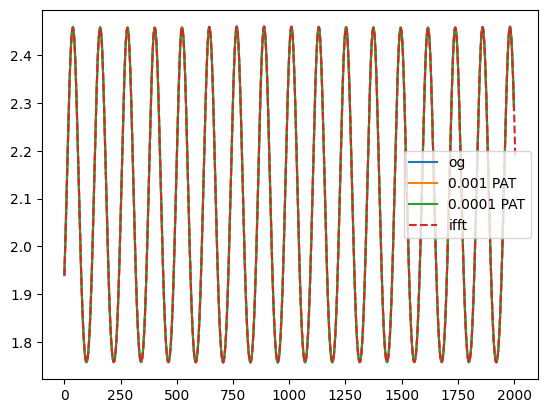

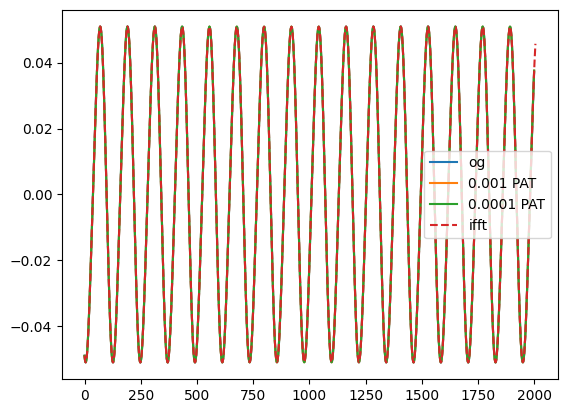

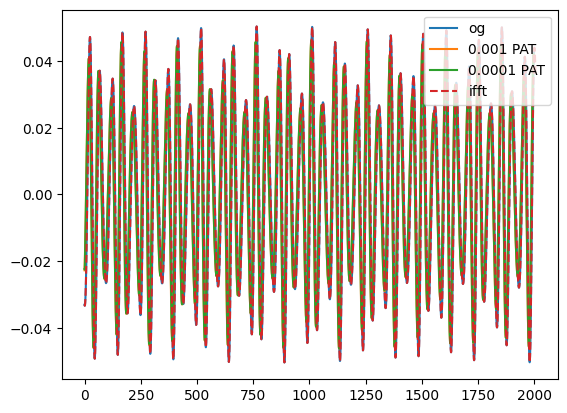

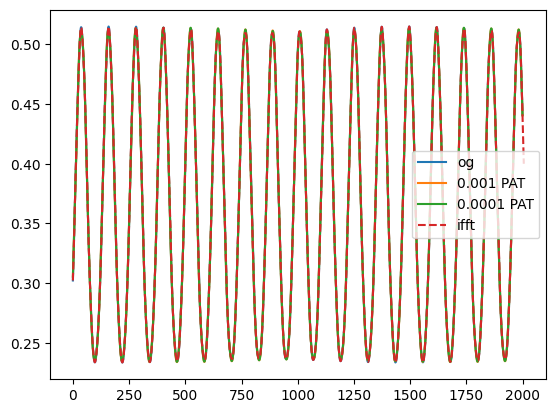

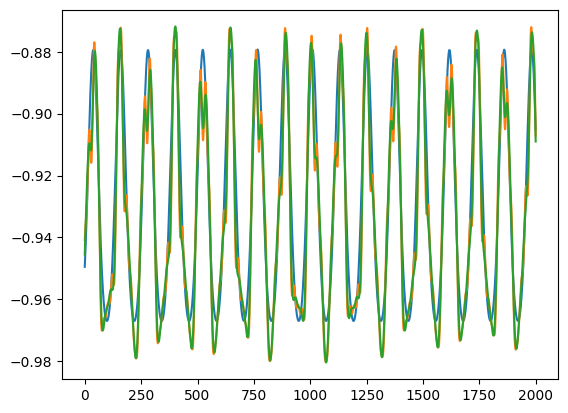

In [45]:
from scipy.fft import fft, fftfreq, ifft
from scipy.signal import argrelmin, find_peaks

def peak_extractor(sim, thresh):
    old_t = sim["time"]
    t = np.linspace(old_t[0], old_t[-1], len(old_t))
    print(len(t))
    N = len(old_t)
    T = old_t[-1]/N
    us = np.array([np.interp(t, old_t, sim["raw"][:,i+4]) for i in range(4)])
    yf_s = np.array([fft(u) for u in us])
    #print(len(yf_s[0]), len(us[0]), "op")
    xf = fftfreq(N, T)
    #print(len(xf))

    #Peaks above threshold (PAT) 
    ## Find the highest value and include all values that are greater than (threshold*highest_value) AND are peaks
    absval = np.max(np.abs(yf_s), axis=1)
    peak_ix = [argrelmin(-np.abs(yf_s[ix][:N//2]))[0] for ix in range(4)]
    #print(peak_ix)

    #Relevant indices
    #Ignoring indices that correspond to negative frequency terms
    PAT_ix = [np.insert(np.where(np.logical_and(np.sum((yf_s[ix][:N//2, None] == yf_s[ix][peak_ix[ix]][None, :]), axis=1), np.abs(yf_s[ix][:N//2])/absval[ix] >= thresh)), 0, 0) for ix in range(4)]
    #The frequencies at peaks
    peak_xf = [xf[PAT_ix[ix]] for ix in range(4)]                
    #The (complex) coefficients of those frequencies, scaled so we don't have to care how long the original datalist was
    #Also add a factor of 2 to account for ignoring the negative frequencies: f= x Hz and f= -x Hz work together for that contribution
    peak_yf_s = [2*yf_s[ix][PAT_ix[ix]]/N for ix in range(4)]  
    for i in range(4):
        #That's not true for f = 0 Hz, so we have to go back in and divide that by 2 again
        peak_yf_s[i][0] *= 1/2

    #test this find peaks thing
    #print(absval*thresh)
    new_peak_ix = [find_peaks(np.abs(yf_s[ix]), threshold=absval[ix]*thresh)[0] for ix in range(4)]
    FPT_ix = [np.insert(np.where(np.sum((yf_s[ix][:N//2, None] == yf_s[ix][new_peak_ix[ix]][None, :]), axis=1)), 0, 0) for ix in range(4)]
    peak_xf_FPT = [xf[FPT_ix[ix]] for ix in range(4)] 
    peak_yf_s_FPT = [2*yf_s[ix][FPT_ix[ix]]/N for ix in range(4)]  
    for i in range(4):
        #That's not true for f = 0 Hz, so we have to go back in and divide that by 2 again
        peak_yf_s_FPT[i][0] *= 1/2

    return xf, yf_s, peak_xf, peak_yf_s, peak_xf_FPT, peak_yf_s_FPT

def full_rebuild(key_freqs, key_coeffs, start_state, div):
    time = np.arange(start_state[0], start_state[0] + 2000, div)
    u_s = np.ones((4, len(time)))*(0.0 + 0.0j)

    for i in range(len(key_freqs)):
        for j in range(len(key_freqs[i])):
            u_s[i] += key_coeffs[i][j]*np.exp(2.0*np.pi*1.0j*key_freqs[i][j]*time)

    u_s = np.transpose(np.real(u_s))           #dtau velocities
    d_pos_s = (u_s[:,1:].T * (div/u_s[:,0])).T #displacements for r, theta, phi  (dq = (dq/dTau)*(dTau/dt)*dt)
    pos_s = np.cumsum(np.insert(d_pos_s[1:], 0, start_state[1:4], axis=0), axis=0)
    #print(np.shape(u_s), np.shape(pos_s))
    pos_s = np.concatenate((np.array([time]).T, pos_s), axis=1)
    #print(np.shape(u_s), np.shape(pos_s))
    full_raw = np.concatenate((pos_s, u_s), axis=1)


    return full_raw
'''
def rebuild(key_freqs, key_coeffs):
    time = np.arange(0, 2000, 0.01)
    rebuild = time*(0.0 + 0.0j)
    print(key_coeffs[0])

    for i in range(len(key_freqs)):
        rebuild += key_coeffs[i]*np.exp(2.0*np.pi*1.0j*key_freqs[i]*time)
        #recon3 +=  yf_s[ix][i]  *np.exp(2*  np.pi*1.0j*xf[i]*      timed)
    
    rebuild = np.real(rebuild)

    return time, rebuild
'''
test1_a = ml.EMRIGenerator(0.9, 1e-100, endflag="rad_orbit > 100", cons=[0.861582, 2.1677, 0.1], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)

x_full, y_full, x_peaks, y_peaks, x_peaks_new, y_peaks_new = peak_extractor(test1_a, 0.001)
x_full2, y_full2, x_peaks2, y_peaks2, x_peaks_new2, y_peaks_new2 = peak_extractor(test1_a, 0.0001)

print(np.shape(x_full))
print(np.shape(y_full))
print(np.shape(y_full[0]))
#np.linspace(0, 1/x_full[1], len(y_full[0])/x_full[1])
#ifft(y_full[0])

raw = full_rebuild(x_peaks, y_peaks, test1_a["raw"][0], 0.1)
raw2 = full_rebuild(x_peaks2, y_peaks2, test1_a["raw"][0], 0.1)
#raw3 = full_rebuild(x_peaks_new, y_peaks_new, test1_a["raw"][0], 0.1)
#raw4 = full_rebuild(x_peaks_new2, y_peaks_new2, test1_a["raw"][0], 0.1)
end = op.get_index(test1_a["time"], 2000)
for i in [1,2,3,4, 5, 6, 7]:
    plt.plot(test1_a["raw"][:end,0], test1_a["raw"][:end,i], label="og")
    plt.plot(raw[:,0], raw[:,i], label="0.001 PAT")
    plt.plot(raw2[:,0], raw2[:,i], label="0.0001 PAT")
    if i > 3:
        plt.plot(np.linspace(0, 1/x_full[1], len(y_full[i-4]))[:end], ifft(y_full[i-4])[:end], label="ifft", linestyle="--")
    #plt.plot(raw3[:,0], raw[:,i], label="0.001 FPT")
    #plt.plot(raw4[:,0], raw2[:,i], label="0.0001 FPT")
    plt.legend()
    plt.show()
#plt.xlim(-100, 3000)

plt.plot(test1_a["time"][:end], [mm.check_interval(mm.kerr, test1_a["raw"][i], 0.8) for i in range(end)] )
plt.plot(raw[:,0], [mm.check_interval(mm.kerr, raw[i], 0.8) for i in range(len(raw))] )
plt.plot(raw2[:,0], [mm.check_interval(mm.kerr, raw2[i], 0.8) for i in range(len(raw2))] )


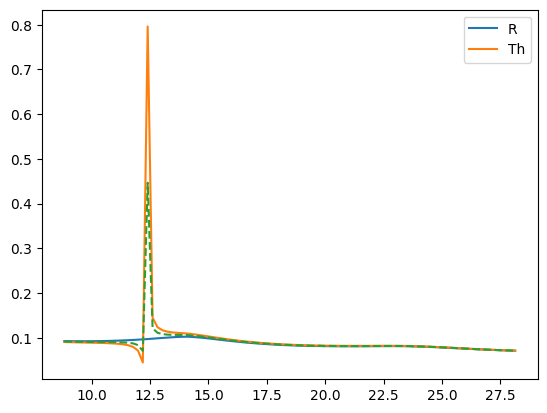

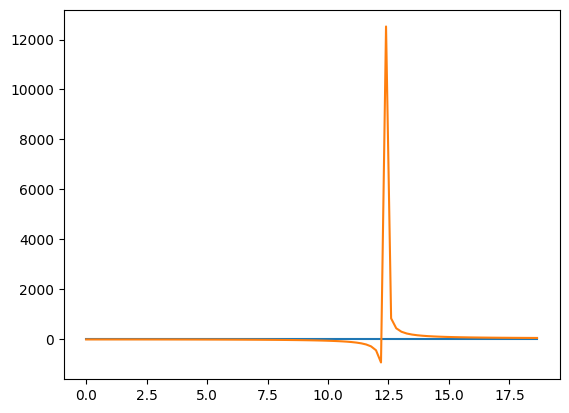

In [87]:
names = ["T", "R", "Th", "Ph"]
for i in [1, 2]:
    plt.plot(test1_a["time"][50:150], np.diff(test1_a["raw"][50:151, i])/test1_a["raw"][50:150, i+4], label=names[i])
    #print(np.diff(test1_a["raw"][:5, i])/test1_a["raw"][:4, i+4])
plt.legend()
plt.plot(test1_a["time"][50:150], np.median(np.diff(test1_a["raw"][50:151, 1:3], axis=0)/test1_a["raw"][50:150, 5:7], axis=1), label=names[i], linestyle="--")
plt.show()
plt.plot( test1_a["time"][:99], np.diff(test1_a["raw"][:100, 2]))
plt.plot( test1_a["time"][:99], 1/test1_a["raw"][:99, 6])

In [ ]:

print(pob[1])
print(1 - 0.8**2 + (pob[6]/pob[7])**2)
print(1 + np.sqrt((1 - 0.8**2 + (pob[6]/pob[7])**2)))

10.0
1.2203449739297922
2.1046922530414487


In [24]:
mm.find_rmb(0.9)

np.float64(1.732455532033676)

Try?? A thing?? Try making a toy model, if I restrict to equatorial, non-spinning thing, then I can try to train it to figure out semilatus rectum and eccentricity? Or E and L, that would be fine too

In [ ]:
def rando_gen():
    E = np.random.uniform(0.942809041582, 0.997509589283)
    r1, r2 = 8/(4 - 3*(E**2) + E*np.sqrt(9*(E**2) - 8)), 8/(4 - 3*(E**2) - E*np.sqrt(9*(E**2) - 8))
    L = np.random.uniform(r1/np.sqrt(r1 - 3), r2/np.sqrt(r2 - 3))
    pos = [0, ]

In [3]:
import MetricMathStreamline as mm
import numpy as np
mm.schmidtparam3(20/(1 - 0.1**2), 0.1, np.pi/2, 0.0)

[np.float64(0.9764140227032774), np.float64(4.852139810599848), 0.0]

In [12]:
from scipy.fft import fft, fftfreq
print(fftfreq(100, 1))
print(fftfreq(50, 2))
np.arange(0, 50, 2)


[ 0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09  0.1   0.11
  0.12  0.13  0.14  0.15  0.16  0.17  0.18  0.19  0.2   0.21  0.22  0.23
  0.24  0.25  0.26  0.27  0.28  0.29  0.3   0.31  0.32  0.33  0.34  0.35
  0.36  0.37  0.38  0.39  0.4   0.41  0.42  0.43  0.44  0.45  0.46  0.47
  0.48  0.49 -0.5  -0.49 -0.48 -0.47 -0.46 -0.45 -0.44 -0.43 -0.42 -0.41
 -0.4  -0.39 -0.38 -0.37 -0.36 -0.35 -0.34 -0.33 -0.32 -0.31 -0.3  -0.29
 -0.28 -0.27 -0.26 -0.25 -0.24 -0.23 -0.22 -0.21 -0.2  -0.19 -0.18 -0.17
 -0.16 -0.15 -0.14 -0.13 -0.12 -0.11 -0.1  -0.09 -0.08 -0.07 -0.06 -0.05
 -0.04 -0.03 -0.02 -0.01]
[ 0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09  0.1   0.11
  0.12  0.13  0.14  0.15  0.16  0.17  0.18  0.19  0.2   0.21  0.22  0.23
  0.24 -0.25 -0.24 -0.23 -0.22 -0.21 -0.2  -0.19 -0.18 -0.17 -0.16 -0.15
 -0.14 -0.13 -0.12 -0.11 -0.1  -0.09 -0.08 -0.07 -0.06 -0.05 -0.04 -0.03
 -0.02 -0.01]


array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32,
       34, 36, 38, 40, 42, 44, 46, 48])

Brand new nonsense Idea that doesn't use fourier stuff and is generally just weird:


want to generate paths using minimal starting data:

If I ONLY have E,L,C,a; I can use the potentials to determine the full set of allowed values for
r, theta, which then provides allowed metric elements, and then (combined with E,L,C) values for 
ut, utheta, and uphi, and THEN (combined with mass shell) ur
ut = (g_03.L - g_33.E)/(g_03^2 - g_00.g_33)
uphi = (g_03.E - g_00.L)/(g_03^2 - g_00.g_33)
utheta = +/- sqrt((1/sig^2).(C - (L.cos(thet)/sin(thet))^2 - a^2(1 - E^2)cos^2(thet)))
ur = +/- sqrt((1/g_11).(-1 - g_00.ut^2 - g_22.utheta^2 - g_33.uphi^2))

Huge amount of data!! Unique metric for every (r,theta), plus 4 possible trajectories from +/- in 
utheta and ur (encode retrograde motion as +/- L). How do you narrow that down to potential paths?? Choose an initial point, then try to encode "distance". Ways to talk about "distance":
- Actual distance between two points: dr, dtheta
- Difference in velocity: more disimilar velocity vectors are further apart
- dTau estimation: Use distance and velocity to estimate dTau between points, which can then be used to approximate t and phi

But?? isn;t this completely unreasonable?? yeah kinda

In [2]:
def rand_gen(E, L, C, a):
    turns, flats, zs = mm.root_getter(E, L, C, a)
    r_n, r_x = np.real(turns[-2]), np.real(turns[-1])
    e, p = (r_x - r_n)/(r_x + r_n), 2*r_x*r_n/(r_x + r_n)
    inc = np.pi/2 - np.real(np.arccos(np.abs(np.real(zs[1] - zs[2]))/2))
    #print(inc, "oof")
    #print(np.arccos(zs))
    #start = mm.set_u_kerr(a, cons=[E,L,C], pos=[0, np.random.uniform(r_n, r_x), np.pi + np.random.uniform(-inc, inc), 0])
    #start[0][5:7] *= np.array([np.random.choice([-1, 1]),np.random.choice([-1, 1])])
    #start[0][0] = np.random.uniform(0, 1000)
    #start[0][3] = np.random.uniform(0, 2*np.pi)
    return r_n, r_x, inc

#make a bunch of random data? Save it in a textfile or something
rand_gen(0.96, 3.8, 0.0, 0.0)


(np.float64(7.497853610289849),
 np.float64(14.661392819248235),
 np.float64(0.0))

# MODIFIED
Y
#make the training data for the geodesic I guess
#This will all be zero spin, just as proof of concept
import numpy as np
import pickle

def raw_normalizer3(data):
    import scipy.interpolate as spi
    new_time = np.linspace(data[0,0], data[-1,0], 2000)
    new_data = np.array([spi.CubicSpline(data[:,0], data[:,i])(new_time) for i in range(8)]).flatten()
    return new_data

filemade = False     #THIS MEANS THE FILE EXISTS. WHICH IT DOES. DON'T CHANGE THIS. unless you find a way for the code to check on its own, then go nuts
#E_s, L_s = [], []
for run in range(200):
    #try:
    E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
    r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
    L0 = 100
    while L0 < np.sqrt(r1/(1 - 3/r1)) or L0 > np.sqrt(r2/(1 - 3/r2)):
        E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
        r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
        L0 = np.random.uniform(3.46410161514, 14.2494099976)
    #L0 = np.random.uniform(np.sqrt(r1/(1 - 3/r1)), np.sqrt(r2/(1 - 3/r2)))  #Boundary L values
    inc = np.random.uniform(0.0, np.pi/2)   #Inclination, basically
    L, C = L0*np.cos(inc), (L0*np.sin(inc))**2
    r_n, r_x, inc = rand_gen(E, L, C, 0.0)
    #E_s.append(E)
    #L_s.append(L0)
    sim = ml.EMRIGenerator(0.0, 1e-100, endflag="rad_orbit > 1", pos=[0.0, np.random.uniform(r_n, r_x), np.pi/2 + np.random.uniform(-inc, inc), 0.0], cons=[E,L,C], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)
    if sim["stop"] == True:
        break

    #plt.plot(sim["time"], sim["raw"][:,1])
    

    try:
        if filemade == False:
            filemade = True
            with open('training_data_spin0_norm.pkl', 'wb') as file:
                pickle.dump(raw_normalizer3(sim["raw"]), file)
        else:
            with open('training_data_spin0_norm.pkl', 'ab') as file:
                pickle.dump(raw_normalizer3(sim["raw"]), file)
    
    except:
        print("I don't know???")
        break

#plt.scatter(E_s, L_s, s=1)

In [ ]:
#make the training data for the geodesic I guess
#This will all be zero spin, just as proof of concept
import numpy as np
import pickle

def raw_normalizer3(data):
    import scipy.interpolate as spi
    new_time = np.linspace(data[0,0], data[-1,0], 2000)
    new_data = np.array([spi.CubicSpline(data[:,0], data[:,i])(new_time) for i in range(8)]).flatten()
    return new_data

filemade = False     #THIS MEANS THE FILE EXISTS. WHICH IT DOES. DON'T CHANGE THIS. unless you find a way for the code to check on its own, then go nuts
#E_s, L_s = [], []
for run in range(200):
    #try:
    E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
    r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
    L0 = 100
    while L0 < np.sqrt(r1/(1 - 3/r1)) or L0 > np.sqrt(r2/(1 - 3/r2)):
        E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
        r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
        L0 = np.random.uniform(3.46410161514, 14.2494099976)
    #L0 = np.random.uniform(np.sqrt(r1/(1 - 3/r1)), np.sqrt(r2/(1 - 3/r2)))  #Boundary L values
    inc = np.random.uniform(0.0, np.pi/2)   #Inclination, basically
    L, C = L0*np.cos(inc), (L0*np.sin(inc))**2
    r_n, r_x, inc = rand_gen(E, L, C, 0.0)
    #E_s.append(E)
    #L_s.append(L0)
    sim = ml.EMRIGenerator(0.0, 1e-100, endflag="rad_orbit > 1", pos=[0.0, np.random.uniform(r_n, r_x), np.pi/2 + np.random.uniform(-inc, inc), 0.0], cons=[E,L,C], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)
    if sim["stop"] == True:
        break

    #plt.plot(sim["time"], sim["raw"][:,1])
    

    try:
        if filemade == False:
            filemade = True
            with open('training_data_spin0.pkl', 'wb') as file:
                pickle.dump(sim["raw"], file)
        else:
            with open('training_data_spin0.pkl', 'ab') as file:
                pickle.dump(sim["raw"], file)
    
    except:
        print("I don't know???")
        break

#plt.scatter(E_s, L_s, s=1)

  0%|          | 0/10000000 [00:00<?, ?it/s]

10023963.944081714it [00:01, 5957987.56it/s, Semilat: 50.049, Ecc 0.806]                               
10008286.969168365it [00:01, 8353215.49it/s, Semilat: 17.418, Ecc 0.63]                              
10005247.013821678it [00:01, 5771968.06it/s, Semilat: 34.158, Ecc 0.706]                              
10004398.59271696it [00:01, 7054047.63it/s, Semilat: 13.58, Ecc 0.423]                               
10006344.074500117it [00:01, 6318391.32it/s, Semilat: 67.963, Ecc 0.621]                               
10004461.09831614it [00:02, 4641283.49it/s, Semilat: 25.011, Ecc 0.913]                               
10006822.866919702it [00:01, 5108349.10it/s, Semilat: 8.697, Ecc 0.778]                              
10023048.763775418it [00:00, 20283054.52it/s, Semilat: 82.524, Ecc 0.041]                              
10011151.720783496it [00:01, 8518178.09it/s, Semilat: 74.543, Ecc 0.099]                              
10008833.685503393it [00:01, 8024452.38it/s, Semilat: 32.827, Ecc 0.42]  

In [25]:
2*200000/60/60

111.11111111111111

In [3]:
#  Test read

# Load and verify the appended data
import pickle
loaded_data = []
with open('training_data_spin0.pkl', 'rb') as file:
    while True:
        try:
            hold = pickle.load(file)
            if np.random.uniform(0, 1) < 2:
                loaded_data.append(hold)
        except EOFError:
            break

#import os.path

print(len(loaded_data))
#print(np.shape(loaded_data))
print(np.shape(loaded_data[0]))
'''
write, rewrite = 0,0
for val in loaded_data:
    if os.path.exists('training_data_spin0_norm.pkl'):
        with open('training_data_spin0.pkl', 'ab') as file:
            pickle.dump(raw_normalizer(val), file)
            write += 1
    else:
        with open('training_data_spin0_norm.pkl', 'wb') as file:
            pickle.dump(raw_normalizer(val), file)
            rewrite +=1
print(write, rewrite)
#loaded_data = np.concatenate(loaded_data)

print("Appended Data:")
print(len(loaded_data))
'''

'''

print(len(loaded_data[-1]))
bawk = raw_normalizer(loaded_data[-1])
for i in range(7):
    plt.plot(loaded_data[-1][:,0], loaded_data[-1][:,i], label="org")
    plt.plot(bawk[:,0], bawk[:,i], label="bawk")
    plt.legend()
    plt.show()

'''

'''
EL_s = {}
pe_s = {}
e_sorter = np.arange(10)/10
p_sorter = np.arange(10)*20
r_sorter = np.arange(10)*20
E_sorter = np.linspace(0.942809041582, 0.997509589283, 11)[:-1]
L_sorter = np.linspace(3.46410161514, 14.2494099976, 11)[:-1]
for val in loaded_data:
    boop = ml.getCons(val[0], 0.0)
    turns, flats, zs = mm.root_getter(*boop, 0.0)
    E_v, L_v, C_v, p_v, e_v = *boop, 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2])
    EL_ind, pe_ind = e_sorter[np.where(e_v > e_sorter)[0][-1]], E_sorter[np.where(E_v > E_sorter)[0][-1]] 
    if EL_ind not in EL_s.keys():
        EL_s[EL_ind] = [[E_v], [np.sqrt(L_v**2 + C_v)]]
    else:
        EL_s[EL_ind][0].append(E_v)
        EL_s[EL_ind][1].append(np.sqrt(L_v**2 + C_v))
    if pe_ind not in pe_s.keys():
        pe_s[pe_ind] = [[p_v], [e_v]]
    else:
        pe_s[pe_ind][0].append(p_v)
        pe_s[pe_ind][1].append(e_v)
    #print(np.round([np.mean(boop[:,i//2]) if i%2==0 else np.std(boop[:,i//2]) for i in range(6)], 4))
    #print("E: {:.3e}, {:.3e}; L: {:.3e}, {:.3e}; C: {:.3e}, {:.3e}".format(*[np.mean(boop[:,i//2]) if i%2==0 else np.std(boop[:,i//2])/np.mean(boop[:,i//2]) for i in range(6)]))

fig1, ax1 = plt.subplots()
fig2, ax2 = plt.subplots()
for ix in EL_s.keys():
    ax1.scatter(EL_s[ix][0], EL_s[ix][1], s=2, label=ix)
for ix in pe_s.keys():
    ax2.scatter(pe_s[ix][0], pe_s[ix][1], s=2, label=ix)
ax1.legend()
ax2.legend()
plt.show()
'''

#lengths = [len(data) for data in loaded_data]
#plt.hist(lengths, bins=50)
##plt.xscale("log")

167913
(476, 8)


'\nEL_s = {}\npe_s = {}\ne_sorter = np.arange(10)/10\np_sorter = np.arange(10)*20\nr_sorter = np.arange(10)*20\nE_sorter = np.linspace(0.942809041582, 0.997509589283, 11)[:-1]\nL_sorter = np.linspace(3.46410161514, 14.2494099976, 11)[:-1]\nfor val in loaded_data:\n    boop = ml.getCons(val[0], 0.0)\n    turns, flats, zs = mm.root_getter(*boop, 0.0)\n    E_v, L_v, C_v, p_v, e_v = *boop, 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2])\n    EL_ind, pe_ind = e_sorter[np.where(e_v > e_sorter)[0][-1]], E_sorter[np.where(E_v > E_sorter)[0][-1]] \n    if EL_ind not in EL_s.keys():\n        EL_s[EL_ind] = [[E_v], [np.sqrt(L_v**2 + C_v)]]\n    else:\n        EL_s[EL_ind][0].append(E_v)\n        EL_s[EL_ind][1].append(np.sqrt(L_v**2 + C_v))\n    if pe_ind not in pe_s.keys():\n        pe_s[pe_ind] = [[p_v], [e_v]]\n    else:\n        pe_s[pe_ind][0].append(p_v)\n        pe_s[pe_ind][1].append(e_v)\n    #print(np.round([np.mean(boop[:,i//2]) if i%2==0 

In [4]:
def raw_normalizer(data):
    import scipy.interpolate as spi
    new_time = np.linspace(data[0,0], data[-1,0], 2000)
    new_data = np.transpose([spi.CubicSpline(data[:,0], data[:,i])(new_time) for i in range(8)])
    return new_data

#Tracking by Tau seems worse actually! Datapoints cluster where speed is slower, sparse where it's fast. Opposite of desirable!
def raw_normalizer2(data):
    import scipy.interpolate as spi
    Tau_final = np.insert(np.cumsum(np.median(np.diff(puck[:,:4], axis=0)/puck[:-1,4:], axis=1)), 0, 0)
    new_Tau = np.linspace(0.0, Tau_final[-1], 2000)
    new_data = np.transpose([spi.CubicSpline(Tau_final, data[:,i])(new_Tau) for i in range(8)])
    return new_data
'''
puck = loaded_data[0]
puck = ml.EMRIGenerator(0.9, 1e-100, endflag="rad_orbit > 1", cons=[0.957039365132, 2.49433296, 0], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)["raw"]


bawk = raw_normalizer(puck)
bawk2 = raw_normalizer2(puck)
for i in range(7):
    plt.plot(puck[:,0], puck[:,i], label="org")
    #plt.plot(bawk[:,0], bawk[:,i], label="bawk")
    
    #plt.plot(bawk2[:,0], bawk2[:,i], label="bawk2")
    plt.scatter(bawk[:,0], bawk[:,i], s=10)
    plt.scatter(bawk2[:,0], bawk2[:,i], s=10)
    plt.legend()
    plt.show()

for i in range(4):
    plt.plot(np.cumsum(np.diff(puck[:,i])/puck[:-1,i+4]))
    print(np.sum(np.diff(puck[:,i])/puck[:-1,i+4]))
plt.plot(np.cumsum(np.median(np.diff(puck[:,:4], axis=0)/puck[:-1,4:], axis=1)))
print(np.sum(np.median(np.diff(puck[:,:4], axis=0)/puck[:-1,4:], axis=1)))
'''

'\npuck = loaded_data[0]\npuck = ml.EMRIGenerator(0.9, 1e-100, endflag="rad_orbit > 1", cons=[0.957039365132, 2.49433296, 0], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)["raw"]\n\n\nbawk = raw_normalizer(puck)\nbawk2 = raw_normalizer2(puck)\nfor i in range(7):\n    plt.plot(puck[:,0], puck[:,i], label="org")\n    #plt.plot(bawk[:,0], bawk[:,i], label="bawk")\n    \n    #plt.plot(bawk2[:,0], bawk2[:,i], label="bawk2")\n    plt.scatter(bawk[:,0], bawk[:,i], s=10)\n    plt.scatter(bawk2[:,0], bawk2[:,i], s=10)\n    plt.legend()\n    plt.show()\n\nfor i in range(4):\n    plt.plot(np.cumsum(np.diff(puck[:,i])/puck[:-1,i+4]))\n    print(np.sum(np.diff(puck[:,i])/puck[:-1,i+4]))\nplt.plot(np.cumsum(np.median(np.diff(puck[:,:4], axis=0)/puck[:-1,4:], axis=1)))\nprint(np.sum(np.median(np.diff(puck[:,:4], axis=0)/puck[:-1,4:], axis=1)))\n'

In [18]:
#ML stuff?? From ChatGPT, I have no idea how this works

#X is shape of input, could just be initial state + spin, could include ELC? Technically redundant but that's not necessarily a bad thing
#   I think I'll include it, so an Nx12 value array [E, L, C, a, position, velocity] where N is the number of samples 
#Y is the shape of the output, so an Nx2000x8 array (because we want 2000 equally spaced timesteps across the full orbit)

#del Y
#del X
#Y = np.array([[np.transpose(raw_normalizer(data)).flatten()] for data in loaded_data])
print("oh god I have no patience")
#Y = np.array(Y)
#X = np.array([[[*ml.getCons(sim[0], 0.0), 0.0, *sim[0]]] for sim in loaded_data]) 
print("save me")
print(np.shape(Y))
print(np.shape(X))
#loaded_data = np.concatenate(loaded_data)


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Define the model
model = Sequential()

# Add LSTM layer
model.add(LSTM(64, return_sequences=True, input_shape=(1, 12)))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.2))

# Add Dense layer for output (predicting position + velocity)
model.add(Dense(16000))  # 6 outputs: t, r, theta, phi, ut, ur, utheta, uphi

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Summarize the model architecture
model.summary()

# Train the model
model.fit(X, Y, epochs=50, batch_size=64, validation_split=0.2)

oh god I have no patience
save me
(167913, 1, 16000)
(167913, 1, 12)


C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 1, 64)          │        19,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 1, 64)          │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1, 16000)       │     1,040,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,092,736 (4.17 MB)

 Trainable params: 1,092,736 (4.17 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 128s 56ms/step - loss: 1609285.3750 - val_loss: 1561822.7500
Epoch 2/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 104s 49ms/step - loss: 1553649.0000 - val_loss: 1509954.2500
Epoch 3/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 119s 57ms/step - loss: 1504060.3750 - val_loss: 1460767.0000
Epoch 4/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 115s 55ms/step - loss: 1455945.6250 - val_loss: 1414089.1250
Epoch 5/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 124s 59ms/step - loss: 1406914.3750 - val_loss: 1369723.8750
Epoch 6/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 125s 60ms/step - loss: 1357643.6250 - val_loss: 1327587.7500
Epoch 7/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 125s 60ms/step - loss: 1320811.7500 - val_loss: 1285587.5000
Epoch 8/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 125s 60ms/step - loss: 1286394.6250 - val_loss: 1244685.7500
Epoch 9/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 125s 60ms/step - loss: 1237300.0000 - val_loss: 1205036.5000
Epoch 10/50
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 121s 58ms/step - loss: 1188287

10005461.093640111it [00:01, 7797783.13it/s, Semilat: 27.897, Ecc 0.877]                              
10009999.870205486it [00:01, 8117077.46it/s, Semilat: 34.928, Ecc 0.731]                               
10004282.284552366it [00:00, 11039969.00it/s, Semilat: 94.775, Ecc 0.52]                              
10005356.696724273it [00:01, 6376709.47it/s, Semilat: 26.276, Ecc 0.722]                              
10005467.035695624it [00:00, 12349801.14it/s, Semilat: 72.514, Ecc 0.454]                              
10003591.87284059it [00:02, 4584264.12it/s, Semilat: 19.936, Ecc 0.907]                               
10004222.820138032it [00:01, 8252469.07it/s, Semilat: 60.531, Ecc 0.399]                              
10012509.48155519it [00:01, 8195600.05it/s, Semilat: 70.672, Ecc 0.652]                               
10013623.36207389it [00:01, 7773663.81it/s, Semilat: 25.557, Ecc 0.692]                               
10005072.054912731it [00:01, 8267258.29it/s, Semilat: 38.301, Ecc 0.527

(10, 1, 12)
(10, 1, 16000)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 116191.2656
Test Loss: 116191.265625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


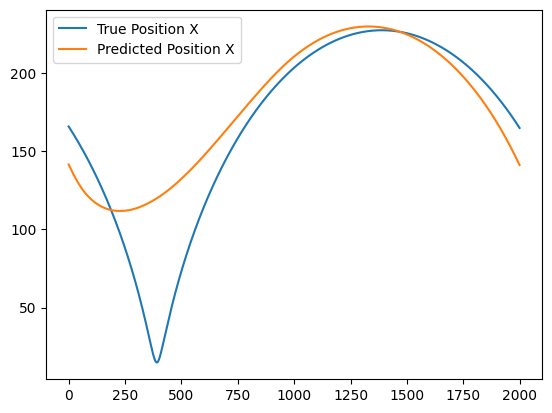

[[ 1.6512498e-32  5.5082431e+00  1.0998167e+01 ... -5.2831508e-03
  -5.4693948e-03 -5.3867903e-03]]
[ 1.6512498e-32  5.5082431e+00  1.0998167e+01 ... -5.2831508e-03
 -5.4693948e-03 -5.3867903e-03]
(10, 1, 16000)


In [19]:
raws, X_test, y_test = [], [], []
for i in range(10):
    E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
    r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
    L0 = 100
    while L0 < np.sqrt(r1/(1 - 3/r1)) or L0 > np.sqrt(r2/(1 - 3/r2)):
        E = np.random.uniform(0.942809041582, 0.997509589283)  #Energies for psuedocircular r~4.02 up to circular r=200
        r1, r2 = 8/(4 - 3*E*E + E*np.sqrt(9*E*E - 8)), 8/(4 - 3*E*E - E*np.sqrt(9*E*E - 8))  #corresponding maximum and minimum "circular" values
        L0 = np.random.uniform(3.46410161514, 14.2494099976)
    #L0 = np.random.uniform(np.sqrt(r1/(1 - 3/r1)), np.sqrt(r2/(1 - 3/r2)))  #Boundary L values
    inc = np.random.uniform(0.0, np.pi/2)   #Inclination, basically
    L, C = L0*np.cos(inc), (L0*np.sin(inc))**2
    r_n, r_x, inc = rand_gen(E, L, C, 0.0)
    #E_s.append(E)
    #L_s.append(L0)
    raws.append(ml.EMRIGenerator(0.0, 1e-100, endflag="rad_orbit > 1", pos=[0.0, np.random.uniform(r_n, r_x), np.pi/2 + np.random.uniform(-inc, inc), 0.0], cons=[E,L,C], bonk=3, label="wink pure geo inc=%s"%(np.pi/2), trigger=2, err_target=1e-13)["raw"])
    X_test.append([[E, L, C, 0.0, *raws[-1][0]]])
    y_test.append([np.transpose(raw_normalizer(raws[-1])).flatten()])

X_test = np.array(X_test)
y_test = np.array(y_test)
print(np.shape(X_test))
print(np.shape(y_test))

# Evaluate the model on test data (replace X_test and y_test with your actual test data)
test_loss = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}")

# Make predictions on new data
predictions = model.predict(X_test)

# Plot true vs predicted positions (example for the x-coordinate)
plt.plot(np.transpose(np.reshape(y_test[0], (8, 2000)))[:, 1], label='True Position X')
plt.plot(np.transpose(np.reshape(predictions[0], (8, 2000)))[:, 1], label='Predicted Position X')
plt.legend()
plt.show()
print(predictions[0])
print(predictions[0,0])
print(np.shape(predictions))

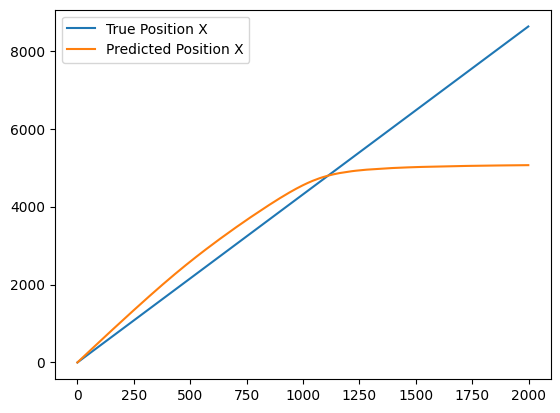

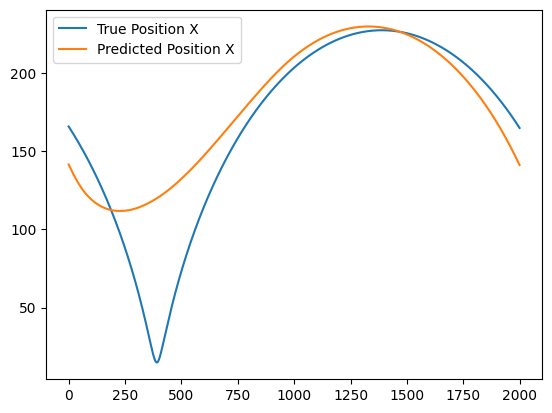

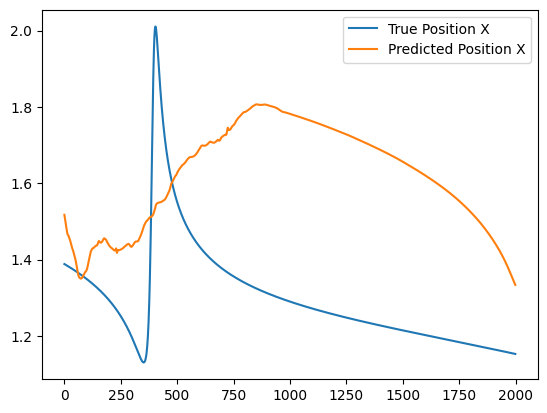

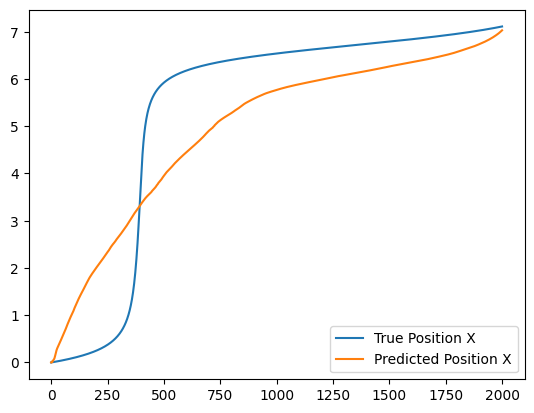

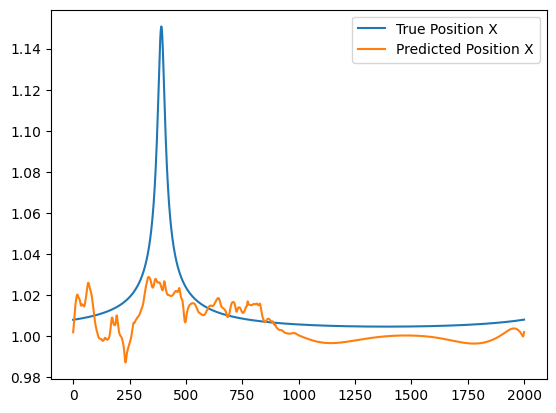

...

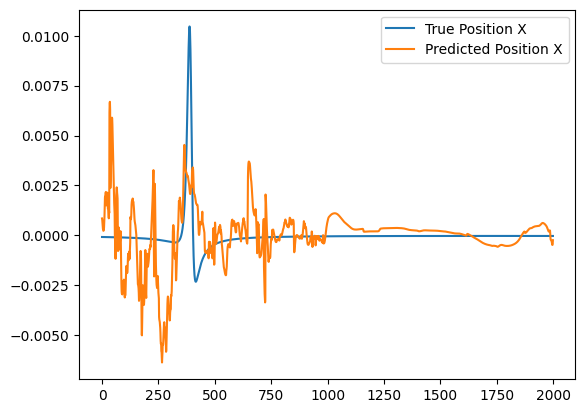

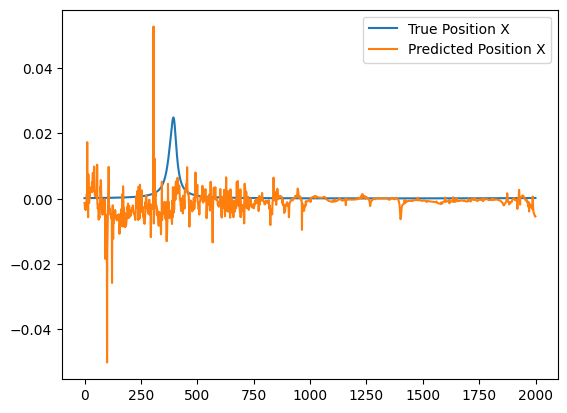

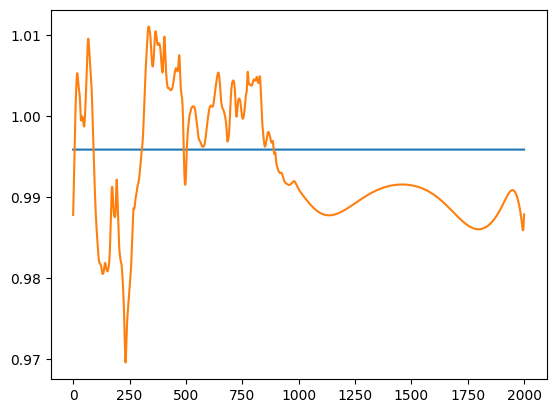

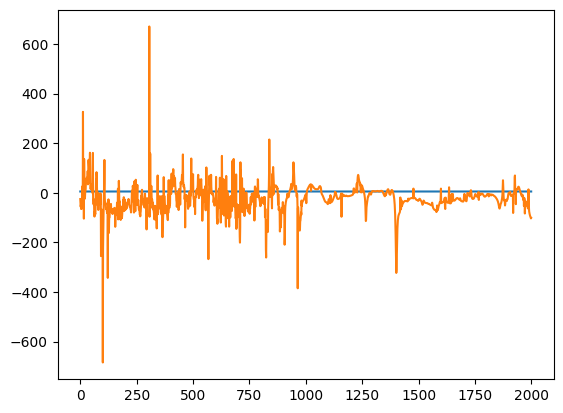

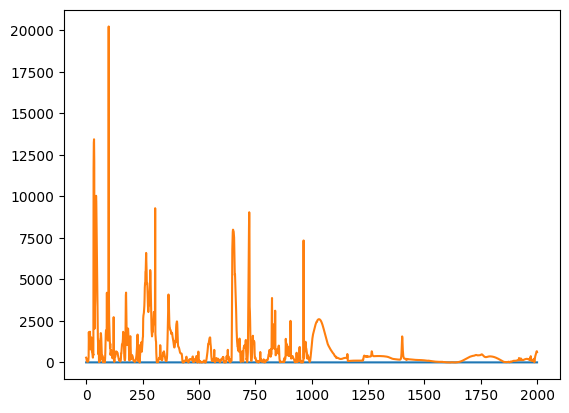

In [23]:
for i in range(8):
    plt.plot(np.transpose(np.reshape(y_test[0], (8, 2000)))[:, i], label='True Position X')
    plt.plot(np.transpose(np.reshape(predictions[0], (8, 2000)))[:, i], label='Predicted Position X')
    plt.legend()
    plt.show()

test_vals = np.array([ml.getCons(state, 0.0) for state in np.transpose(np.reshape(predictions[0], (8, 2000)))])
true_vals = np.array([ml.getCons(state, 0.0) for state in np.transpose(np.reshape(y_test[0], (8, 2000)))])
plt.plot(true_vals[:,0])
plt.plot(test_vals[:,0])
plt.show()
plt.plot(true_vals[:,1])
plt.plot(test_vals[:,1])
plt.show()
plt.plot(true_vals[:,2])
plt.plot(test_vals[:,2])
plt.show()

In [ ]:
np.shape(Y[0])
print(Y[0,0])
print(Y[0,1])
print(Y[0,2])
print(np.transpose(Y[0,:3,:]).flatten())
hold = np.transpose(Y[0,:3,:]).flatten()
print(np.transpose(np.reshape(hold, (8, 3))))

[ 0.00000000e+00  1.16938040e+01  1.57427411e+00  0.00000000e+00
  1.16080255e+00 -7.62581387e-02 -4.74040852e-04  2.83571517e-02]
[ 1.87703061e-01  1.16814702e+01  1.57419735e+00  4.58972287e-03
  1.16105547e+00 -7.63095535e-02 -4.75490996e-04  2.84170499e-02]
[ 3.75406122e-01  1.16691308e+01  1.57412037e+00  9.18814453e-03
  1.16130916e+00 -7.63602815e-02 -4.76937456e-04  2.84771657e-02]
[ 0.00000000e+00  1.87703061e-01  3.75406122e-01  1.16938040e+01
  1.16814702e+01  1.16691308e+01  1.57427411e+00  1.57419735e+00
  1.57412037e+00  0.00000000e+00  4.58972287e-03  9.18814453e-03
  1.16080255e+00  1.16105547e+00  1.16130916e+00 -7.62581387e-02
 -7.63095535e-02 -7.63602815e-02 -4.74040852e-04 -4.75490996e-04
 -4.76937456e-04  2.83571517e-02  2.84170499e-02  2.84771657e-02]
[[ 0.00000000e+00  1.16938040e+01  1.57427411e+00  0.00000000e+00
   1.16080255e+00 -7.62581387e-02 -4.74040852e-04  2.83571517e-02]
 [ 1.87703061e-01  1.16814702e+01  1.57419735e+00  4.58972287e-03
   1.16105547e+00

In [62]:
np.linspace(0.942809041582, 0.997509589283,11)

array([0.94280904, 0.9482791 , 0.95374915, 0.95921921, 0.96468926,
       0.97015932, 0.97562937, 0.98109942, 0.98656948, 0.99203953,
       0.99750959])

In [69]:
e_sorter = np.arange(10)/10
np.where(0.34 > e_sorter)[0][-1]
print(e_sorter[3])

0.3


(array([ 0.00000000e+00,  9.44620992e+00,  1.57079633e+00,  0.00000000e+00,
        1.23271162e+00, -1.45170615e-08, -2.91427109e-18,  4.39741529e-02]), [0.9624052582538133, 4.238129374336959, 0.0])
Normalizing initial state


  0%|          | 94/10000000 [00:00<2:58:11, 935.33it/s, Semilat: 9.446, Ecc 0.0]

[np.float64(-7.65853219436185e-14), np.float64(1.4653062275076212e-30), np.float64(6.934051674163673e-31), np.float64(-2.146879689791673e-12)] org
[np.float64(0.9624052582537367), np.float64(4.238129374334812), np.float64(0.0)] buh 94


  0%|          | 188/10000000 [00:00<3:26:45, 806.05it/s, Semilat: 9.446, Ecc 0.0]

[np.float64(-7.746199078524804e-14), np.float64(-4.637155663874895e-31), np.float64(2.059791641996656e-30), np.float64(-2.171454920433037e-12)] org
[np.float64(0.9624052582536592), np.float64(4.23812937433264), np.float64(0.0)] buh 177


  0%|          | 270/10000000 [00:00<3:27:57, 801.43it/s, Semilat: 9.446, Ecc 0.0]

[np.float64(-7.746199060461564e-14), np.float64(-2.087705842646856e-30), np.float64(-3.1505188546661896e-31), np.float64(-2.1714549172038458e-12)] org
[np.float64(0.9624052582535817), np.float64(4.238129374330469), np.float64(0.0)] buh 260


  0%|          | 343/10000000 [00:00<3:35:34, 773.10it/s, Semilat: 9.446, Ecc 0.0]


[np.float64(-7.746199084655372e-14), np.float64(1.6477096601156541e-31), np.float64(-2.1049049246606664e-30), np.float64(-2.1714549218478413e-12)] org
[np.float64(0.9624052582535042), np.float64(4.238129374328297), np.float64(0.0)] buh 343
[9.44620992 8.63964957 2.24592298]
[9.44620992 8.63964957 2.24592298]
[ -0.29510448   6.         -36.07103047  54.09092073]
[9.44620992 8.63964957 2.24592298]
sta
9.446209917130446 [9.44620992 8.63964957 2.24592298]
ROOTER
(array([7.10542736e-15+0.00000000e+00j, 8.21662345e+00+0.00000000e+00j,
       9.44620992e+00-1.01477258e-06j, 9.44620992e+00+1.01477258e-06j]), array([2.24592298+0.j, 8.63964957+0.j, 9.44620992+0.j]), array([-211.49755808+0.j,    0.        +0.j,    0.        +0.j,
        211.49755808+0.j]))
(-6.040742253373887e-13+0j) -1e-14 whoops

Ending program


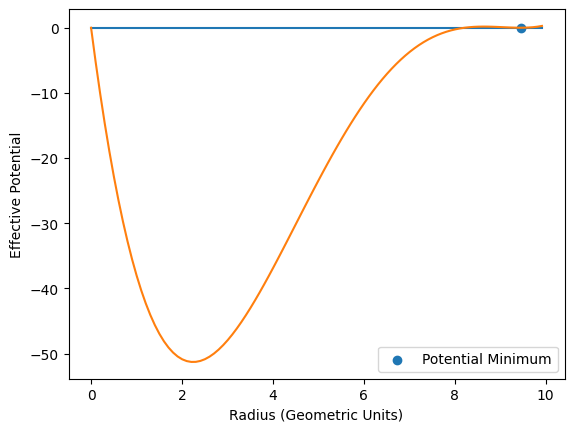

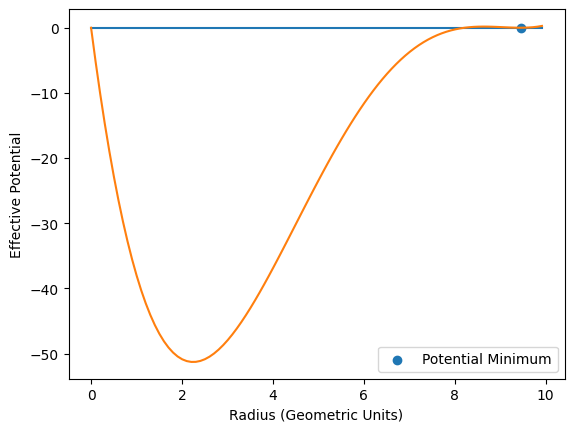

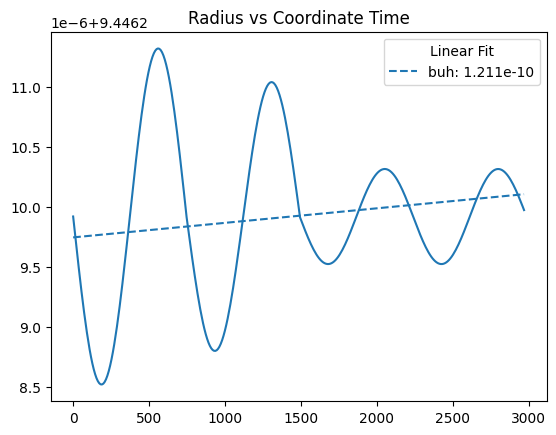

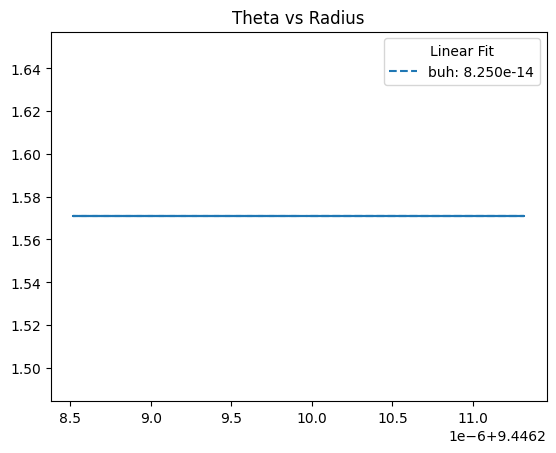

In [46]:
#import MetricMathStreamline as mm
#import MainLoopStreamline as ml
#import OrbitPlotter as op
#import numpy as np
print(mm.set_u_kerr(-0.99999, cons=[0.9624052582538133, 4.238129374336959, 0.0]))
sim1 = ml.EMRIGenerator(-0.99999, 1e-12, endflag="radius < 3", cons=[0.9624052582538133, 4.238129374336959, 0.0], bonk=3, label="buh", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim2 = ml.EMRIGenerator(0, 0*1e-4, endflag="rad_orbit > 50", params=[8/(1 - 0.5**2), 0.5, np.pi/3], bonk=3, label="buh", trigger=2, err_target=1e-14, conch=100, verbose=1)
op.plotvalue3([sim1], "time", "radius")
op.plotvalue3([sim1], "radius", "theta")


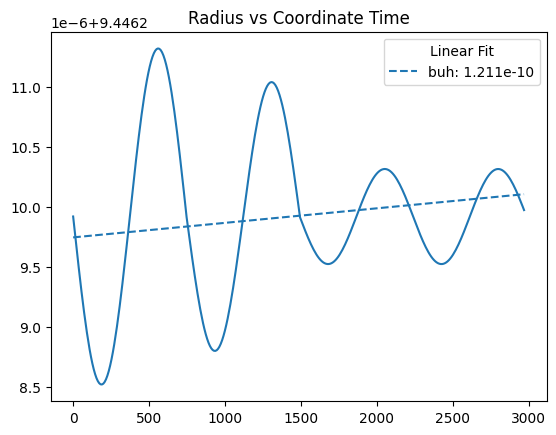

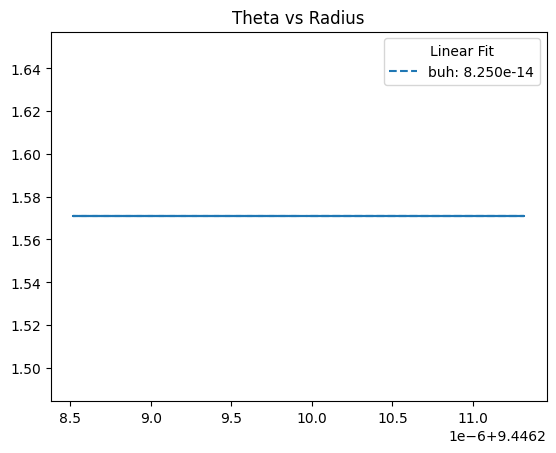

In [47]:
lst = [sim1]
op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "radius", "theta")


(array([ 0.00000000e+00,  3.00000000e+01,  1.57079633e+00,  0.00000000e+00,
        1.21488214e+00, -5.71809204e-01, -3.36760861e-19,  5.49972222e-03]), [1.13389, 4.94975, 0])


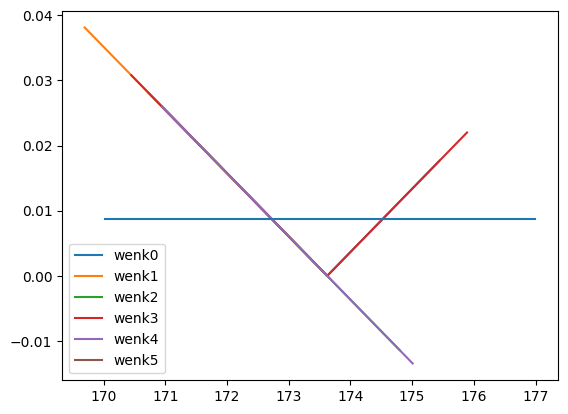

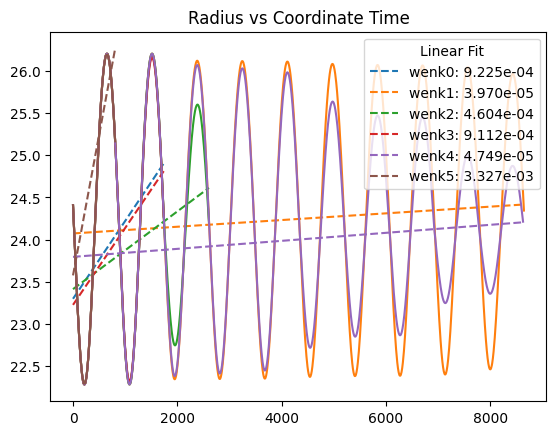

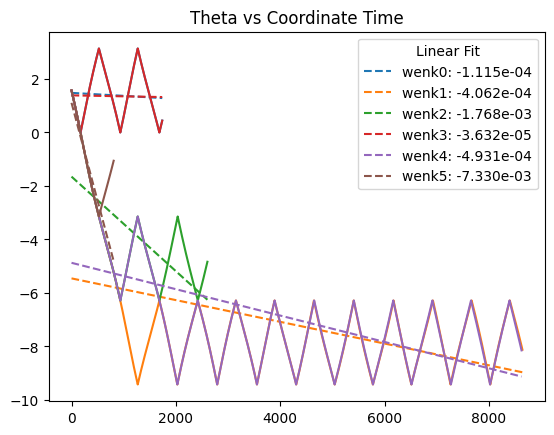

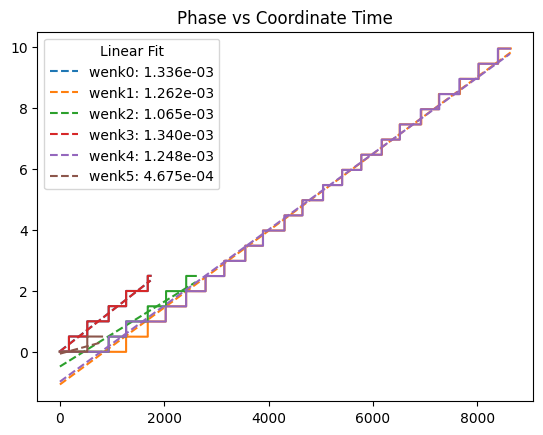

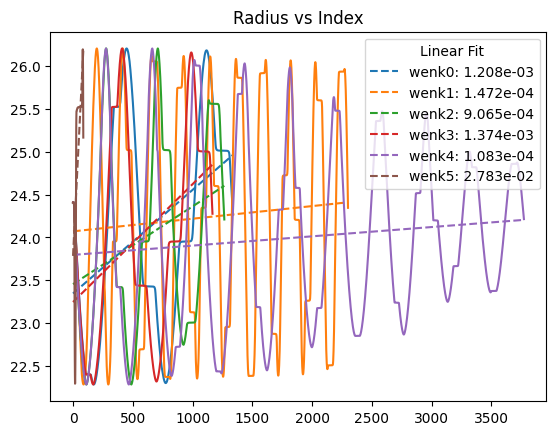

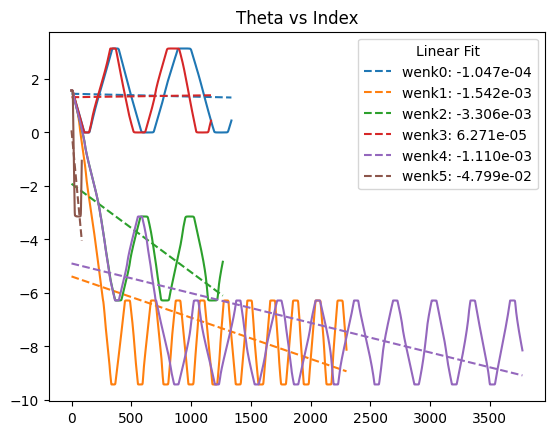

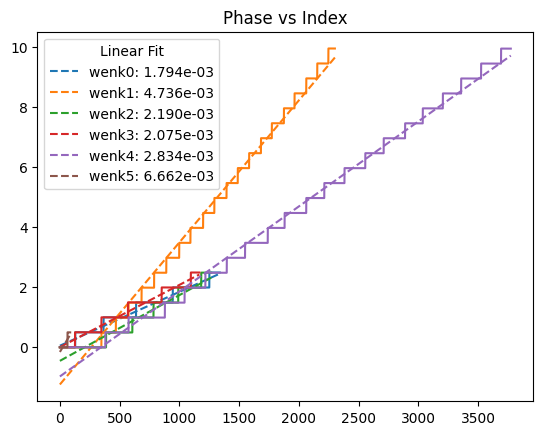

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


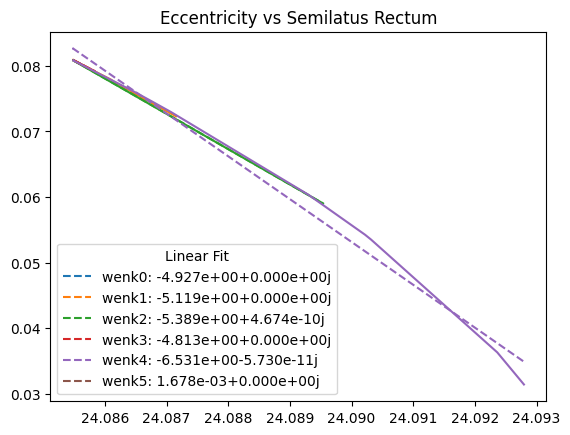

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\_polynomial_impl.py:657: RuntimeWarning: invalid value encountered in divide
  lhs /= scale


Could not plot linear fit.


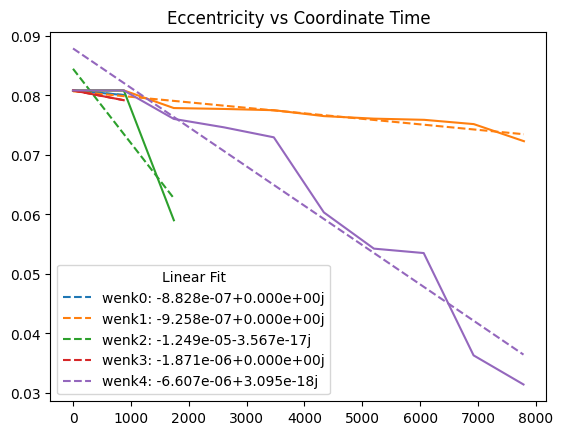

Could not plot linear fit.


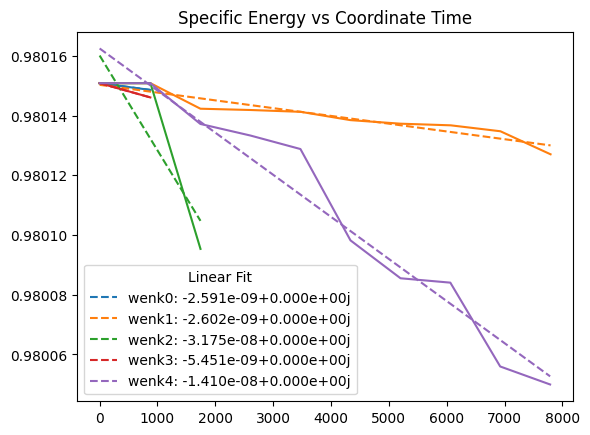

Could not plot linear fit.


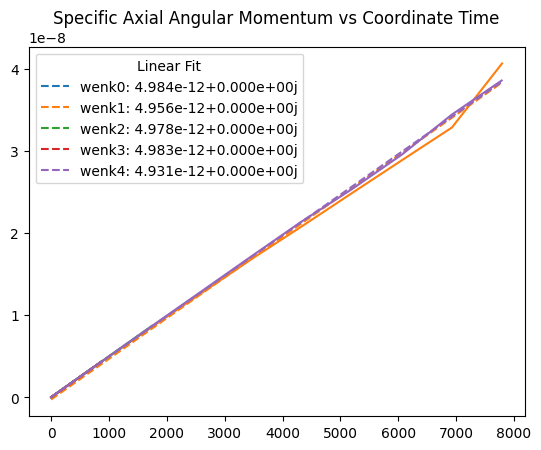

Could not plot linear fit.


c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


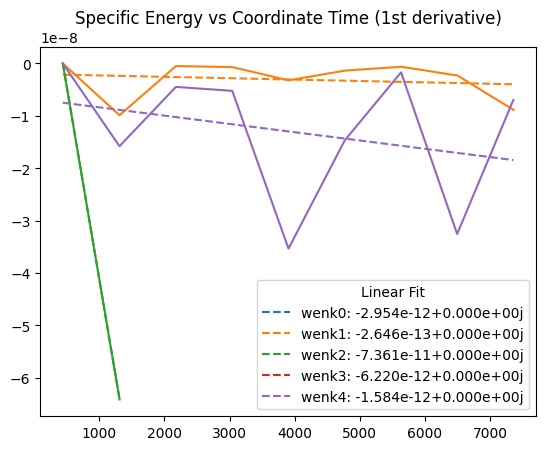

c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


Could not plot linear fit.


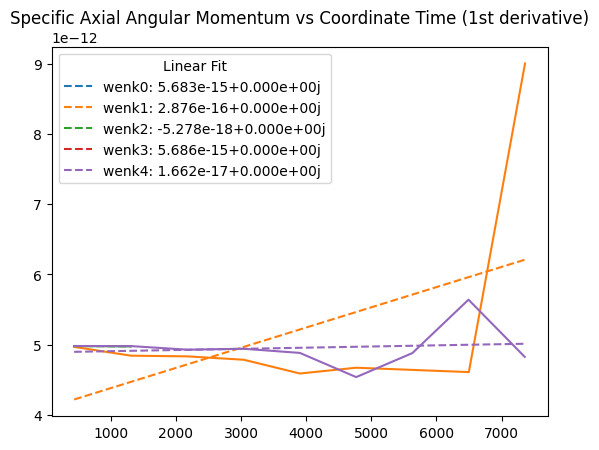

'\n[0.94491118] [3.5] [0.]\n[np.float64(0.9449111825113298), np.float64(3.4999999997904503), np.float64(0.0)] 6_3\n[np.float64(0.944911182511346), np.float64(3.499999999790444), np.float64(0.0)] 6_4\n[np.float64(0.9449111825113489), np.float64(3.499999999790493), np.float64(0.0)] 6_5\n[np.float64(0.9449111825117198), np.float64(3.4999999997896447), np.float64(0.0)] org\n[np.float64(0.9449111825002267), np.float64(3.49999999957679), np.float64(0.0)] label\n'

In [26]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
print(mm.set_u_kerr(0, cons=[1.13389, 4.94975, 0], pos=[0, 30, np.pi/2, 0]))
#low, high = 2.89436, 2.9
#for i in range(20):
#    L = (low + high)/2
#    print(low, L, high)
#    sim3 = ml.EMRIGenerator(0.8, 0*1e-4, endflag="time > 500", cons=[1, L, 0], pos=[0, 6, np.pi/2, 0], bonk=3, label="buh", trigger=2, err_target=1e-14, conch=100, verbose=1)
#    if sim3["plunge"] == True:
#        low = L
#    else:
#        high = L
#[0.9954725151592198, 0.0, 69.44444444444446, 0.99999, 0.0001]
consare = [0.980150839300378, 0.0, 27.519792475937553]
#sim3 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=0, label="wenk0", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim4 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=1, label="wenk1", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim5 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=2, label="wenk2", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim6 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=3, label="wenk3", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim7 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=4, label="wenk4", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim8 = ml.EMRIGenerator(-0.24999749999999998, 1e-5, endflag="rad_orbit > 10", cons=consare, bonk=5, label="wenk5", trigger=2, err_target=1e-14, conch=100, verbose=1)
#sim9 = ml.EMRIGenerator(-0.24999749999999998, 0*1e-5, endflag="rad_orbit > 10", cons=consare, bonk=6, label="wenk", trigger=2, err_target=1e-14, conch=100, verbose=1)
#print(L)
#print(sim3["energy"], sim3["phi_momentum"], sim3["carter"])
#print(sim4["energy"], sim4["phi_momentum"], sim4["carter"])
#print(sim5["energy"], sim5["phi_momentum"], sim5["carter"])
#print(sim6["energy"], sim6["phi_momentum"], sim6["carter"])
lst = [sim3, sim4, sim5, sim6, sim7, sim8]

ab, bb = 170, 177
fig, ax = plt.subplots()
for thing in lst:
    ax.plot(thing["time"][op.get_index(thing["time"], ab):op.get_index(thing["time"], bb)], thing["raw"][op.get_index(thing["time"], ab):op.get_index(thing["time"], bb), 2], label=thing["name"])
ax.legend()
ax.hlines(0.5*np.pi/180, ab, bb)
op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "time", "theta")
op.plotvalue3(lst, "time", "phase")
op.plotvalue3(lst, "index", "radius")
op.plotvalue3(lst, "index", "theta")
op.plotvalue3(lst, "index", "phase")
op.plotvalue3(lst, "semi_lat", "ecc")
op.plotvalue3(lst, "tracktime", "ecc")
op.plotvalue3(lst, "tracktime", "energy")
op.plotvalue3(lst, "tracktime", "L_z")
op.plotvalue3(lst, "tracktime", "energy", derv=1)
op.plotvalue3(lst, "tracktime", "L_z", derv=1)

'''
[0.94491118] [3.5] [0.]
[np.float64(0.9449111825113298), np.float64(3.4999999997904503), np.float64(0.0)] 6_3
[np.float64(0.944911182511346), np.float64(3.499999999790444), np.float64(0.0)] 6_4
[np.float64(0.9449111825113489), np.float64(3.499999999790493), np.float64(0.0)] 6_5
[np.float64(0.9449111825117198), np.float64(3.4999999997896447), np.float64(0.0)] org
[np.float64(0.9449111825002267), np.float64(3.49999999957679), np.float64(0.0)] label
'''

(np.float64(0.9449111827197246), np.float64(3.5000000001421285), np.float64(0.0))
(np.float64(0.9448995060796109), np.float64(3.4997856968510552), np.float64(0.0))
(np.float64(0.9448872978073131), np.float64(3.4995603521840906), np.float64(0.0))
(array([-1.77635684e-15+0.j,  4.66666673e+00+0.j,  6.99930000e+00+0.j,
        7.00070000e+00+0.j]), array([1.47927406+0.j, 5.52072585+0.j, 7.00000014+0.j]), array([-9.98033256e+01+0.j, -3.55271368e-14+0.j,  3.55271368e-14+0.j,
        9.98033256e+01+0.j]))
(array([-3.99680289e-15+0.j        ,  4.66968784e+00+0.j        ,
        6.99656759e+00+0.01618374j,  6.99656759e+00-0.01618374j]), array([1.47939459+0.j, 5.52123009+0.j, 6.99649259+0.j]), array([-99.76639572+0.j,   0.        +0.j,   0.        +0.j,
        99.76639572+0.j]))
ho
(6.999300002042487+0j) (6.996567592297628+0.016183743076554853j) (6.992950409554431+0.01824038322167382j)
(7.000700002505608+0j) (6.996567592297657-0.016183743076554583j) (6.99295040955444-0.018240383221673734j)
(np

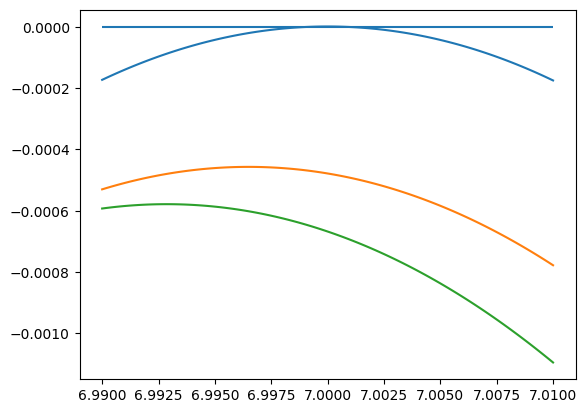

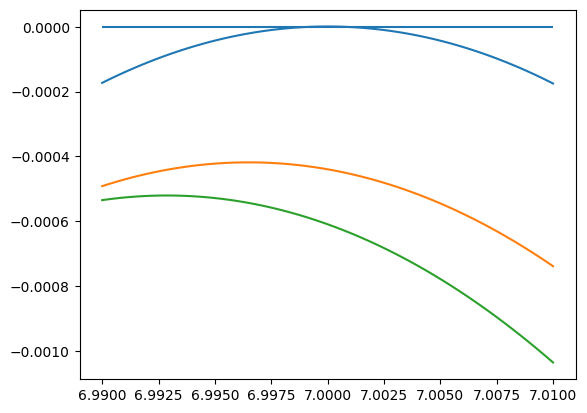

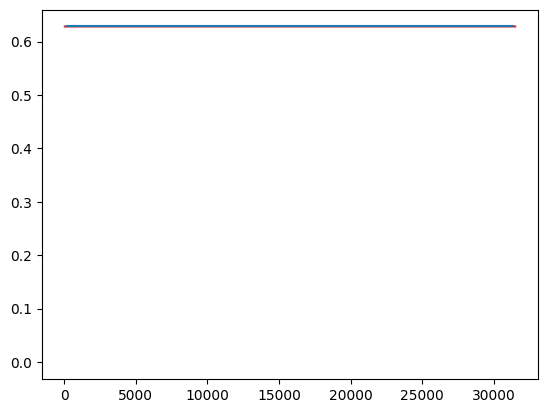

In [48]:
#op.plotvalue3([sim3], "time", "radius", end=400, start=93.5, yscale="log")
from scipy.signal import argrelmin
lst = [sim3, sim4, sim5]
a = 0
R = lambda r, E, L, C, a: ((r**2 + a**2)*E - a*L)**2 - (r**2 - 2*r + a**2)*(r**2 + (L - a*E)**2 + C)
for thing in lst:
    #print(thing["energy"][-1], thing["phi_momentum"][-1], thing["carter"][-1])
    #print(mm.root_getter(thing["energy"][-1], thing["phi_momentum"][-1], thing["carter"][-1], 0.0))
    #print(thing["r0"])
    #print(thing["p"])
    #print(thing["e"])
    old_cons = thing["energy"][0], thing["phi_momentum"][0], thing["carter"][0]
    new_cons = thing["energy"][1], thing["phi_momentum"][1], thing["carter"][1]
    newer_cons = thing["energy"][2], thing["phi_momentum"][2], thing["carter"][2]
    print(old_cons)
    print(new_cons)
    print(newer_cons)
    print(mm.root_getter(*old_cons, a))
    print(mm.root_getter(*new_cons, a))
    turns1, flats1, zs1 = mm.root_getter(*old_cons, a)
    turns2, flats2, zs2 = mm.root_getter(*new_cons, a)
    turns3, flats3, zs3 = mm.root_getter(*newer_cons, a)
    print("ho")
    print(turns1[-2], turns2[-2], turns3[-2])
    print(turns1[-1], turns2[-1], turns3[-1])
    low, high = min(turns1[-2], turns2[-2], turns3[-2]), max(turns1[-1], turns2[-1], turns3[-1])
    low_b, high_b = low - 0.01*(high - low), high + 0.01*(high - low) 
    r_vals = np.linspace(low, high, num=100)
    r_vals = np.linspace(6.99, 7.01, num=100)
    fig, ax = plt.subplots()
    ax.hlines(0, r_vals[0], r_vals[-1])
    ax.plot(r_vals, R(r_vals, *old_cons, a))
    ax.plot(r_vals, R(r_vals, *new_cons, a))
    ax.plot(r_vals, R(r_vals, *newer_cons, a))

#print(np))
turns, flats, zs = mm.root_getter(*mm.schmidtparam3(10, 0.1, np.pi/5, 0), 0.0)
print(np.arccos(np.mean(np.abs(zs[1:3])))/np.pi)
#garp = ml.EMRIGenerator(0.0, 0.0, endflag="rad_orbit > 100", params=[10, 0.1, np.pi/5], bonk=3, label="wonk", trigger=2, err_target=1e-14, conch=100, verbose=1)
#op.plotvalue3(garp, "time", "radius")
#op.plotvalue3(garp, "time", "theta")
ind1 = argrelmin(garp["raw"][:,2])
ind2 = argrelmin(-garp["raw"][:,2])
plt.plot(garp["time"][ind1], garp["raw"][:, 2][ind1])
plt.hlines(np.pi/5, min(garp["time"][ind2]), max(garp["time"][ind2]))
#plt.plot(garp["time"][ind2], garp["raw"][:, 2][ind2])
print(np.mean(garp["raw"][:, 2][ind1]))
print(np.mean(garp["raw"][:, 2][ind2]))
print(np.mean(garp["raw"][:, 2][ind1])/np.pi)
print(np.mean(garp["raw"][:, 2][ind2])/np.pi)


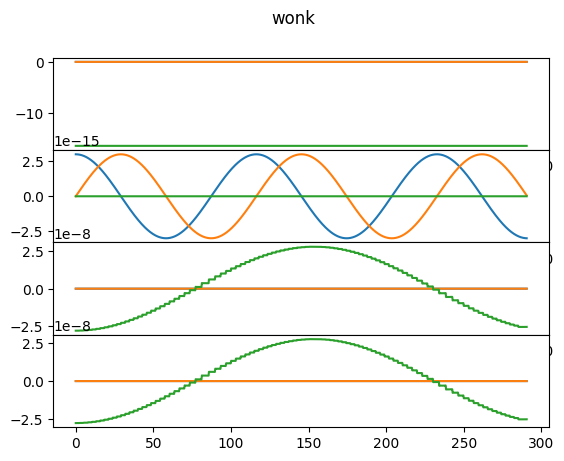

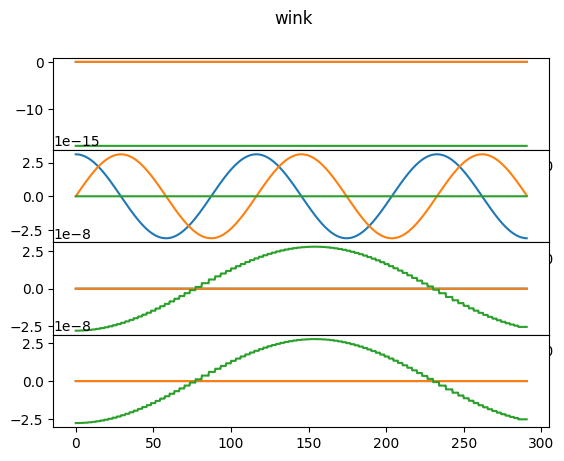

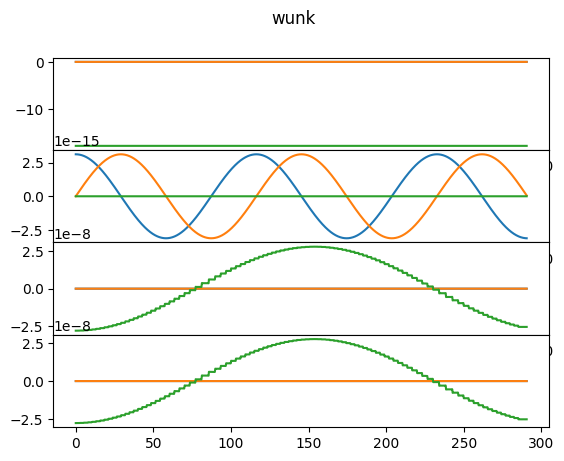

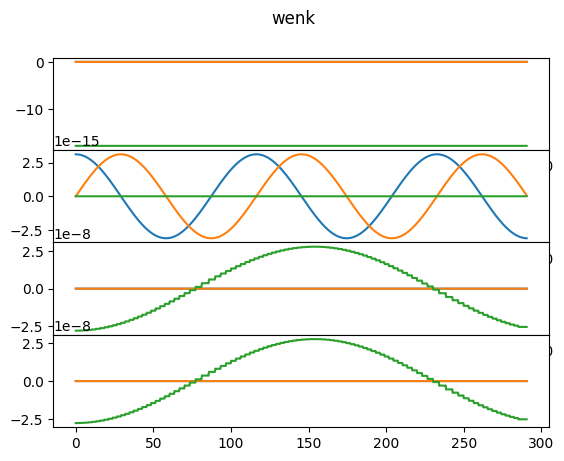

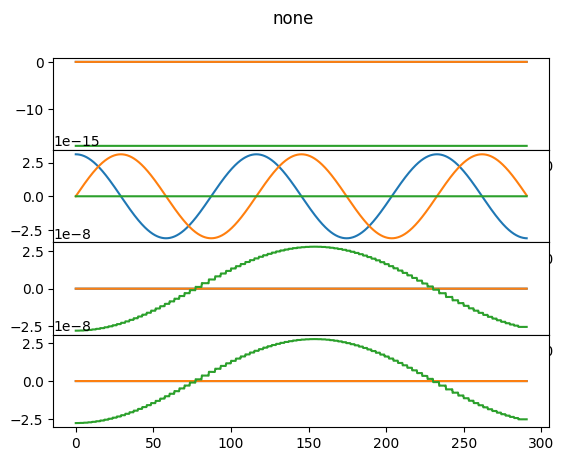

In [42]:
a = 0
for sim in lst:
    states = sim["raw"]
    sphere, time = states[5: sim["trackix"][1] - 5, 1:4], states[5: sim["trackix"][1] - 5, 0]
    int_sphere, int_time = mm.interpolate(sphere, time, False)
    div = np.mean(np.diff(int_time))
    quad = mm.trace_ortholize(int_sphere, a)
    delta = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
    coolquad = quad - (1/3)*np.einsum('i, jk -> ijk', np.einsum('ijj -> i', quad), delta)
    dt2, dt3 = mm.matrix_derive3(coolquad, int_time, int_time)
    dt2_q, dt3_q = mm.matrix_derive3(coolquad, int_time, int_time)
    fig, ax = plt.subplots(4,1)
    fig.subplots_adjust(hspace=0)
    b=2
    for a in [0, 1, 2]:
        ax[0].plot(int_time, coolquad[:, a, b])
        ax[1].plot(int_time, quad[:, a, b])
        ax[2].plot(int_time, dt3[:,a,b])
        ax[3].plot(int_time, dt3_q[:,a,b])
    fig.suptitle(sim["name"])
    plt.show()

In [37]:
print(sim5["raw"][100])
print(sim5["raw"][101])
print(sim5["raw"][100, 2])
print(sim5["raw"][100, 2] + sim5["raw"][100, 6]*2)
print(sim5["raw"][101, 2])

[ 1.89320562e+02  2.23339499e+01 -1.52901511e-01 -7.61323054e-03
  1.07654321e+00 -3.68105216e-03 -1.05152455e-02 -4.83050827e-05]
[ 1.91484488e+02  2.23268215e+01 -1.74044381e-01 -7.71037419e-03
  1.07657709e+00 -3.41150840e-03 -1.05219724e-02 -4.83529167e-05]
-0.1529015107547468
-0.1739320017664394
-0.17404438105203993


array([-35.59169174])

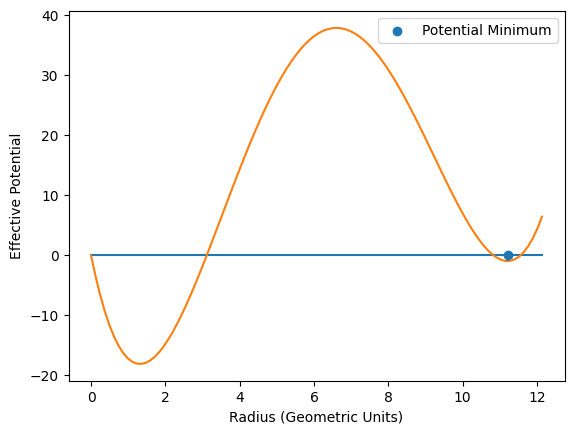

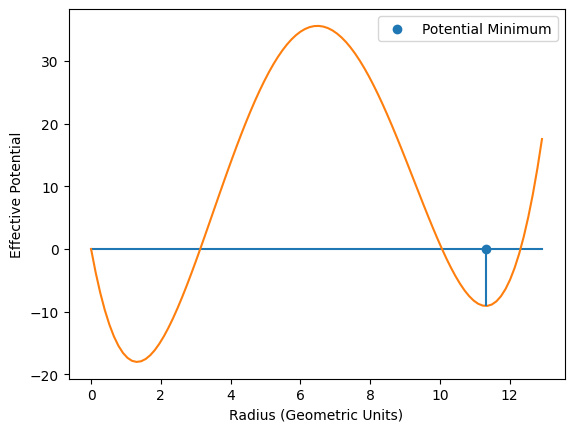

In [55]:
op.potentplotter(0.96, 3.91, 0.0, 0.0)
op.potentplotter(0.96, 3.90, 0.0, 0.0)

[0.9800380040774964, 0.0, 27.519792475937553, -0.99999, 1e-12]: [False, False, np.float64(24.110245795429353), np.float64(7.428459638470599e-07), np.float64(7.539457464619766e-07), np.float64(4295.205587743055), np.float64(4295.205587743055), np.float64(-3.3306690738754696e-15), np.float64(8.338688786192777e-15), np.float64(-4.1389114358025836e-12), np.float64(-4.149569576838985e-12), np.float64(-4.0607517348689726e-12), np.float64(-2.53115817705469e-09), np.float64(-7.539457464619766e-07)]

False False


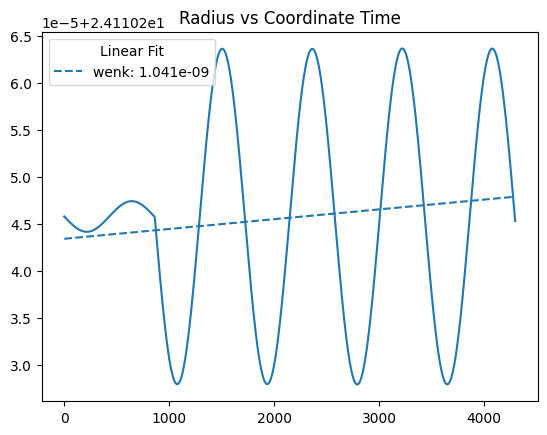

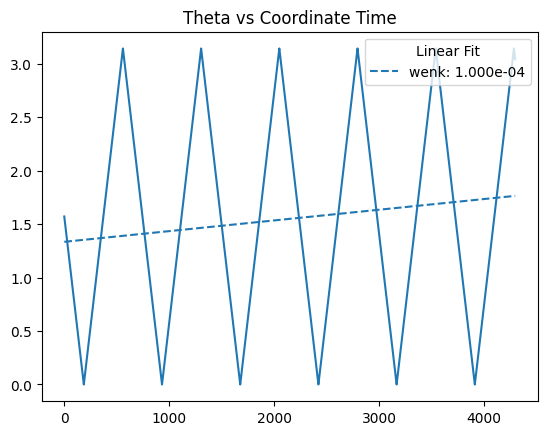

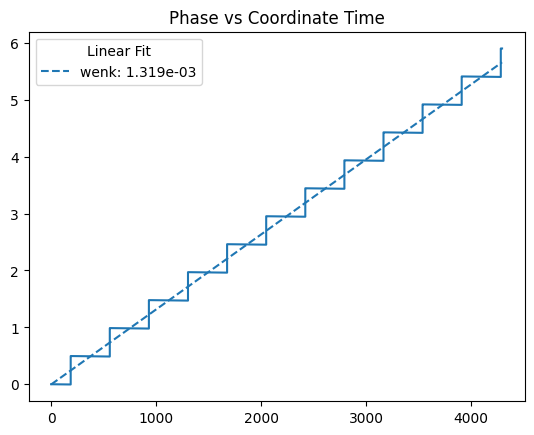

In [ ]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt

E, L, C, a, mu = [0.9800380040774964, 0.0, 27.519792475937553, -0.99999, 1e-12]
key = [E, L, C, a, mu]
sim = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk", trigger=2, err_target=1e-14, conch=100, verbose=0)
if sim["stop"] == True:
    abort = input("Did this break? Type anything to abort, or just enter to continue. ")
    if abort != "":
        print("%s: %s\n"%(key, np.nan*np.ones(14)))
        #break
else:
    vals = [sim["plunge"], sim["stop"], np.real(sim["p"][0]), np.real(sim["e"][0]), np.real(sim["inc"][0])]
    for thing in ["tracktime", "time", "energy", "phi_momentum", "carter", "r0", "p", "e", "inc"]:
        vals.append(np.real(sim[thing][-1] - sim[thing][0]))
    print("%s: %s\n"%(key, vals))
print(sim["plunge"], sim["stop"])
op.plotvalue3(sim, "time", "radius")
op.plotvalue3(sim, "time", "theta")
op.plotvalue3(sim, "time", "phase")

In [66]:
E, L, C, a = 0.970033, 0.0, 14, 0.9
new_step = mm.set_u_kerr(a, cons=[E, L, C], pos = [0, 6, 0.5*np.pi/180, 2*np.pi-np.pi/4])[0]
x = np.sqrt(new_step[1]**2 + a**2) * np.sin(new_step[2]) * np.cos(new_step[3])
y = np.sqrt(new_step[1]**2 + a**2) * np.sin(new_step[2]) * np.sin(new_step[3])
z = new_step[1] * np.cos(new_step[2])
x_dot = (new_step[5]*new_step[1]/(np.sqrt(new_step[1]**2 + a**2)) * np.sin(new_step[2]) * np.cos(new_step[3]) + np.sqrt(new_step[1]**2 + a**2) * new_step[6]*np.cos(new_step[2]) * np.cos(new_step[3]) - np.sqrt(new_step[1]**2 + a**2) * np.sin(new_step[2]) * new_step[7] * np.sin(new_step[3]))
y_dot = (new_step[5]*new_step[1]/(np.sqrt(new_step[1]**2 + a**2)) * np.sin(new_step[2]) * np.sin(new_step[3]) + np.sqrt(new_step[1]**2 + a**2) * new_step[6]*np.cos(new_step[2]) * np.sin(new_step[3]) + np.sqrt(new_step[1]**2 + a**2) * np.sin(new_step[2]) * new_step[7] * np.cos(new_step[3]))
z_dot = (new_step[5] * np.cos(new_step[2]) - new_step[1] * new_step[6] * np.cos(new_step[2]))
print(new_step)
print(np.array([new_step[0], x, y, z, new_step[4], x_dot, y_dot, z_dot]))
print(np.tan(new_step[2]))
print(np.roots([x_dot**2 + y_dot**2 - (z_dot*np.tan(new_step[2]))**2, 2*(x*x_dot + y*y_dot - z*z_dot*(np.tan(new_step[2]))**2), x**2 + y**2 - (z*np.tan(new_step[2]))**2]))
t = np.roots([x_dot**2 + y_dot**2 - (z_dot*np.tan(new_step[2]))**2, 2*(x*x_dot + y*y_dot - z*z_dot*(np.tan(new_step[2]))**2), x**2 + y**2 - (z*np.tan(new_step[2]))**2])[0]
new_x = x + x_dot*t
new_y = y + y_dot*t
new_z = z + z_dot*t
print("----")
print(x, new_x)
print(y, new_y)
print(z, new_z)
print(x, y, z)
print(new_x, new_y, new_z)
print("----")
new_t = new_step[0] + new_step[4]*t
new_r = np.sqrt(new_x**2 + new_y**2 + new_z**2 - (a*np.sin(new_step[2]))**2)
new_thet = new_step[2]
new_phi = np.atan(new_y/new_x) + (np.pi if new_x*new_y < 0 else 0) + (np.pi if new_y < 0 else 0)

print(new_step[0], new_t, t)
print(new_step[1], new_r)
print(new_step[2], new_thet)
print(new_step[3], new_phi)
print(np.array([new_t, new_r, new_thet, new_phi, *new_step[4:]]))
print(mm.set_u_kerr(a, cons=[E, L, C], pos= [new_t, new_r, new_thet, new_phi])[0])



[ 0.          6.          0.00872665  5.49778714  1.43921541 -0.10721011
 -0.10147429  0.01147145]
[ 0.          0.03743775 -0.03743775  5.99977154  1.43921541 -0.43554353
  0.43640246  0.50161652]
0.00872686779075879
[0.17201452 0.00094336]
----
0.03743775264769002 -0.037482059476755175
-0.03743775264769004 0.03762980804743605
5.999771538385028 6.086056864838994
0.03743775264769002 -0.03743775264769004 5.999771538385028
-0.037482059476755175 0.03762980804743605 6.086056864838994
----
0.0 0.24756594936968662 0.17201452141597762
6.0 6.086283544645985
0.008726646259971648 0.008726646259971648
5.497787143782138 2.3542274457692534
[ 0.24756595  6.08628354  0.00872665  2.35422745  1.43921541 -0.10721011
 -0.10147429  0.01147145]
[ 0.24756595  6.08628354  0.00872665  2.35422745  1.42983371 -0.11171283
 -0.09867866  0.01093235]


In [80]:
new_phi = np.atan(new_y/new_x) + (np.pi if new_x*new_y < 0 else 0) + (np.pi if new_y < 0 else 0)
old_phi = np.atan(y/x) + (np.pi if x*y < 0 else 0) + (np.pi if y < 0 else 0)
print(new_phi, old_phi)
print(new_phi - old_phi)
if (new_phi - old_phi)/new_step[7] >= 0:
    print("yay!", new_step[3], new_step[3] + (new_phi - old_phi))
else:
    print("gasp", new_step[3], new_step[3] + (2*np.pi - abs(new_phi - old_phi)))
print(new_phi)
print(new_step)
print(mm.set_u_kerr(a, cons=[E, L, C], pos= [new_t, new_r, new_thet, new_phi])[0] + np.array([0,0,0,2*np.pi, 0,0,0,0]))

2.3542274457692534 5.497787143782137
-3.1435596980128837
gasp 5.497787143782138 8.63741275294884
2.3542274457692534
[ 0.          6.          0.00872665  5.49778714  1.43921541 -0.10721011
 -0.10147429  0.01147145]
[ 0.24756595  6.08628354  0.00872665  8.63741275  1.42983371 -0.11171283
 -0.09867866  0.01093235]


2530 2531
4946 4946
4924 4924
4716 4716
4917 4917
5004 5004


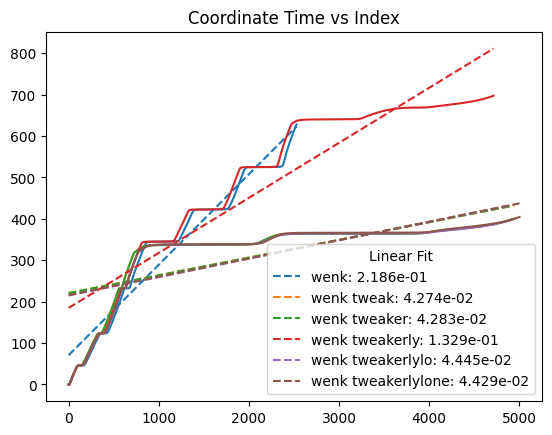

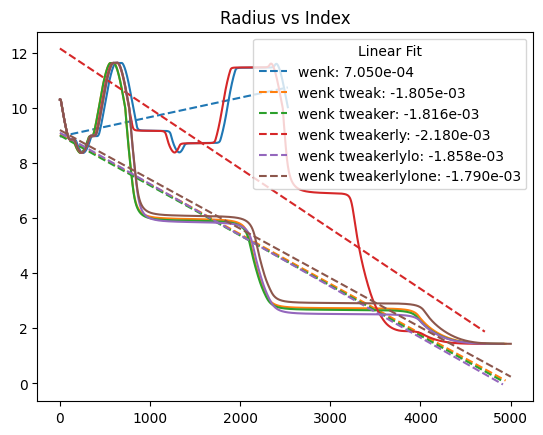

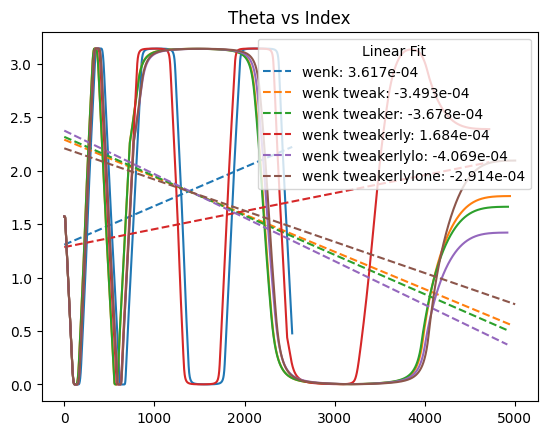

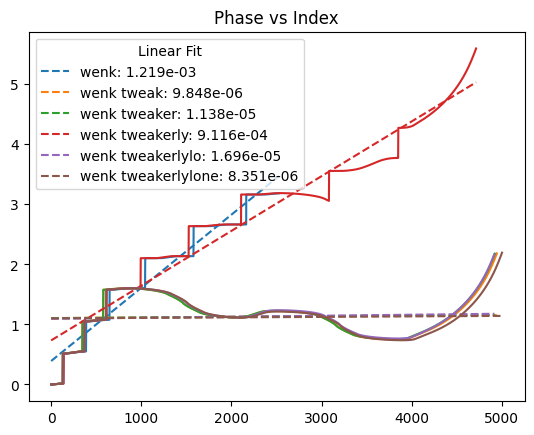

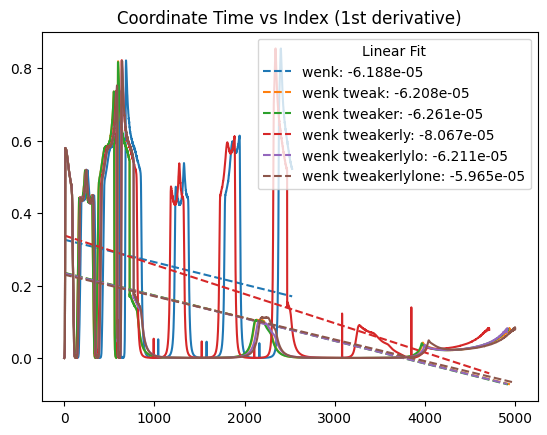

...

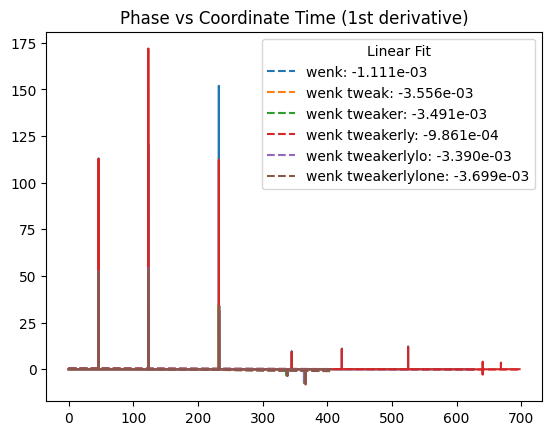

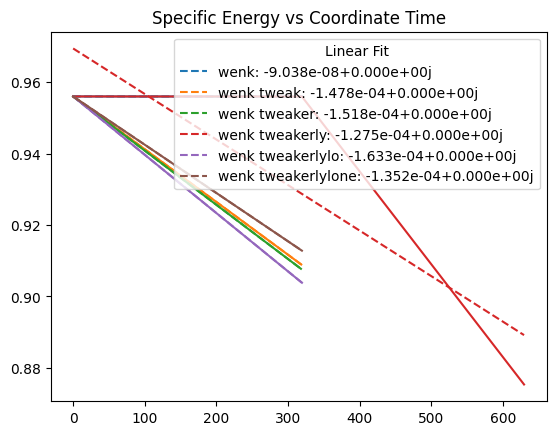

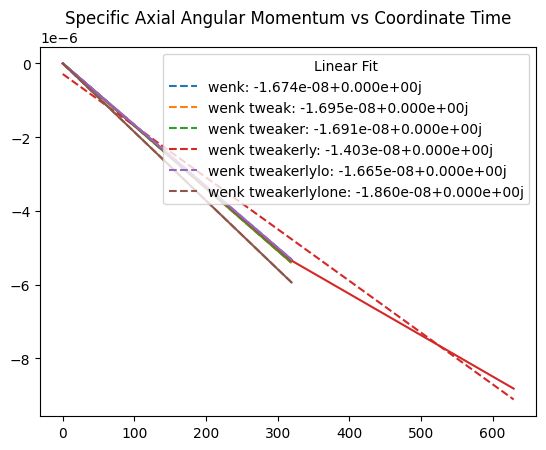

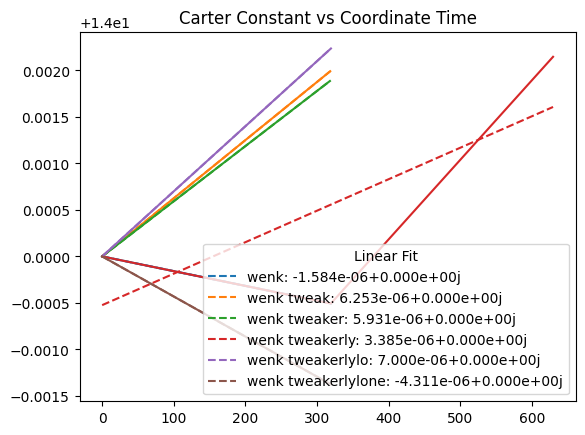

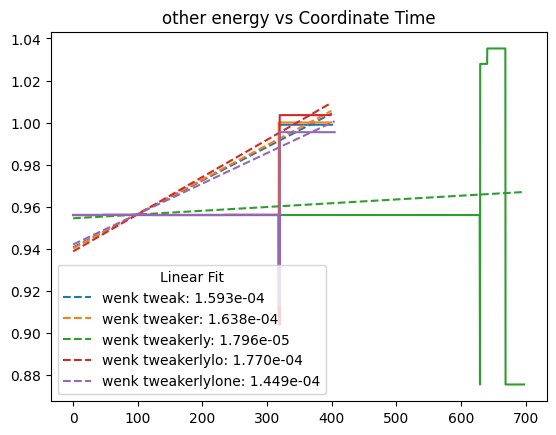

: 

In [4]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt

E, L, C, a, mu = 0.956, 0.0, 14, 0.9, 1e-4
#sim1 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk", trigger=2, err_target=1e-14, conch=100)
#sim2 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk tweak", trigger=2, err_target=1e-14, conch=100)
#sim3 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk tweaker", trigger=2, err_target=1e-14, conch=100)
#sim4 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk tweakerly", trigger=2, err_target=1e-14, conch=100)
#sim5 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk tweakerlylo", trigger=2, err_target=1e-14, conch=100)
#sim6 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[E, L, C], bonk=3, label="wenk tweakerlylone", trigger=2, err_target=1e-14, conch=100)

lst = [sim1, sim2, sim3, sim4, sim5, sim6]

for sim in lst:
    print(len(sim["time"]), len(sim["energy2"]))

op.plotvalue3(lst, "index", "time")
op.plotvalue3(lst, "index", "radius")
op.plotvalue3(lst, "index", "theta")
op.plotvalue3(lst, "index", "phase")
op.plotvalue3(lst, "index", "time", derv=1)
op.plotvalue3(lst, "index", "radius", derv=1)
op.plotvalue3(lst, "index", "theta", derv=1)
op.plotvalue3(lst, "index", "phase", derv=1)
op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "time", "theta")
op.plotvalue3(lst, "time", "phase")
op.plotvalue3(lst, "time", "radius", derv=1)
op.plotvalue3(lst, "time", "theta", derv=1)
op.plotvalue3(lst, "time", "phase", derv=1)
op.plotvalue3(lst, "tracktime", "energy")
op.plotvalue3(lst, "tracktime", "L_z")
op.plotvalue3(lst, "tracktime", "carter")
op.plotvalue3(lst[1:], "time", "energy2")



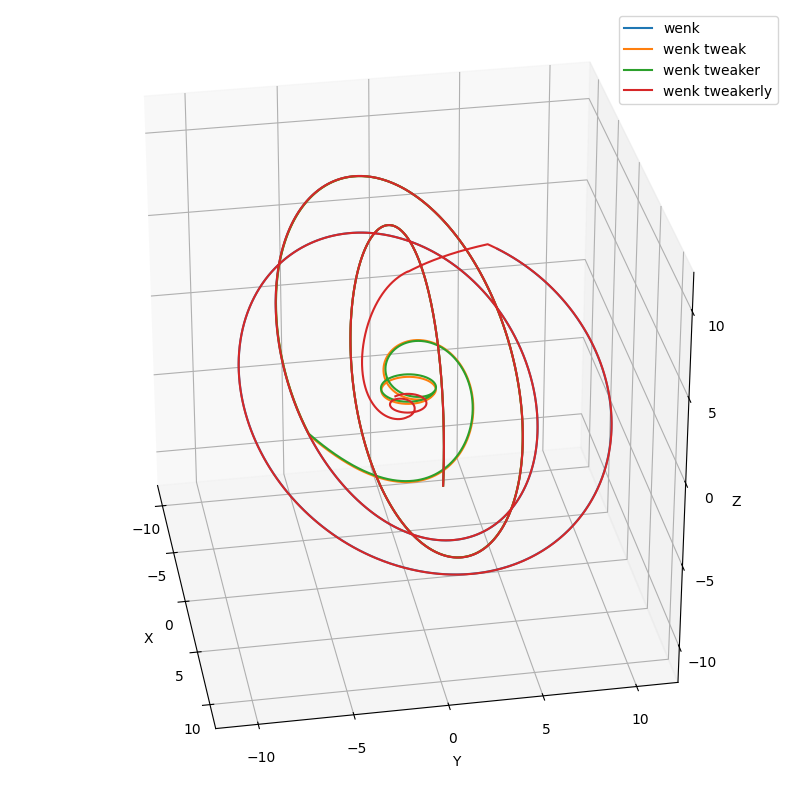

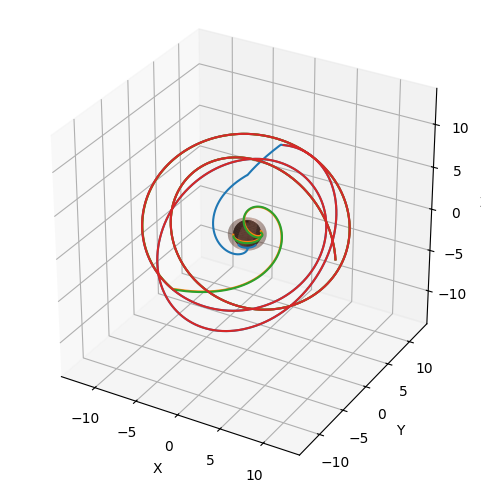

False.gif


True

In [ ]:
op.orthoplots(lst, azi=-10)
op.ani_thing4(lst[::-1])


(-1.6, -1.3962634015954636)

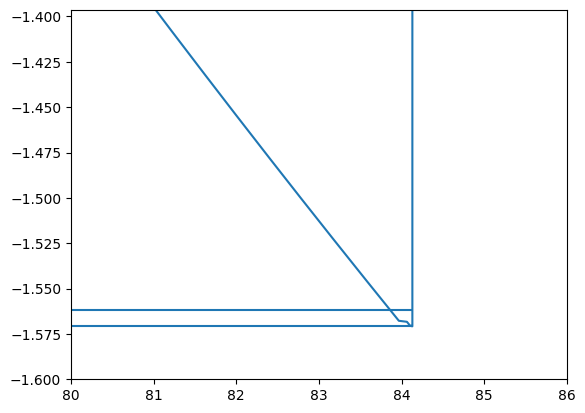

In [11]:
def anglething(angle):
    return 0.5*np.pi - np.abs(angle%np.pi - np.pi/2)

#plt.plot(sim1["time"], [ang for ang in sim1["raw"][:,2]])
plt.plot(sim1["time"], [np.sign(pos[6])*(np.pi/2 - pos[2]%np.pi) for pos in sim1["raw"]])
#plt.hlines([0.5*(np.pi/180), 175.5*(np.pi/180)], sim1["time"][0], sim1["time"][-1])
plt.hlines([-89.5*(np.pi/180), -np.pi/2], sim1["time"][0], sim1["time"][-1])
plt.xlim(80, 86)
plt.ylim(-1.60, -80*(np.pi/180))

(80.0, 86.0)

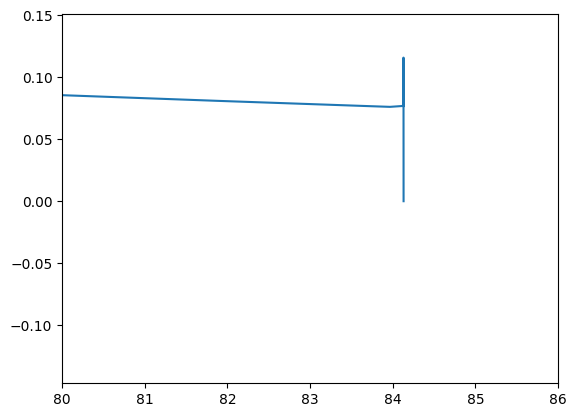

In [ ]:
plt.plot(sim1["time"], sim1["raw"][:,6])
#plt.hlines([0.5*(np.pi/180), 175.5*(np.pi/180)], sim1["time"][0], sim1["time"][-1])
#plt.hlines([-89.5*(np.pi/180), -np.pi/2], sim1["time"][0], sim1["time"][-1])
plt.xlim(80, 86)
#plt.ylim(-1.60, -80*(np.pi/180))

In [3]:
np.array([np.float64(1.0038159227638001e-11), np.float64(-4.670319222648216e-10), np.float64(-0.2084959306627632), np.float64(0.0008242615501430001), np.float64(-2.3545749653045178e-08)])

array([ 1.00381592e-11, -4.67031922e-10, -2.08495931e-01,  8.24261550e-04,
       -2.35457497e-08])

In [2]:
np.array([np.float64(0.20849592502763878), np.float64(-0.0008242615501430001), np.float64(2.3545749653045045e-08)])

array([ 2.08495925e-01, -8.24261550e-04,  2.35457497e-08])

Normalizing initial state


10001063.690711265it [00:10, 916991.13it/s, Semilat: (19.468+0j), Ecc (0.438+0j)]                               


Normalizing initial state


  8%|▊         | 761327.5149576955/10000000 [00:04<00:56, 163392.50it/s, Semilat: (7.369+0.821j), Ecc (0.826-0.019j)] 
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2265: RuntimeWarning: invalid value encountered in scalar power
  Xt = integrate.quad(lambda x: 1/(J2(x)**0.5), 0.0, np.pi)[0]
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2265: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  Xt = integrate.quad(lambda x: 1/(J2(x)**0.5), 0.0, np.pi)[0]
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2266: RuntimeWarning: invalid value encountered in scalar power
  Yt = integrate.quad(lambda x: (p**2)/(((1+e*np.cos(x))**2)*(J2(x)**0.5)), 0.0, np.pi)[0]
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline

Normalizing initial state


  3%|▎         | 283023.26973635604/10000000 [00:01<00:52, 184535.35it/s, Semilat: (3.831+0j), Ecc 0.365j] 


Normalizing initial state
Don't trust this! [1.0, 0.25, 1e-12, 'rad_orbit > 5', 1e-14, 'wenk unbound', [1.01, 3, 14], False, False, False, False, 'grav']


  6%|▌         | 611169.3933092358/10000000 [00:01<00:23, 405689.88it/s, Semilat: (3.652+0j), Ecc (0.555+0j)] 


Normalizing initial state
Don't trust this! [1.0, 0.25, 1e-12, 'rad_orbit > 5', 1e-14, 'wenk unreal?', [0.98, 3.98, 14], False, False, False, False, 'grav']


 15%|█▍        | 1497286.3329980432/10000000 [00:01<00:08, 1044883.03it/s, Semilat: (26.836-0j), Ecc 0.332j]



Ending program


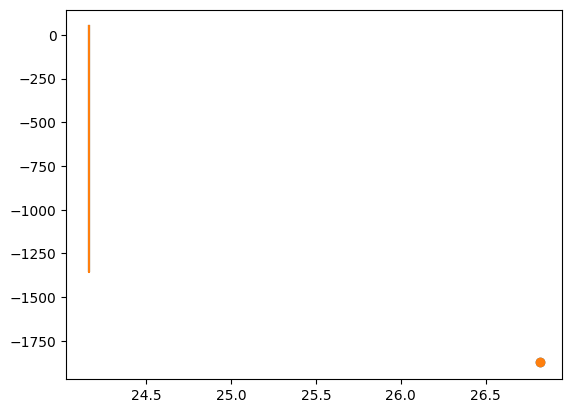

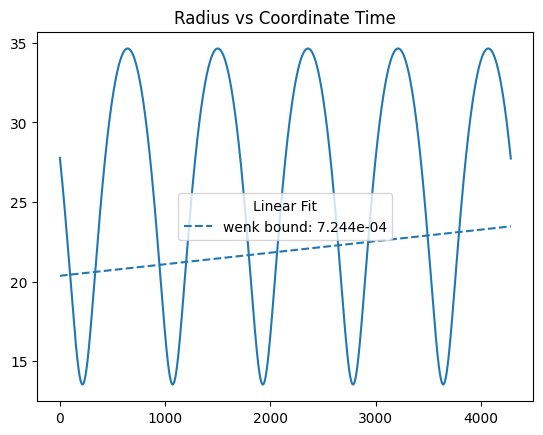

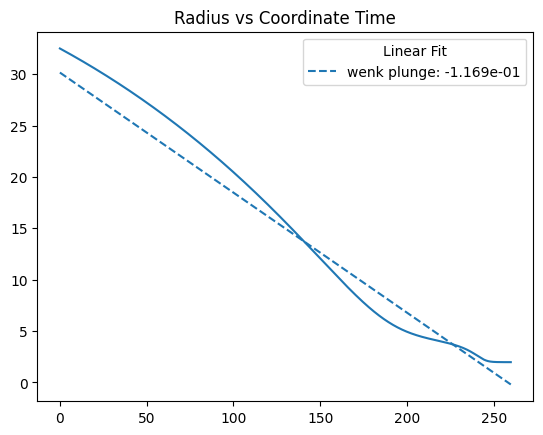

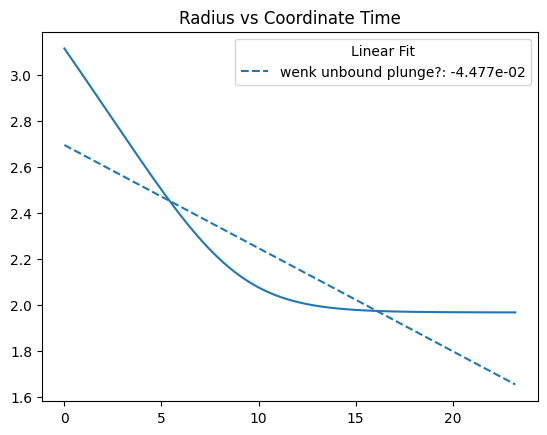

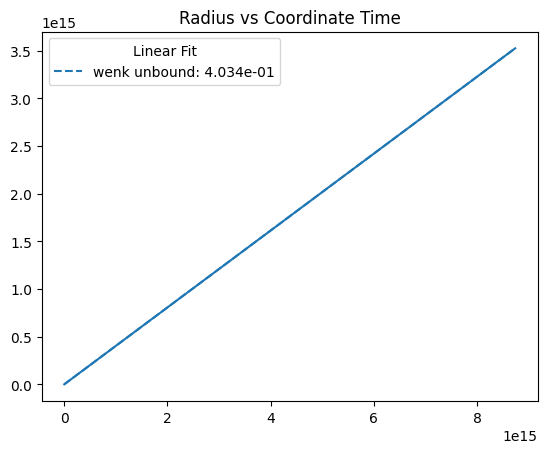

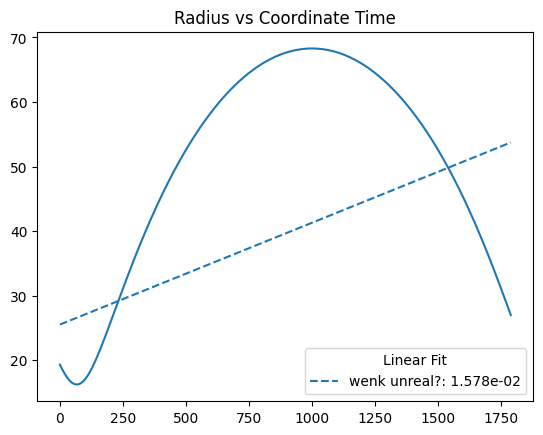

In [11]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt

a, mu, C = 0.25, 1e-12, 14
sim1 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[0.98, 3, C], bonk=3, label="wenk bound", trigger=2, err_target=1e-14, conch=100)
sim2 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[0.98, 0.5, C], bonk=3, label="wenk plunge", trigger=2, err_target=1e-14, conch=100)
sim3 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[1.01, 0.5, C], bonk=3, label="wenk unbound plunge?", trigger=2, err_target=1e-14, conch=100)
sim4 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[1.01, 3, C], bonk=3, label="wenk unbound", trigger=2, err_target=1e-14, conch=100)
sim5 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[0.98, 3.98, C], bonk=3, label="wenk unreal?", trigger=2, err_target=1e-14, conch=100)

for sim in [sim1, sim2, sim3, sim4, sim5]:
    op.plotvalue3(sim, "time", "radius")

In [9]:
coeff = np.array([0.98**2 - 1, 2.0, (a**2)*(0.98**2 - 1) - 3.98**2 - 14, 2*((a*0.98 - 3.98)**2) + 2*14, -14*(a**2)])
coeff2 = np.polyder(coeff)
keps = np.array([np.sort(np.roots(coeff2))[-1], *np.sort(np.real(np.roots(coeff)))[-2:]])
print(np.roots(coeff2), np.roots(coeff))
print(keps)
pot_min, inner_turn, outer_turn = keps.real[abs(keps.imag)<(1e-6)*abs(keps[0])]
print(pot_min, inner_turn, outer_turn)
mm.root_getter(0.98, 4, 14, 0.25)

[19.33060499 17.50527554  1.04290735] [2.41654003e+01+8.03268759j 2.41654003e+01-8.03268759j
 2.15846425e+00+0.j         1.57857163e-02+0.j        ]
[19.33060499 24.16540027 24.16540027]
19.33060499058982 24.165400267634695 24.165400267634695


(array([1.57008467e-02+0.j        , 2.15639914e+00+0.j        ,
        2.41664753e+01-8.28262475j, 2.41664753e+01+8.28262475j]),
 array([ 1.04221384+0.j        , 18.41828702+1.09281507j,
        18.41828702-1.09281507j]),
 array([-6.95053266e+02+0.j, -6.83129674e-01+0.j,  6.83129674e-01+0.j,
         6.95053266e+02+0.j]))

In [16]:
np.where(np.array([1,2,3,4]) < 3)[0]

array([0, 1])

In [24]:
t, f, z = mm.root_getter(0.99, 6, 0, 0.0)
#np.arccos(np.mean(np.abs(z[1:3])))/np.pi
print(t)

[-7.10542736e-15+0.j  2.28297733e+00+0.j  2.03529072e+01+0.j
  7.78666280e+01+0.j]


In [26]:
len("np.float64(8.782908045943793e-07)")

33

<class 'dict'>


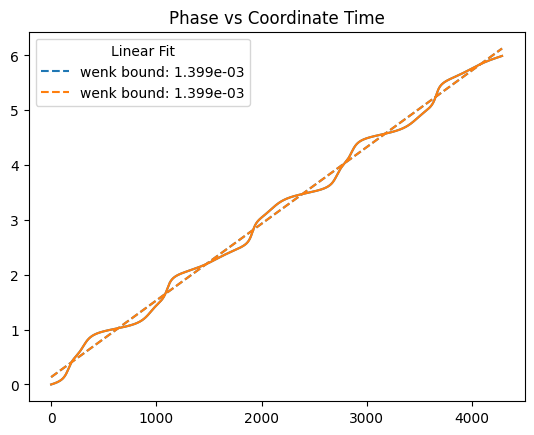

In [38]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt

a, mu, C = 0.25, 1e-12, 14
#sim1 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[0.98, 3, C], bonk=3, label="wenk bound", trigger=2, err_target=1e-14, conch=100)
#sim2 = ml.EMRIGenerator( a, mu, endflag="rad_orbit > 5", cons=[0.98, 0.5, C], bonk=3, label="wenk plunge", trigger=2, err_target=1e-14, conch=100)

dct_lst = [sim1, sim2]

import pickle 

with open('saved_dictionary.pkl', 'wb') as f:
    pickle.dump(sim1, f)
        
with open('saved_dictionary.pkl', 'rb') as f:
    loaded_dict = pickle.load(f)

print(type(loaded_dict))
op.plotvalue3([sim1, loaded_dict], "time", "phase")

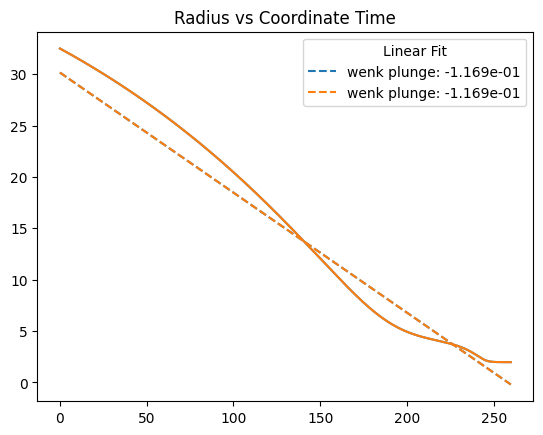

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [36]:
sim1_0, sim2_0 = loaded_dict
op.plotvalue3([sim2, sim2_0], "time", "radius")

for key, value in sim1.items():
    if sim1[key] != sim1_0[key]:
        print(False)

In [46]:
def peters_test_inv(E, L, C, q):
    turns, flats, zs = mm.root_getter(E, L, C, 0)
    r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
    b = (64/5)*q*(1+q)
    dt = (r0**4/(4*b))/100
    vals = [[0, E, L, C, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))]]
    print(p)
    oldp = p
    while (vals[-1][4] > 6 and np.isreal(vals[-1][5])) and abs(p) < 100:
        try:
            E_1 = vals[-1][1] + (32/5) * (q**2)*(1 + q)*(1 + (73/24)*(e**2) + (37/96)*(e**4))/((r0**5)*((1 - e**2)**(7/2)))*dt
            fullL = np.sqrt(vals[-1][2]**2 + vals[-1][3])
            fullL_1 = fullL + (32/5) * (q**2)*((1 + q)**0.5)*(1 + (7/8)*(e**2))/((r0**3.5)*((1 - e**2)**2))*dt
            L_1 = fullL_1*vals[-1][2]/np.sqrt(vals[-1][2]**2 + vals[-1][3])
            C_1 = (fullL_1*np.sqrt(vals[-1][3]/(vals[-1][2]**2 + vals[-1][3])))**2
            turns, flats, zs = mm.root_getter(E_1, L_1, C_1, 0)
            r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
            vals.append([vals[-1][0] - dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])
            dt = (r0**4/(4*b))/100
            if 100*abs(p - oldp)/oldp > 3:
                print(p)
                oldp = p
        except:
            break
    return np.array(vals)

thing2 = peters_test_inv(*mm.schmidtparam3(10/(1 - 0.3**2), 0.3, np.pi/2, 0.0), 1e-4)

(10.000000000000227+0j)
(10.300003468023217+0j)
(10.609007943759332+0j)
(10.927281994761708+0j)
(11.255103399819003+0j)
(11.592757251086155+0j)
(11.940543934463864+0j)
(12.298762631284124+0j)
(12.66772841467584+0j)
(13.047765516027296+0j)
(13.439205054484246+0j)
(13.842381385878635+0j)
(14.257656106261491+0j)
(14.6853863342194+0j)
(15.125955769958653+0j)
(15.579738568068928+0j)
(16.047130981761814+0j)
(16.528546120564936+0j)
(17.024406446748642+0j)
(17.535143476373964+0j)
(18.0612077597877+0j)
(18.603047576483792+0j)
(19.161140113427702+0j)
(19.735982688477016+0j)
(20.328065860891858+0j)
(20.93790874739714+0j)
(21.566046520851565+0j)
(22.213028537753704+0j)
(22.87943362085116+0j)
(23.565833163556352+0j)
(24.27282069801727+0j)
(25.001011532928125+0j)
(25.751041881955416+0j)
(26.523595118684618+0j)
(27.319321299076066+0j)
(28.138907106956733+0j)
(28.983084458099764+0j)
(29.852602293224418+0j)
(30.7482227943209+0j)
(31.67071649219946+0j)
(32.62085627835601+0j)
(33.59954507749196+0j)
(34.6

C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_25892\480197306.py:18: RuntimeWarning: invalid value encountered in arccos
  vals.append([vals[-1][0] - dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])


(3.8737477762829315+0j)
(3.7575343286264387+0j)
(3.644807894503754+0j)
(3.535463577828132+0j)


3095814


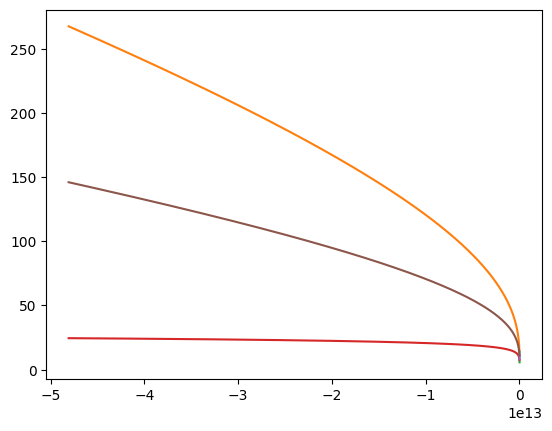

In [89]:
print(len(thing2))
plt.plot(thing[:,0], thing[:,5]/(1 - thing[:,6]))
plt.plot(thing2[:-1200000,0], thing2[:-1200000,5]/(1 - thing2[:-1200000,6]))#, thing2[:,1])#, thing2[:,6])
plt.plot(thing[:,0], thing[:,5]/(1 + thing[:,6]))
plt.plot(thing2[:-1200000,0], thing2[:-1200000,5]/(1 + thing2[:-1200000,6]))
plt.plot(thing[:,0], thing[:,5]/(1 - thing[:,6]**2))
plt.plot(thing2[:-1200000,0], thing2[:-1200000,5]/(1 - thing2[:-1200000,6]**2))

In [90]:
np.isreal(17.99999895499991+7.481383272373666e-16j)

False

In [128]:
#simd = ml.EMRIGenerator(0.9, 1e-3, endflag="radius < 2", params=[7/(1 - 0.1**2), 0.1, 0.75*np.pi/2], bonk=3, label="wenk d", trigger=2, err_target=1e-14, conch=100)
#sime = ml.EMRIGenerator(0.9, 1e-3, endflag="radius < 2", params=[7/(1 - 0.2**2), 0.2, 0.75*np.pi/2], bonk=3, label="wenk e", trigger=2, err_target=1e-14, conch=100)
#simf = ml.EMRIGenerator(0.9, 1e-3, endflag="radius < 2", params=[7/(1 - 0.3**2), 0.5, 0.75*np.pi/2], bonk=3, label="wenk f", trigger=2, err_target=1e-14, conch=100)
simg = ml.EMRIGenerator(0.2, 1e-3, endflag="radius < 2", params=[7/(1 - 0.1**2), 0.1, 0.75*np.pi/2], bonk=3, label="wenk g", trigger=2, err_target=1e-14, conch=100)
simh = ml.EMRIGenerator(0.2, 1e-3, endflag="radius < 2", params=[7/(1 - 0.2**2), 0.2, 0.75*np.pi/2], bonk=3, label="wenk h", trigger=2, err_target=1e-14, conch=100)
simi = ml.EMRIGenerator(0.2, 1e-3, endflag="radius < 2", params=[7/(1 - 0.3**2), 0.5, 0.75*np.pi/2], bonk=3, label="wenk i", trigger=2, err_target=1e-14, conch=100)



Normalizing initial state


10000351.03009276it [01:10, 142124.21it/s, Semilat: (5.558+0.169j), Ecc (0.104-0.027j)]                               


Normalizing initial state


10000356.954582164it [01:02, 160113.93it/s, Semilat: (5.742+0.05j), Ecc (0.202-0.007j)]                               


Normalizing initial state


10000100.686054772it [00:01, 5778592.41it/s, Semilat: (5.95+1.238j), Ecc (0.484-0.107j)]                               


In [50]:
mm.find_rmb(0.9), mm.find_rms(0.9), 6/(1 + 0.1)

(np.float64(1.732455532033676),
 np.float64(2.320883041761887),
 5.454545454545454)

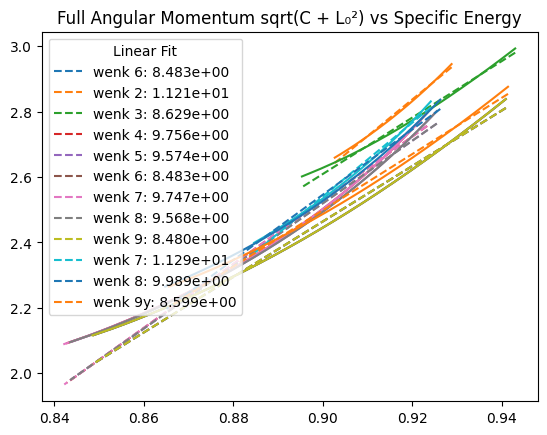

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


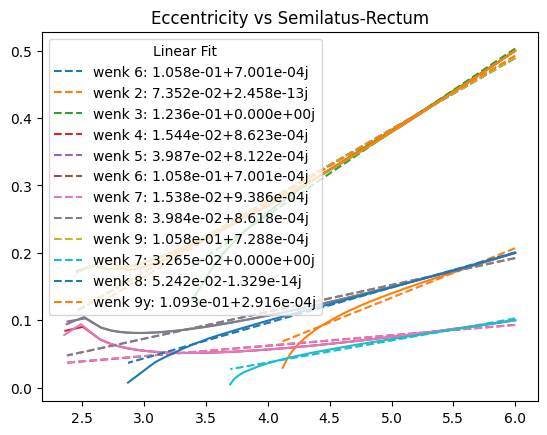

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


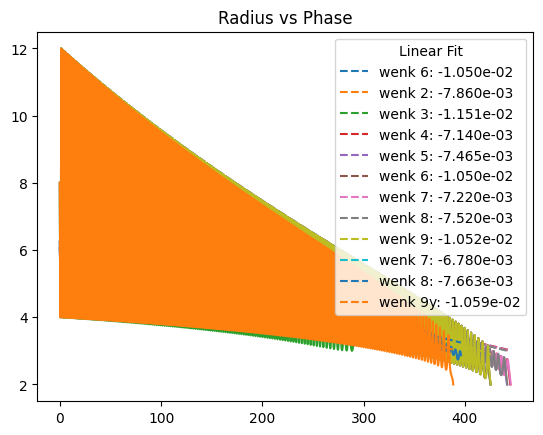

In [72]:
#op.plotvalue3(sim, "time", "radius")
#op.plotvalue3(sim, "tracktime", "energy")
#op.plotvalue3(sim, "tracktime", "L_z")
#op.plotvalue3(sim, "tracktime", "carter")
#op.plotvalue3(sim, "tracktime", "approx_L")
op.plotvalue3([sim, sim2, sim3, sim4, sim5, sim6, sim7, sim8, sim9, sima, simb, simc], "energy", "approx_L")
#plt.plot(sim["energy"], sim["phi_momentum"])
op.plotvalue3([sim, sim2, sim3, sim4, sim5, sim6, sim7, sim8, sim9, sima, simb, simc], "semilat", "ecc")
op.plotvalue3([sim, sim2, sim3, sim4, sim5, sim6, sim7, sim8, sim9, sima, simb, simc], "phase", "radius")

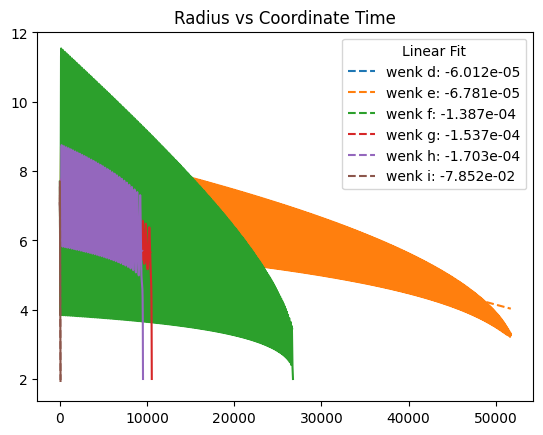

Could not plot linear fit.


C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\_polynomial_impl.py:657: RuntimeWarning: invalid value encountered in divide
  lhs /= scale


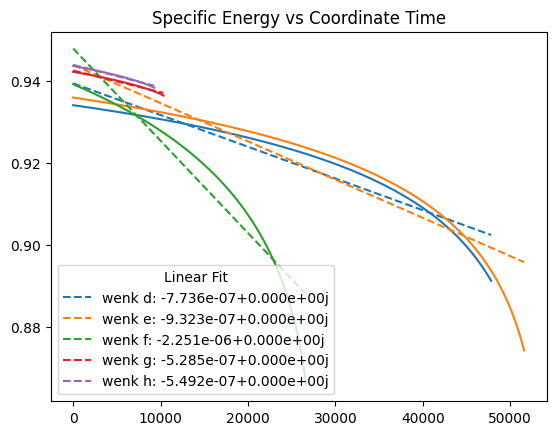

Could not plot linear fit.


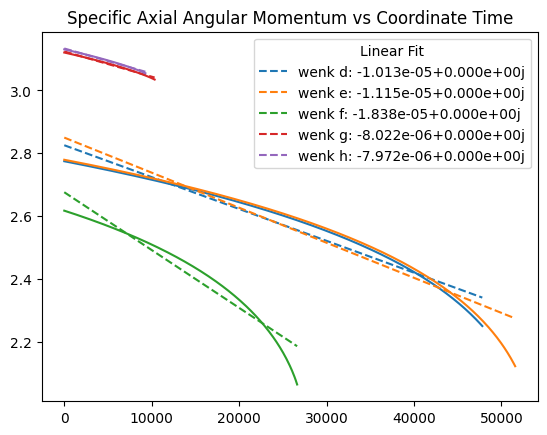

Could not plot linear fit.


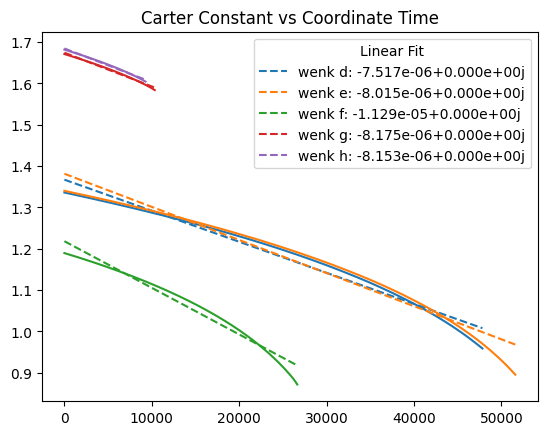

Could not plot linear fit.


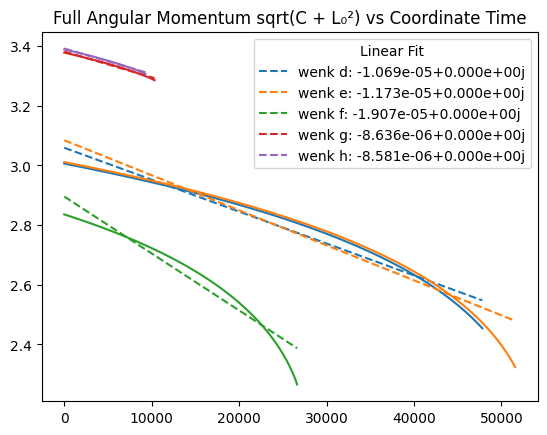

c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


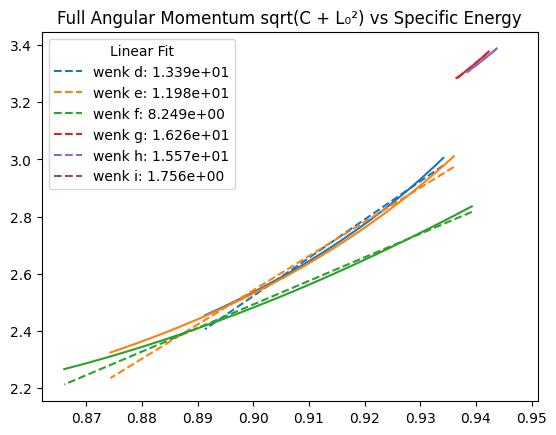

c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


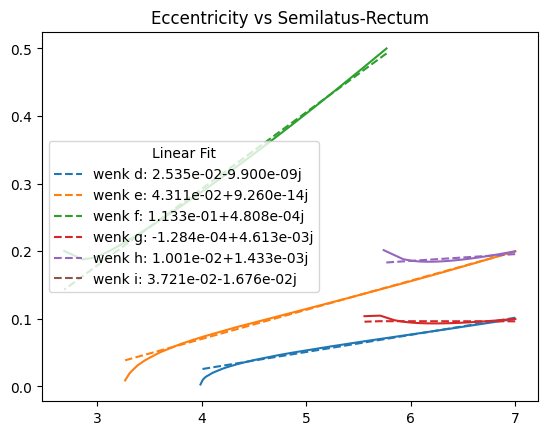

c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\OrbitPlotter.py:429: RankWarning: Polyfit may be poorly conditioned
  stuff = np.polyfit(xvals, yvals, 1)


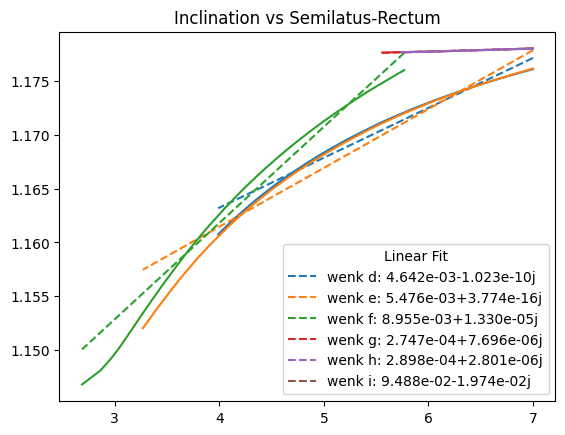

In [129]:
lst = [simd, sime, simf, simg, simh, simi]
op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "tracktime", "energy")
op.plotvalue3(lst, "tracktime", "L_z")
op.plotvalue3(lst, "tracktime", "carter")
op.plotvalue3(lst, "tracktime", "approx_L")
op.plotvalue3(lst, "energy", "approx_L")
op.plotvalue3(lst, "semilat", "ecc")
op.plotvalue3(lst, "semilat", "inc")


(2.08, 2.18)

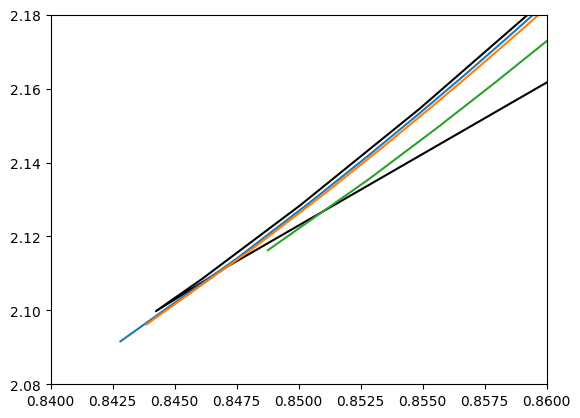

In [ ]:
Yfunc = lambda r, a, C: r**5 - C*(r - 3)*(r**3) + (a*C)**2
circE2 = lambda r, a, C: ((r**3)*(r - 2) - a*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
circL2 = lambda r, a, C: -(2*a*(r**3) + (r**2 + a**2)*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))

r_s = np.linspace(2, 10)
plt.plot(circE2(r_s, 0.9, 0), circL2(r_s, 0.9, 0), c="k")
for sim in [sim4, sim5, sim6]:
    plt.plot(sim["energy"], sim["phi_momentum"])

plt.xlim(0.84, 0.86)
plt.ylim(2.08, 2.18)

In [124]:
tests = []
for i in np.linspace(0, 1):
    tests.append(ml.EMRIGenerator(0, 0.0, endflag="rad_orbit > 2", params=[10/(1 - 0.1**2), 0.1, i*np.pi/2], bonk=3, label="wenk test", trigger=2, err_target=1e-14, conch=100))


Normalizing initial state


c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2272: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best which can be obtained.
  Pk = integrate.quad(lambda p: 1/((1-(zm*np.sin(p))**2)*np.sqrt(1 - k*(np.sin(p)**2))), 0, np.pi/2)[0]
10007626.773023074it [00:01, 5758567.67it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MainLoopStreamline.py:949: ComplexWarning: Casting complex values to real discards the imaginary part
  "trackix": np.array([int(num) for num in tracker[:,6]]),


Normalizing initial state


10004571.41692705it [00:07, 1259239.56it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10002868.540622192it [00:06, 1537086.40it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001433.841383584it [00:05, 1684244.19it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10002605.006590461it [00:05, 1734937.60it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001663.873555858it [00:05, 1729984.93it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000478.002220003it [00:05, 1765451.97it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001508.71689291it [00:05, 1814443.99it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10001556.131837826it [00:05, 1790955.50it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001216.06845633it [00:05, 1757581.54it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10001307.432988856it [00:05, 1774825.10it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001203.17642109it [00:05, 1753127.58it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10001306.913856102it [00:05, 1827278.01it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000480.726976728it [00:05, 1859913.61it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10002767.713872751it [00:05, 1744761.29it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001984.321588187it [00:05, 1780220.59it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001661.534406934it [00:05, 1841897.89it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000671.413905172it [00:05, 1912605.93it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000174.052872209it [00:05, 1930825.22it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000057.998984989it [00:05, 1996748.01it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000419.447347647it [00:04, 2009189.74it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003018.810540546it [00:04, 2033630.06it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000885.145179454it [00:04, 2067691.79it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10002182.357441073it [00:04, 2043060.07it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000250.208394857it [00:04, 2048673.15it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003228.960529646it [00:04, 2035769.05it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003176.646492288it [00:05, 1971765.40it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001280.058669213it [00:04, 2042068.35it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10002078.067840667it [00:04, 2300920.49it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003242.761291435it [00:04, 2405250.35it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000014.331008153it [00:04, 2395806.68it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001749.653491374it [00:04, 2390445.70it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003161.813813007it [00:04, 2477359.57it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003241.08856638it [00:04, 2491722.59it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10003704.200142957it [00:03, 2579200.40it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003590.159007477it [00:03, 2743067.00it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000652.665288795it [00:03, 2749645.05it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001083.382457593it [00:03, 2810000.91it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10001456.673863277it [00:03, 2982868.65it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10004875.827540223it [00:03, 3155882.17it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10004447.6265148it [00:03, 3020650.65it/s, Semilat: (10+0j), Ecc (0.1+0j)]                                


Normalizing initial state


10002001.70678215it [00:02, 3401321.97it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10004395.753914826it [00:02, 3564169.19it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003791.159138532it [00:02, 3694877.27it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10002433.608219238it [00:02, 4141690.25it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10000192.45277457it [00:02, 4374014.56it/s, Semilat: (10+0j), Ecc (0.1+0j)]                               


Normalizing initial state


10007627.088943794it [00:02, 4631230.76it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10003199.776780806it [00:01, 5432316.10it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10009010.315513982it [00:01, 5304166.30it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


Normalizing initial state


10013878.192687778it [00:01, 5455584.15it/s, Semilat: (10+0j), Ecc (0.1+0j)]                              


-1.286754288232217e-05 0.0 1.2867520994641023e-05 0.0 1.2867520994641023e-05
-1.286111125686773e-05 4.67717257602924e-11 1.2854480705302367e-05 -4.12245929657308e-07 1.2861089413875383e-05
-1.2858750449318279e-05 6.638304291001775e-11 1.2832306568716436e-05 -8.239001274475524e-07 1.2858728681247528e-05
-1.2856851303144623e-05 7.637155075079525e-11 1.2797415463679937e-05 -1.234595552879858e-06 1.2856829653342138e-05
-1.2858185176156667e-05 8.21061436481412e-11 1.2752592369820655e-05 -1.6443117134978744e-06 1.2858163677940008e-05
-1.2856988703013883e-05 8.323209197802275e-11 1.2692156475188617e-05 -2.0520172824729745e-06 1.2856967407797521e-05
-1.2855514526677325e-05 8.177055075462196e-11 1.261841844066433e-05 -2.4574842058575323e-06 1.2855493478370376e-05
-1.2856753862422465e-05 7.911072511290176e-11 1.253437798658328e-05 -2.86093591479294e-06 1.2856733093027721e-05
-1.2856791526516531e-05 7.307447184155842e-11 1.2436278164462715e-05 -3.261218796291704e-06 1.2856771080894236e-05
-1.2856

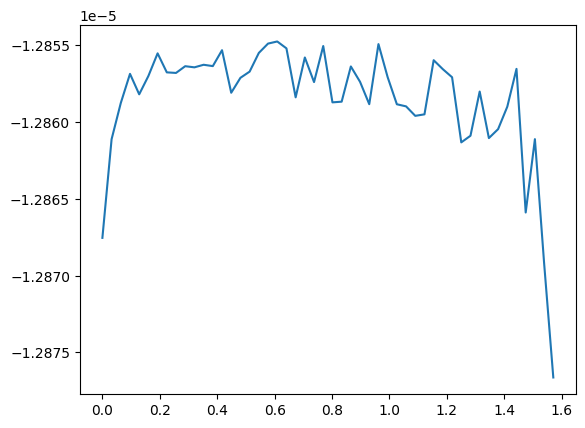

In [125]:
bunk = []

for test in tests:
    arf = mm.peters_integrate6_6(test["raw"], test["spin"], 1e-5, 0, 100)
    #print(*arf[1:])
    bark = mm.new_recalc_state9([test["energy"][0], test["phi_momentum"][0], test["carter"][0]], arf, test["raw"][-1], test["spin"])
    woof = np.array(bark[1]) - np.array([test["energy"][0], test["phi_momentum"][0], test["carter"][0]])
    wurf = np.sqrt(bark[1][1]**2 + bark[1][2]) - np.sqrt(test["phi_momentum"][0]**2 + test["carter"][0])
    print(wurf, *arf[1:], np.linalg.norm(arf[1:]))
    #print("---")
    bunk.append([test["inputs"][9][2], wurf])
bunk = np.array(bunk)
plt.plot(bunk[:,0], bunk[:,1])

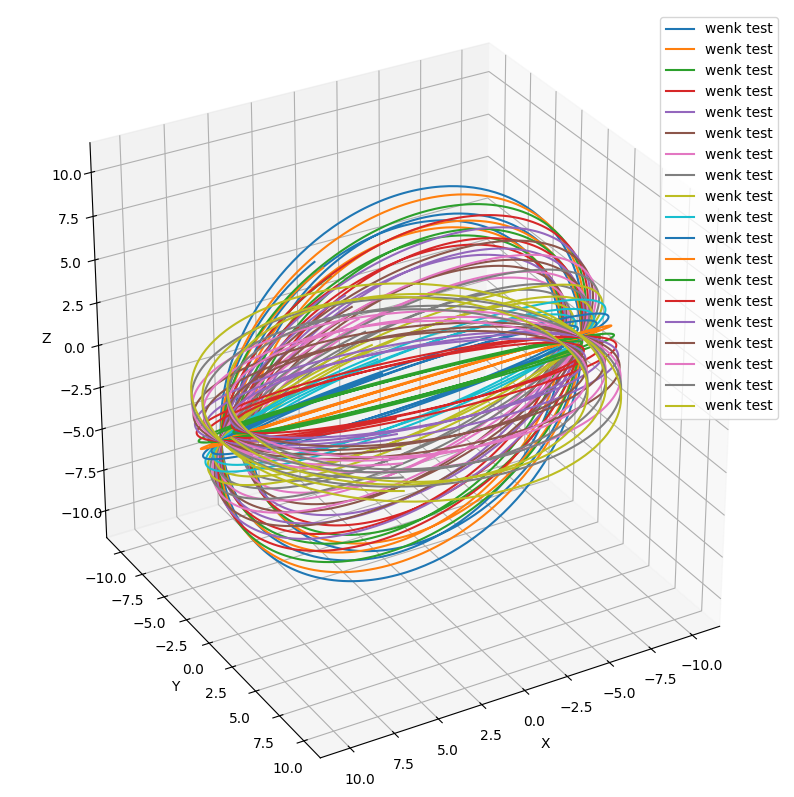

In [120]:
op.orthoplots(tests, azi=60)#, ele=0)

In [ ]:
a=0.99*0
state, cons = mm.set_u_kerr(a, params=[10, 0.0, np.pi/2])#, pos=[0, 10, np.pi/2, 0*np.pi/4])

metric, chris = mm.kerr(state, a)
stuff = np.matmul(metric, state[4:])
fmom = np.matmul(metric, state[4:])
L2 = fmom[2]**2 + (fmom[3]**2)/(np.sin(state[[2]])**2)
print(L2, np.sqrt(L2), *cons, np.sqrt(cons[1]**2 + cons[2]))
print(np.sqrt(L2) == np.sqrt(cons[1]**2 + cons[2]))
def gurf(state, a=0):
    r = np.array([np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.cos(state[3]),
                  np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.sin(state[3]),
                  state[1] * np.cos(state[2]) ])
    p = np.array([(state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.cos(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.cos(state[3]) - np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.sin(state[3])),
                  (state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.cos(state[3])),
                  state[5]*np.cos(state[2]) - state[1]*state[6]*np.sin(state[2])])
    newL = np.cross(r, p)
    #print(r, p)
    return newL
print("---")
#print(gurf(state))
newL = gurf(state, a)
print(newL, "cart-p maybe")
print(stuff[1:], "4-p")
print(state[5:], "v")
#print(stuff/state[4:])
#print(newL - stuff[1:])
print(newL[-1])
print(stuff[1]*np.cos(state[2]) - state[1]*stuff[2]*np.sin(state[2]))
#print(stuff[2])
print(stuff[1], np.cos(state[2]), "tt", stuff[2], np.sin(state[2]))
#print(L2)
#print(newL, cons[1])
#print(np.linalg.norm(newL)**2)
#print(newL*np.sqrt(L2/np.dot(newL, newL)))
#print(newL*cons[1]/newL[2])
#print(np.linalg.norm(newL*cons[1]/newL[2]))
#print(np.linalg.norm(newL*cons[1]/newL[2])**2)

[103.09278351] [10.15346165] 0.9950392418309466 10.15346165133619 0.0 10.15346165133619
[ True]
---
[-6.21720216e-16 -6.21720216e-16  1.01534617e+01] cart-p maybe
[-1.01394390e-08 -6.21720216e-16  1.01534617e+01] 4-p
[-9.93665027e-09 -6.21720216e-20  1.01534617e-03] v
10.153461651336192
6.217202155725047e-14
-1.0139439049630607e-08 6.123233995736766e-17 tt -6.217202155787133e-16 1.0


In [245]:
a = 0.99
sim = ml.EMRIGenerator(a, 0.0, endflag="rad_orbit > 2", params=[10, 0.1, 0.0001*np.pi/2], bonk=3, label="wenk test", trigger=2, err_target=1e-14, conch=100)
state, cons = sim["raw"][-1], [test["energy"][0], test["phi_momentum"][0], test["carter"][0]]
metric, chris = mm.kerr(state, a)
stuff = np.matmul(metric, state[4:])
fmom = np.matmul(metric, state[4:])
L2 = fmom[2]**2 + (fmom[3]**2)/(np.sin(state[[2]])**2)
print("---")
print(gurf(state))
newL = gurf(state, a)
print(newL, "cart-p maybe")
print(stuff[1:], "4-p")
#print(state[5:], "v")
arf = mm.peters_integrate6_6(sim["raw"], a, 1e-5, 0, 100)
print(arf[1:], "changes")


Normalizing initial state


10002272.361997075it [00:15, 628749.87it/s, Semilat: (9.9-0j), Ecc (0.1+0j)]                               
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MainLoopStreamline.py:949: ComplexWarning: Casting complex values to real discards the imaginary part
  "trackix": np.array([int(num) for num in tracker[:,6]]),


---
[ 3.51317564 -1.29337534  0.18222774]
[ 3.52942021 -1.29938322  0.18401478] cart-p maybe
[-3.03138677e-02 -3.75055478e+00  5.87755386e-04] 4-p
[-1.41566200e-05 -1.51377537e-06  9.85650981e-06] changes


In [2]:
def gurf(state, a=0):
    r = np.array([np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.cos(state[3]),
                  np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.sin(state[3]),
                  state[1] * np.cos(state[2]) ])
    p = np.array([(state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.cos(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.cos(state[3]) - np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.sin(state[3])),
                  (state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.cos(state[3])),
                  state[5]*np.cos(state[2]) - state[1]*state[6]*np.sin(state[2])])
    newL = np.cross(r, p)
    #print(r, p)
    return newL

def bl_conv(cart_state, a):
    st, ct, sp, cp = np.sin(cart_state[2]), np.cos(cart_state[2]), np.sin(cart_state[3]), np.cos(cart_state[3])
    rho = np.array([sp*st, cp*st, ct])
    phi = np.linalg.cross([0,0,1], rho)/np.linalg.norm(np.linalg.cross([0,0,1], rho))
    thet = -np.linalg.cross(rho, phi)/np.linalg.norm(np.linalg.cross(rho, phi))
    #bl_tet = np.array([*cart_state[:4], np.dot(cart_state[5:], rho), np.dot(cart_state[5:], thet), np.dot(cart_state[5:], phi)])
    bl_tet = np.array([*cart_state[:5], *np.linalg.matmul([rho, thet, phi], cart_state[5:])])

    metric, chris = mm.kerr(cart_state, a)
    hold = np.linalg.inv(metric)
    w = hold[0,3]/hold[0,0]
    E_u_d = np.array([[np.sqrt(-hold[0,0]),   0,                  0,                  0],
                      [0,                     np.sqrt(hold[1,1]), 0,                  0],
                      [0,                     0,                  np.sqrt(hold[2,2]), 0],
                      [np.sqrt(-w*hold[3,0]), 0,                  0,                  1/np.sqrt(metric[3,3])]])
    #print(E_u_d)
    #print(bl_tet[4:])
    #print(np.linalg.matmul(E_u_d, bl_tet[4:]))
    return np.array([*cart_state[:4], *np.linalg.matmul(E_u_d, bl_tet[4:])])

def tet_conv(state, a):
    metric, chris = mm.kerr(state, a)
    hold = np.linalg.inv(metric)
    w = hold[0,3]/hold[0,0]
    E_u_d = np.array([[np.sqrt(-hold[0,0]),   0,                  0,                  0],
                      [0,                     np.sqrt(hold[1,1]), 0,                  0],
                      [0,                     0,                  np.sqrt(hold[2,2]), 0],
                      [np.sqrt(-w*hold[3,0]), 0,                  0,                  1/np.sqrt(metric[3,3])]])
    E_d_u = np.linalg.inv(E_u_d)
    tet_vec = np.linalg.matmul(E_d_u, state[4:])
    #print(np.linalg.norm(tet_vec[1:]), "org norm")
    #print(tet_vec[0])
    #print(1/np.sqrt(1 - np.linalg.norm(tet_vec[1:]/tet_vec[0])**2))
    st, ct, sp, cp = np.sin(state[2]), np.cos(state[2]), np.sin(state[3]), np.cos(state[3])
    rho = np.array([sp*st, cp*st, ct])
    phi = np.linalg.cross([0,0,1], rho)/np.linalg.norm(np.linalg.cross([0,0,1], rho))
    thet = -np.linalg.cross(rho, phi)/np.linalg.norm(np.linalg.cross(rho, phi))
    A_inv = np.linalg.inv([rho, thet, phi])
    cart_tet = np.array([*state[:4], tet_vec[0], *np.linalg.matmul(A_inv, tet_vec[1:])])
    #print(np.linalg.norm(cart_tet[5:]), "new norm")
    #print(cart_tet[4])
    #print(1/np.sqrt(1 - np.linalg.norm(cart_tet[5:]/cart_tet[4])**2))
    return cart_tet

def gurf2(state, a=0):
    r = np.array([np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.cos(state[3]),
                  np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * np.sin(state[3]),
                  state[1] * np.cos(state[2]) ])
    p = np.array([(state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.cos(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.cos(state[3]) - np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.sin(state[3])),
                  (state[5]*state[1]/(np.sqrt(state[1]**2 + a**2)) * np.sin(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * state[6]*np.cos(state[2]) * np.sin(state[3]) + np.sqrt(state[1]**2 + a**2) * np.sin(state[2]) * state[7] * np.cos(state[3])),
                  state[5]*np.cos(state[2]) - state[1]*state[6]*np.sin(state[2])])
    newL = np.cross(r, p)
    metric, chris = mm.kerr(state, a)
    stuff = np.matmul(metric, state[4:])
    #print(r, p)
    return np.array([-stuff[0], *newL])

a = 0.99
state, cons = mm.set_u_kerr(a, params=[10, 0.0, np.pi/2])
cons1 = gurf2(state, a)
cartstate = tet_conv(state, a)
#oof = tet_conv2(state, a)

print("----")

g1 = cartstate[4]
eps = np.array([ 0, 0, 0])
vec1 = cartstate[5:]/g1 + eps
b1= np.linalg.norm(vec1)
new_vec1 = np.array([1/np.sqrt(1 - b1**2), *(vec1/np.sqrt(1 - b1**2))])
state1 = bl_conv(np.array([*cartstate[:4], *new_vec1]), a)
print(g1)
print(vec1)
print(np.linalg.norm(vec1))
print(1/np.sqrt(1 - np.linalg.norm(vec1)**2))


print(cartstate[4:])
print(np.array([*cartstate[:4], *new_vec1])[4:])
print(cartstate[4:] - np.array([*cartstate[:4], *new_vec1])[4:])
print("----")
print(state[4:])
print(state1[4:])
print(state[4:] - state1[4:])
print("----")
print(cons1)
print(gurf2(state1, a))
print(cons1 - gurf2(state1, a))
#print(cons1)
#print(cons2)
#print(cons2 - cons1)
#print(cons1 - cons_test)

At = []
for i in range(3):
    eps = np.zeros(3)
    eps[i] = 1e-7
    vec = cartstate[5:]/cartstate[4] + eps
    b = np.linalg.norm(vec)
    new_vec = np.array([1/np.sqrt(1 - b**2), *(vec/np.sqrt(1 - b**2))])
    #print(new_vec)
    new_cons1 = gurf2(bl_conv(np.array([*cartstate[:4], *new_vec]), a), a)
    At.append(new_cons1 - cons1)
At, A = np.array(At), np.array(At).T
print(A)





----
1.0565396248705115
[-3.22744769e-01 -5.77982412e-09  1.99558215e-17]
0.3227447694421813
1.0565396248705117
[ 1.05653962e+00 -3.40992638e-01 -6.10661321e-09  2.10841161e-17]
[ 1.05653962e+00 -3.40992638e-01 -6.10661321e-09  2.10841161e-17]
[-2.22044605e-16  5.55111512e-17  8.27180613e-25  0.00000000e+00]
----
[ 1.18096124e+00 -5.49527672e-09 -2.10841165e-18  3.62116130e-02]
[ 1.18096124e+00 -5.49527672e-09 -2.10841165e-18  3.62116130e-02]
[-2.22044605e-16  0.00000000e+00  0.00000000e+00  0.00000000e+00]
----
[ 9.51938895e-01 -2.22816129e-16 -2.11871873e-16  3.65665230e+00]
[ 9.51938895e-01 -2.22816129e-16 -2.11871873e-16  3.65665230e+00]
[-2.22044605e-16  0.00000000e+00  0.00000000e+00  0.00000000e+00]
[[-3.63754618e-08  4.77395901e-15  5.44009282e-15]
 [ 7.26591356e-23 -1.08468374e-30 -1.23259516e-30]
 [ 7.63315366e-24  6.44428374e-23 -1.06170457e-06]
 [-1.19241456e-06  1.82076576e-14  2.04281037e-14]]


Normalizing initial state


10000322.12312622it [00:01, 9884837.69it/s, Semilat: (3+0j), Ecc (0.01+0j)]                               


[ 1.74940799e+02  3.00028788e+00  1.57079633e+00  2.82778052e+01
  1.92848441e+00 -4.15655023e-03  2.90612826e-16  3.11697688e-01] initial state
[ 8.48652233e-01  1.90480036e-16 -2.75418777e-15  3.11131252e+00] starting psuedocons
[1.74940799e+02 3.00028788e+00 1.57079633e+00 2.82778052e+01
 1.93055709e+00 4.65537762e-02 2.91557427e-16 3.11368688e-01] end state
[ 8.49126139e-01  1.90316814e-16 -2.76217911e-15  3.10802850e+00] end psuedocons
[ 2.07267558e-03  5.07103264e-02  9.44600837e-19 -3.28999965e-04]
[ 4.73905304e-04 -1.63221581e-19 -7.99134009e-18 -3.28402086e-03]
[-1.99139103e-03  2.29752089e-21  1.88730964e-20 -1.23168525e-02]
[-2.46529633e-03  1.65519101e-19  8.01021318e-18 -9.03283161e-03]
---
[8.48652233e-01 2.04227866e+00 1.33226763e-15]
[8.49126139e-01 2.03741186e+00 6.66133815e-16]
[ 4.73905304e-04 -4.86680344e-03 -6.66133815e-16]
Normalizing initial state


10006681.60990809it [00:02, 4233501.03it/s, Semilat: (2.973+0j), Ecc (0.112+0j)]                               


Normalizing initial state


 46%|████▋     | 4631301.332691938/10000000 [00:00<00:01, 5320903.64it/s, Semilat: (2.938+0j), Ecc (0.098+0j)] C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\integrate\_quadpack_py.py:606: ComplexWarning: Casting complex values to real discards the imaginary part
  return _quadpack._qagse(func,a,b,args,full_output,epsabs,epsrel,limit)
10008227.103419302it [00:02, 4735184.93it/s, Semilat: (2.938+0j), Ecc (0.098+0j)]                             


Normalizing initial state


10005470.862769198it [00:01, 5266214.79it/s, Semilat: (2.902+0j), Ecc (0.082+0j)]                              


Normalizing initial state


10006788.30882624it [00:01, 5780821.01it/s, Semilat: (2.866+0j), Ecc (0.065+0j)]                               


Normalizing initial state


10006913.115814194it [00:01, 6484050.30it/s, Semilat: (2.831+0j), Ecc (0.054+0j)]                              


Normalizing initial state


10002282.894401452it [00:04, 2050234.36it/s, Semilat: (2.953+0j), Ecc (0.526+0j)]                              


Normalizing initial state


 45%|████▌     | 4544945.9465993615/10000000 [00:02<00:03, 1777570.21it/s, Semilat: (2.926+0j), Ecc (0.508+0j)]c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MainLoopStreamline.py:781: RuntimeWarning: invalid value encountered in sqrt
  inc = np.arccos(np.sqrt(z2))
10003694.996396115it [00:04, 2157329.50it/s, Semilat: (2.926+0j), Ecc (0.508+0j)]                              


Normalizing initial state


10000226.782118559it [00:04, 2282725.69it/s, Semilat: (2.898+0j), Ecc (0.49+0j)]                              


Normalizing initial state


10003485.844507733it [00:04, 2209910.24it/s, Semilat: (2.87+0j), Ecc (0.473+0j)]                              


Normalizing initial state


10003750.283528158it [00:04, 2192169.10it/s, Semilat: (2.841+0j), Ecc (0.454+0j)]                              


Normalizing initial state


10001530.625413751it [00:04, 2151585.48it/s, Semilat: (2.812+0j), Ecc (0.436+0j)]                              


Normalizing initial state


10000737.741735365it [00:04, 2442849.49it/s, Semilat: (2.782+0j), Ecc (0.417+0j)]                              


Normalizing initial state


10002496.588445328it [00:04, 2389496.41it/s, Semilat: (2.751+0j), Ecc (0.398+0j)]                              


Normalizing initial state


10000522.301522395it [00:03, 2598495.14it/s, Semilat: (2.72+0j), Ecc (0.378+0j)]                              
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MainLoopStreamline.py:302: RuntimeWarning: invalid value encountered in sqrt
  inc = np.arccos(np.sqrt(z2))


Normalizing initial state


10002586.19065669it [00:03, 2732388.26it/s, Semilat: (2.688+0j), Ecc (0.358+0j)]                               


Normalizing initial state


10002903.572117047it [00:03, 2626476.07it/s, Semilat: (2.655+0j), Ecc (0.337+0j)]                              


Normalizing initial state


10000387.707566481it [00:03, 2810075.58it/s, Semilat: (2.621+0j), Ecc (0.316+0j)]                              


Normalizing initial state


10002810.617440427it [00:03, 2835638.71it/s, Semilat: (2.587+0j), Ecc (0.294+0j)]                              


Normalizing initial state


10004406.717525346it [00:03, 2782604.70it/s, Semilat: (2.552+0j), Ecc (0.271+0j)]                              


Normalizing initial state


10005379.763157178it [00:03, 3004792.66it/s, Semilat: (2.516+0j), Ecc (0.247+0j)]                              


Normalizing initial state


10000138.930328827it [00:03, 3263530.07it/s, Semilat: (2.479-0j), Ecc (0.223+0j)]                              


Normalizing initial state


10003969.566120772it [00:02, 3465617.17it/s, Semilat: (2.443+0j), Ecc (0.198+0j)]                              


Normalizing initial state


10006916.420549566it [00:02, 3380422.80it/s, Semilat: (2.408+0j), Ecc (0.181+0j)]                              


Normalizing initial state


10003154.767525332it [00:04, 2301701.42it/s, Semilat: (2.463+0j), Ecc (0.414+0j)]                              


Normalizing initial state


10000217.900369555it [00:04, 2411916.36it/s, Semilat: (2.435+0j), Ecc (0.381+0j)]                              


Normalizing initial state


10002699.452204315it [00:03, 2681748.50it/s, Semilat: (2.405+0j), Ecc (0.348+0j)]                              


Normalizing initial state


10001554.288291866it [00:03, 2748431.44it/s, Semilat: (2.374+0j), Ecc (0.315+0j)]                              


Normalizing initial state


10002569.596222432it [00:03, 2856152.25it/s, Semilat: (2.341+0j), Ecc (0.281+0j)]                              


Normalizing initial state


10005085.564796977it [00:03, 2941217.48it/s, Semilat: (2.308+0j), Ecc (0.247+0j)]                              


Normalizing initial state


10007097.46060331it [00:03, 3113532.01it/s, Semilat: (2.277+0j), Ecc (0.222+0j)]                               


Normalizing initial state


10000949.363306087it [00:04, 2365956.08it/s, Semilat: (2.335+0j), Ecc (0.424+0j)]                              


Normalizing initial state


10003470.057050865it [00:04, 2285150.68it/s, Semilat: (2.312+0j), Ecc (0.381+0j)]                              


Normalizing initial state


10000992.649257232it [00:04, 2422550.80it/s, Semilat: (2.286+0j), Ecc (0.339+0j)]                              


Normalizing initial state


10004808.162420398it [00:03, 2686100.63it/s, Semilat: (2.258+0j), Ecc (0.297+0j)]                              


Normalizing initial state


10002175.184894802it [00:03, 2865165.53it/s, Semilat: (2.229+0j), Ecc (0.258+0j)]                              


Normalizing initial state


10002742.738190938it [00:03, 2940717.76it/s, Semilat: (2.206+0j), Ecc (0.242+0j)]                              


Normalizing initial state


10002381.151176296it [00:05, 1911311.49it/s, Semilat: (2.323+0j), Ecc (0.528+0j)]                              


Normalizing initial state


10000103.222597005it [00:04, 2069799.11it/s, Semilat: (2.315+0j), Ecc (0.477+0j)]                              


Normalizing initial state


10002784.634564243it [00:04, 2239846.27it/s, Semilat: (2.3+0j), Ecc (0.428+0j)]                              


Normalizing initial state


10002273.919722466it [00:04, 2284406.40it/s, Semilat: (2.28+0j), Ecc (0.382+0j)]                              


Normalizing initial state


10002937.385047488it [00:03, 2548336.14it/s, Semilat: (2.257+0j), Ecc (0.336+0j)]                              


Normalizing initial state


10001770.408882398it [00:03, 2632369.91it/s, Semilat: (2.231+0j), Ecc (0.291+0j)]                              


Normalizing initial state


10000093.058961073it [00:03, 2749022.65it/s, Semilat: (2.204+0j), Ecc (0.251+0j)]                              


Normalizing initial state


10004011.69872281it [00:03, 2641574.38it/s, Semilat: (2.192+0j), Ecc (0.264+0j)]                               


Normalizing initial state


10004734.611552661it [00:03, 2849494.50it/s, Semilat: (2.175+0j), Ecc (0.251+0j)]                              


Normalizing initial state


10000035.33381678it [00:04, 2397442.71it/s, Semilat: (2.213+0j), Ecc (0.379+0j)]                               


Normalizing initial state


10000325.556329293it [00:04, 2444423.78it/s, Semilat: (2.194+0j), Ecc (0.326+0j)]                              


Normalizing initial state


10002100.588562803it [00:03, 2687319.05it/s, Semilat: (2.172+0j), Ecc (0.277+0j)]                              


Normalizing initial state


10002500.372472538it [00:03, 2747576.95it/s, Semilat: (2.154+0j), Ecc (0.253-0j)]                              


Normalizing initial state


 67%|██████▋   | 6741949.792934563/10000000 [00:05<00:02, 1172118.51it/s, Semilat: (2.498+0j), Ecc (0.852+0j)] 



Ending program


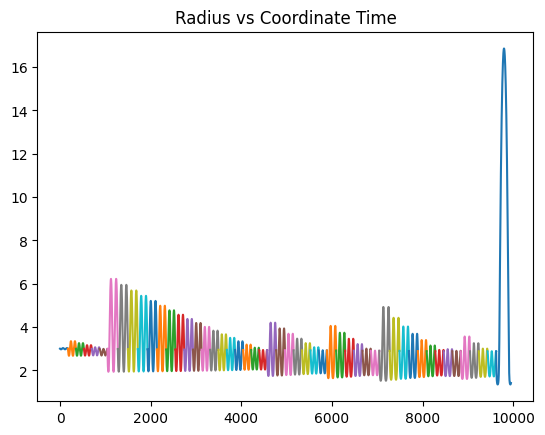

In [8]:
a = 0.99
sim = ml.EMRIGenerator(a, 0.0, endflag="rad_orbit > 2", params=[3/(1 - 0.01**2), 0.01, np.pi/2], bonk=3, label="wenk test", trigger=2, err_target=1e-14, conch=100)
state = sim["raw"][-1]
print(state, "initial state")
cons1 = gurf2(state, a)
print(cons1, "starting psuedocons")
arf = mm.peters_integrate6_6(sim["raw"], a, 1e-3, 0, 100)

def lsboogaloo(state, a, dcons):
    cons1 = gurf2(state, a)
    cartstate = tet_conv(state, a)
    At = []
    for i in range(3):
        eps = np.zeros(3)
        eps[i] = 1e-7
        vec = cartstate[5:]/cartstate[4] + eps
        b = np.linalg.norm(vec)
        new_vec = np.array([1/np.sqrt(1 - b**2), *(vec/np.sqrt(1 - b**2))])
        #print(new_vec)
        new_cons1 = gurf2(bl_conv(np.array([*cartstate[:4], *new_vec]), a), a)
        At.append((new_cons1 - cons1)/1e-7)
    At, A = np.array(At), np.array(At).T
    dv = np.matmul(np.linalg.inv(np.matmul(At, A)), np.matmul(At, arf))
    vec = cartstate[5:]/cartstate[4] + dv
    b = np.linalg.norm(vec)
    new_vec = np.array([1/np.sqrt(1 - b**2), *(vec/np.sqrt(1 - b**2))])
    state2 = bl_conv(np.array([*cartstate[:4], *new_vec]), a)
    cons2 = gurf2(state2, a)
    return state2, cons2

state2, cons2 = lsboogaloo(state, a, arf)
print(state2, "end state")
print(cons2, "end psuedocons")
print(state2[4:] - state[4:])
print(cons2 - cons1)
print(arf)
print(arf - (cons2 - cons1) )
arf2 = arf - (cons2 - cons1)
print("---")
print(ml.getCons(state, a))
print(ml.getCons(state2, a))
print(ml.getCons(state2, a) - ml.getCons(state, a))

sims = [sim]
while sims[-1]["plunge"] == False and sims[-1]["stop"] == False:
    sim = ml.EMRIGenerator(a, 0.0, endflag="rad_orbit > 2", cons = list(ml.getCons(state2, a)), pos=state2[:4], bonk=3, label="wenk test", trigger=2, err_target=1e-14, conch=100)
    state = sim["raw"][-1]
    cons1 = gurf2(state, a)
    arf = mm.peters_integrate6_6(sim["raw"], a, 1e-3, 0, 100)
    state2, cons2 = lsboogaloo(state, a, arf)
    sims.append(sim)
op.plotvalue3(sims, "time", "radius", linefit=False)

Normalizing initial state


10001644.683026258it [04:24, 37798.01it/s, Semilat: (2.442+0.052j), Ecc (0.143-0.018j)]                              
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MainLoopStreamline.py:951: ComplexWarning: Casting complex values to real discards the imaginary part
  "trackix": np.array([int(num) for num in tracker[:,6]]),


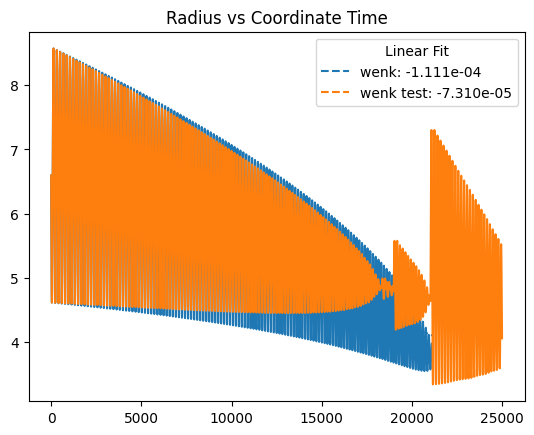

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


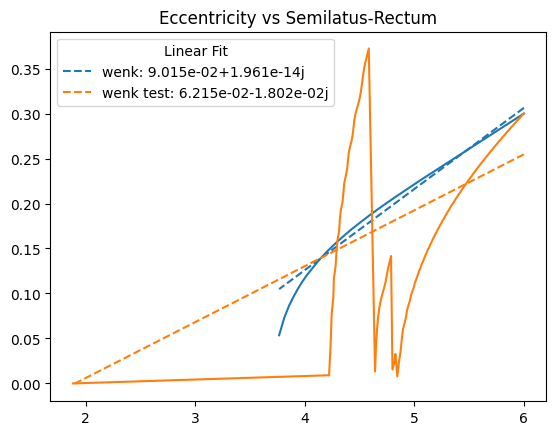

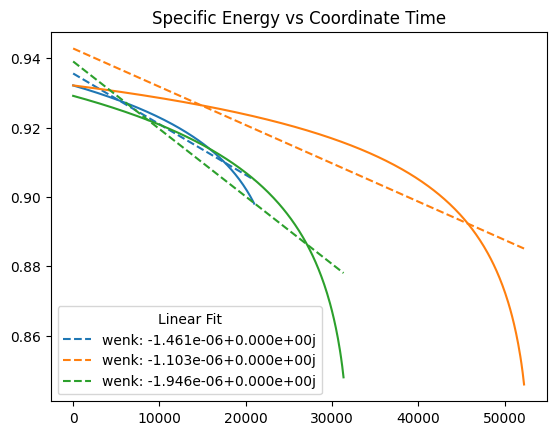

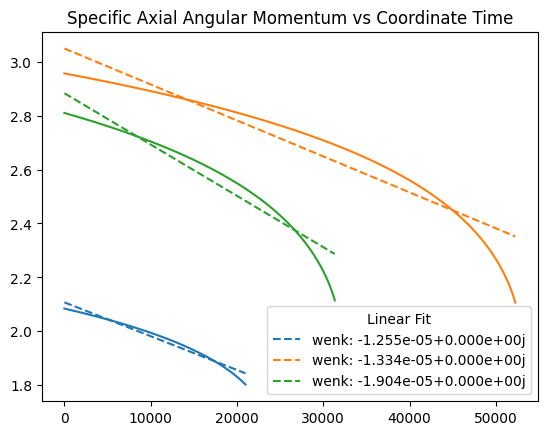

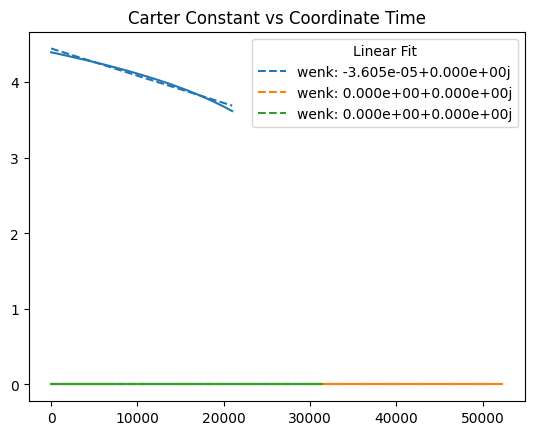

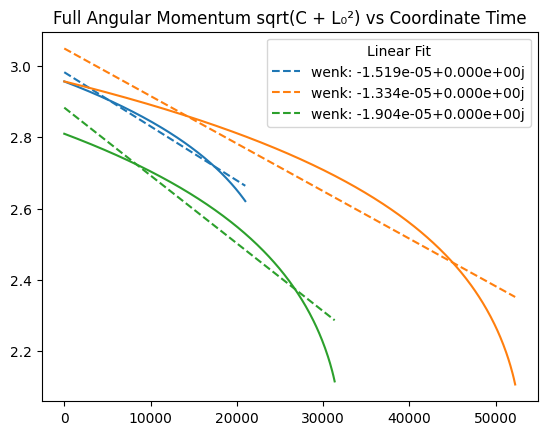

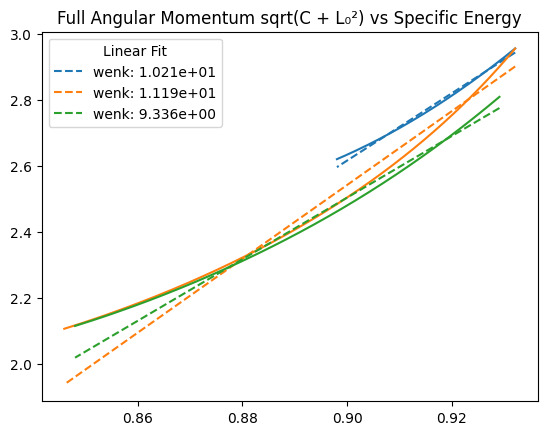

In [11]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import pickle 
a = 0.9
#sim1 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[6/(1 - 0.3**2), 0.3, 0.5*np.pi/2], bonk=3, label="wenk", trigger=2, err_target=1e-14, conch=100)
#sim2 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[6/(1 - 0.3**2), 0.3, 0.5*np.pi/2], bonk=3, label="wenk test", trigger=2, err_target=1e-14, conch=16)
#sim3 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", cons = [sim1["energy"][0], np.sqrt(sim1["phi_momentum"][0]**2 + sim1["carter"][0]), 0], bonk=3, label="wenk", trigger=2, err_target=1e-14, conch=100)
sim4 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[6/(1 - 0.3**2), 0.3, np.pi/2], bonk=3, label="wenk", trigger=2, err_target=1e-14, conch=100)
with open('lstestcontrol.pkl', 'rb') as f:
    sim1 = pickle.load(f)
op.plotvalue3([sim1, sim2], "time", "radius", end=25000)
op.plotvalue3([sim1, sim2], "semilat", "ecc")
op.plotvalue3([sim1, sim3, sim4], "tracktime", "energy")
op.plotvalue3([sim1, sim3, sim4], "tracktime", "L_z")
op.plotvalue3([sim1, sim3, sim4], "tracktime", "carter")
op.plotvalue3([sim1, sim3, sim4], "tracktime", "approx_L")
op.plotvalue3([sim1, sim3, sim4], "energy", "approx_L")


In [2]:
#EMRIcop = EMRICodeSims.copy()
import pickle 

with open('lstestcontrol.pkl', 'wb') as f:
    pickle.dump(sim1, f)

In [7]:
B = np.array([[0.09694431, 0.10936103, 0.05527609],
 [0.10936103, 0.1233681,  0.06235591],
 [0.05527609, 0.06235591, 0.03151754]])
B[0]/B[2]

array([1.75381996, 1.75381981, 1.75381994])

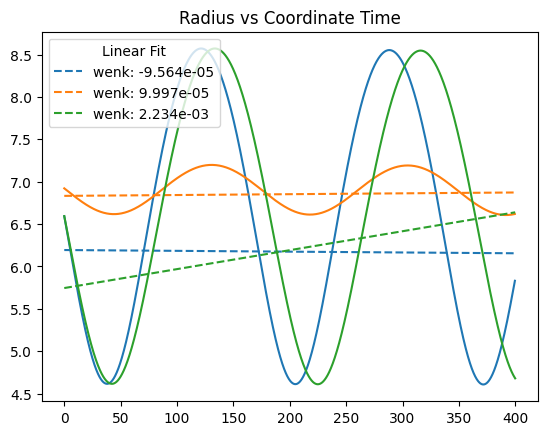

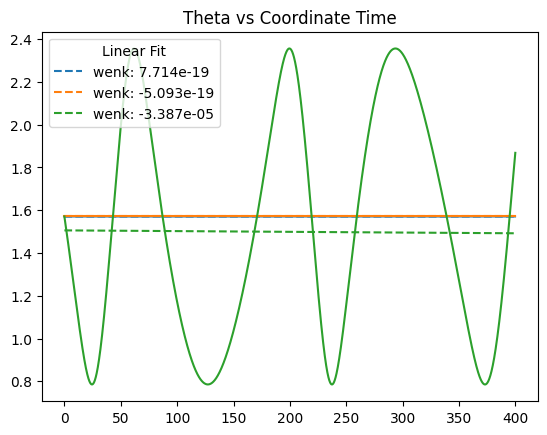

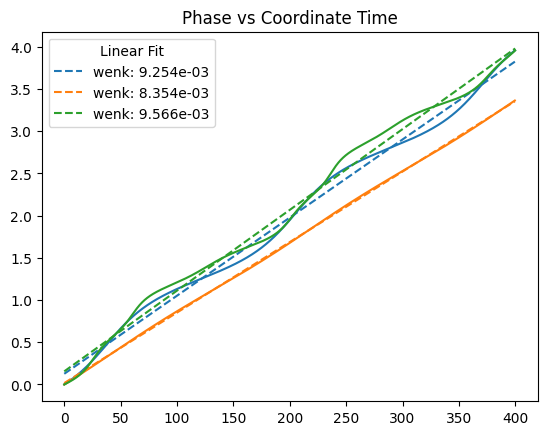

In [19]:
op.plotvalue3([sim1, sim3, sim4][::-1], "time", "radius", end=400)
op.plotvalue3([sim1, sim3, sim4][::-1], "time", "theta", end=400)
op.plotvalue3([sim1, sim3, sim4][::-1], "time", "phase", end=400)

In [15]:
reverse([1,2,3])

NameError: name 'reverse' is not defined

C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\camcinto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


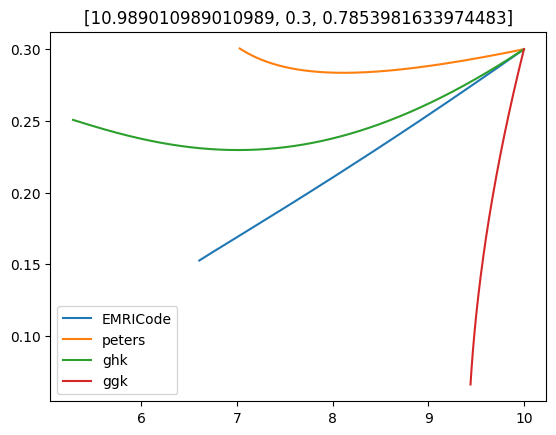

(9.999999999999352+0j)
(8.999995926351831+0j)
(8.099993858654033+0j)
(7.28998862561739+0j)
(9.99999999999968+0j)
(8.99999983322624+0j)
(8.099997606146523+0j)
(7.289996331206983+0j)
(6.560996115048808+0j)
(5.904896376873041+0j)
(5.314406507964235+0j)
(9.99999999999968+0j)
[0.+0.j        0.+0.j        0.+0.j        0.+0.j        0.+0.j
 0.+0.0008415j]


ZeroDivisionError: division by zero

In [229]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import pickle 
a = 0.9
#sim1 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[10/(1 - 0.3**2), 0.3, 0.5*np.pi/2], bonk=3, label="wenk 4", trigger=2, err_target=1e-14, conch=100)
#sim2 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[10/(1 - 0.3**2), 0.3, 1.0*np.pi/2], bonk=3, label="wenk 5", trigger=2, err_target=1e-14, conch=100)
#sim3 = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[10/(1 - 0.3**2), 0.3, 0.01*np.pi/2], bonk=3, label="wenk 6", trigger=2, err_target=1e-14, conch=100)

lst = [sim1, sim2, sim3]
'''op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "semilat", "ecc", derv=0)
op.plotvalue3(lst, "tracktime", "energy", derv=0)
op.plotvalue3(lst, "tracktime", "L_z", derv=0)
op.plotvalue3(lst, "tracktime", "carter", derv=0)
op.plotvalue3(lst, "tracktime", "approx_L", derv=0)
op.plotvalue3(lst, "energy", "approx_L", derv=0)
#op.plotvalue3(lst, "time", "radius")
op.plotvalue3(lst, "semilat", "ecc", derv=1)
op.plotvalue3(lst, "tracktime", "energy", derv=1)
op.plotvalue3(lst, "tracktime", "L_z", derv=1)
op.plotvalue3(lst, "tracktime", "carter", derv=1)
op.plotvalue3(lst, "tracktime", "approx_L", derv=1)
op.plotvalue3(lst, "energy", "approx_L", derv=1)
op.plotvalue3(lst, "semilat", "ecc", derv=2)
op.plotvalue3(lst, "tracktime", "energy", derv=2)
op.plotvalue3(lst, "tracktime", "L_z", derv=2)
op.plotvalue3(lst, "tracktime", "carter", derv=2)
op.plotvalue3(lst, "tracktime", "approx_L", derv=2)
op.plotvalue3(lst, "energy", "approx_L", derv=2)'''

def peters_test(E, L, C, q):
    turns, flats, zs = mm.root_getter(E, L, C, 0)
    r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
    b = (64/5)*q*(1+q)
    dt = (r0**4/(4*b))/100
    vals = [[0, E, L, C, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))]]
    print(p)
    oldp = p
    while vals[-1][4] > 6 and np.isreal(vals[-1][4]):
        E_1 = vals[-1][1] - (32/5) * (q**2)*(1 + q)*(1 + (73/24)*(e**2) + (37/96)*(e**4))/((r0**5)*((1 - e**2)**(7/2)))*dt
        fullL = np.sqrt(vals[-1][2]**2 + vals[-1][3])
        fullL_1 = fullL - (32/5) * (q**2)*((1 + q)**0.5)*(1 + (7/8)*(e**2))/((r0**3.5)*((1 - e**2)**2))*dt
        L_1 = fullL_1*vals[-1][2]/np.sqrt(vals[-1][2]**2 + vals[-1][3])
        C_1 = (fullL_1*np.sqrt(vals[-1][3]/(vals[-1][2]**2 + vals[-1][3])))**2
        turns, flats, zs = mm.root_getter(E_1, L_1, C_1, 0)
        r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
        vals.append([vals[-1][0] + dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])
        dt = (r0**4/(4*b))/100
        if p < (9/10)*oldp:
            print(p)
            oldp = p
        elif p > oldp:
            print(p, "borke")
            break
    return np.array(vals)

def GHK(E, L, C, a, q):
    turns, flats, zs = mm.root_getter(E, L, C, a)
    r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
    cosi = L/np.sqrt(C + L**2)
    b = (64/5)*q*(1+q)
    dt = (r0**4/(4*b))/100
    vals = [[0, E, L, C, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))]]
    print(p)
    oldp = p
    f1 = lambda x: 1 + (73/24)*(x**2) + (37/96)*(x**4)
    f2 = lambda x: 73/12 + (823/24)*(x**2) + (949/32)*(x**4) + (491/192)*(x**6)
    f3 = lambda x: 1 + (7/8)*(x**2)
    f4 = lambda x: 61/24 + (63/8)*(x**2) + (95/64)*(x**4)
    f5 = lambda x: 61/8 + (91/4)*(x**2) + (461/64)*(x**4)
    #f6 = lambda x: 97/12 + (37/2)*(x**2) + (211/32)*(x**4)
    while vals[-1][4] > 6 and np.isreal(vals[-1][4]):
        dEdt = -(32/5)*(q**2)*(p**(-5))*((1 - e**2)**(1.5))*(f1(e) - a*(p**(-1.5))*cosi*f2(e))
        dLdt = -(32/5)*(q**2)*(p**(-3.5))*((1 - e**2)**(1.5))*(cosi*f3(e) + a*(p**(-1.5))*(f4(e) - (cosi**2)*f5(e)))
        #dQdt = -(64/5)*(q**3)*(p**(-3))*((1 - e**2)**(1.5))*(f3(e) - a*(p**(-1.5))*cosi*f6(e))
        dCdt = 2*(vals[-1][3]/vals[-1][2])*dLdt
        E_1, L_1 = vals[-1][1] + dEdt*dt, vals[-1][2] + dLdt*dt
        #C_1 = vals[-1][3] + dQdt*dt - 2*(a*vals[-1][1] - vals[-1][2])*(a*dEdt - dLdt)*dt
        C_1 = vals[-1][3] + dCdt*dt
        turns, flats, zs = mm.root_getter(E_1, L_1, C_1, a)
        r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
        cosi = L/np.sqrt(C_1 + L_1**2)
        b = (64/5)*q*(1+q)
        vals.append([vals[-1][0] + dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])
        dt = (r0**4/(4*b))/100
        if p < (9/10)*oldp:
                print(p)
                oldp = p
    return np.array(vals)

def gair_glamp(E, L, C, a, q):
    turns, flats, zs = mm.root_getter(E, L, C, a)
    r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
    cosi = L/np.sqrt(C + L**2)
    b = (64/5)*q*(1+q)
    dt = (r0**4/(4*b))/100
    vals = [[0, E, L, C, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))]]
    print(p)
    oldp = p
    f1 = lambda x: 1 + (73/24)*(x**2) + (37/96)*(x**4)
    f2 = lambda x: 73/12 + (823/24)*(x**2) + (949/32)*(x**4) + (491/192)*(x**6)
    f3 = lambda x: 1 + (7/8)*(x**2)
    f4 = lambda x: 61/24 + (63/8)*(x**2) + (95/64)*(x**4)
    f5 = lambda x: 61/8 + (91/4)*(x**2) + (461/64)*(x**4)
    f6 = lambda x: 85/8 + (211/8)*(x**2) + (517/64)*(x**4)
    Yfunc = lambda r, a, C: r**5 - C*(r - 3)*(r**3) + (a*C)**2
    circE2 = lambda r, a, C: ((r**3)*(r - 2) - a*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
    circL2 = lambda r, a, C: -(2*a*(r**3) + (r**2 + a**2)*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
    while vals[-1][5] > 6 and np.isreal(vals[-1][5]):
        dEdt_0 = lambda x: -(32/5)*(q**2)*(p**(-5))*((1 - x**2)**(1.5))*(f1(x) - a*(p**(-1.5))*cosi*f2(x))
        dLdt_0 = lambda x: -(32/5)*(q**2)*(p**(-3.5))*((1 - x**2)**(1.5))*(cosi*f3(x) + a*(p**(-1.5))*(f4(x) - (cosi**2)*f5(x)))
        dCdt_0 = lambda x: 2*(vals[-1][3]/vals[-1][2])*dLdt_0(x)
        dCdt = -(64/5)*(q**3)*(p**-3)*((1 - e**2)**1.5)*(1 - cosi**2)*(f3(e) - a*(p**-1.5)*cosi*f6(e))
        def getNs(p, e, i):
            #this is probably wrong for a != 0
            #E_0, L_0, C_0 = mm.schmidtparam3(p, 0, i, a)
            if vals[-1][3] != 0:
                try:
                    Cs = np.linspace(vals[-1][3]*0.5, vals[-1][3]*1.5)
                    Ls = circL2(p, a, Cs)
                    poly = np.polyfit(Cs, np.arccos(Ls/np.sqrt(Ls**2 + Cs)), 5) - np.array([0,0,0,0,0,i])
                    C_0 = np.real(np.roots(poly)[np.where(np.imag(np.roots(poly)) < 1e-14)[0]][-1])
                except:
                    print(poly)
                    C_0 = 1/0
            else:
                C_0 = 0
            E_0, L_0 = circE2(p, a, C_0), circL2(p, a, C_0)
            r_a = p#/(1 - e)
            cosi_0 = np.cos(i)
            N1 = E_0*(r_a**4) + a*a*E_0*r_a*r_a - 2*a*(L_0 - a*E_0)*r_a
            N2 = -L_0*r_a*r_a/(cosi_0**2) + 2*(L_0/(cosi_0**2) - a*E_0)*r_a - a*a*L_0*(1 - cosi_0**2)/(cosi_0**2)
            N3 = (L_0**2)*(r_a*(2 - r_a) - a*a)*np.sqrt(1 - cosi_0**2)/(cosi_0**3)
            N4 = (2*p - p*p)*L_0 - 2*a*E_0*p
            N5 = (2*p - p*p - a*a)/2
            return N1, N2, N3, N4, N5
        N1, N2, N3, N4, N5 = getNs(p, e, np.arccos(cosi))
        dEdt = ((1 - e**2)**(1.5))*(((1 - e**2)**(-1.5))*dEdt_0(e) - dEdt_0(0) - (N4/N1)*dLdt_0(0) - (N5/N1)*dCdt_0(0))
        E_1, L_1 = vals[-1][1] + dEdt*dt, vals[-1][2] + dLdt_0(e)*dt
        #C_1 = vals[-1][3] + dQdt*dt - 2*(a*vals[-1][1] - vals[-1][2])*(a*dEdt - dLdt)*dt
        C_1 = vals[-1][3] + dCdt*dt
        turns, flats, zs = mm.root_getter(E_1, L_1, C_1, a)
        r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
        cosi = L/np.sqrt(C_1 + L_1**2)
        b = (64/5)*q*(1+q)
        vals.append([vals[-1][0] + dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])
        dt = (r0**4/(4*b))/100
        #if len(vals)%10 == 0:
        #    print(len(vals), p)
        if p < (99/100)*oldp:
            print(p)
            oldp = p
        elif p > oldp:
            print("uh")
            break
    return np.array(vals)

for sim in lst:
    if sim["name"] not in stuff.keys():
        simpete = peters_test(*mm.schmidtparam3(sim["p"][0]/(1 - sim["e"][0]**2), sim["e"][0], sim["inc"][0], 0), 1e-4)
        simghk = GHK(sim["energy"][0], sim["phi_momentum"][0], sim["carter"][0], a, 1e-4)
        simggk = gair_glamp(sim["energy"][0], sim["phi_momentum"][0], sim["carter"][0], a, 1e-4)
        stuff[sim1["name"]] = [simpete, simghk, simggk]
    fig1, ax1 = plt.subplots()
    ax1.set_title(sim["inputs"][9])
    ax1.plot(sim["p"], sim["e"], label="EMRICode")
    ax1.plot(simpete[:,5], simpete[:,6], label="peters")
    ax1.plot(simghk[:,5], simghk[:,6], label="ghk")
    ax1.plot(simggk[:,5], simggk[:,6], label="ggk")
    ax1.legend()
    plt.show()

'''ax1.plot(sim1ggk[:,5], sim1ggk[:,6], label="ggk")
sim1pete = peters_test(*mm.schmidtparam3(sim1["p"][0]/(1 - sim1["e"][0]**2), sim1["e"][0], sim1["inc"][0], 0), 1e-3)
sim2pete = peters_test(*mm.schmidtparam3(sim2["p"][0]/(1 - sim2["e"][0]**2), sim2["e"][0], sim2["inc"][0], 0), 1e-3)
sim1ghk = GHK(sim1["energy"][0], sim1["phi_momentum"][0], sim1["carter"][0], a, 1e-3)
sim2ghk = GHK(sim2["energy"][0], sim2["phi_momentum"][0], sim2["carter"][0], a, 1e-3)
sim1ggk = gair_glamp(sim1["energy"][0], sim1["phi_momentum"][0], sim1["carter"][0], a, 1e-3)
sim2ggk = gair_glamp(sim2["energy"][0], sim2["phi_momentum"][0], sim2["carter"][0], a, 1e-3)
print(sim1["p"][0]/(1 - sim1["e"][0]**2), sim1["e"][0], sim1["inc"][0])
print(mm.schmidtparam3(sim1["p"][0]/(1 - sim1["e"][0]**2), sim1["e"][0], sim1["inc"][0], a))

fig1, ax1 = plt.subplots()
fig2, ax2 = plt.subplots()
ax1.set_title(sim1["inputs"][9])
ax1.plot(sim1["p"], sim1["e"], label="EMRICode")
ax1.plot(sim1pete[:,5], sim1pete[:,6], label="peters")
ax1.plot(sim1ghk[:,5], sim1ghk[:,6], label="ghk")
ax1.plot(sim1ggk[:,5], sim1ggk[:,6], label="ggk")
ax2.set_title(sim2["inputs"][9])
ax2.plot(sim2["p"], sim2["e"], label="EMRICode")
ax2.plot(sim2pete[:,5], sim2pete[:,6], label="peters")
ax2.plot(sim2ghk[:,5], sim2ghk[:,6], label="ghk")
ax2.plot(sim2ggk[:,5], sim2ggk[:,6], label="ggk")
ax1.legend()
ax2.legend()'''

In [5]:
import MetricMathStreamline as mm
import MainLoopStreamline as ml
import OrbitPlotter as op
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
print(np.imag(1+2j))
def gair_glamp(E, L, C, a, q):
    if C <= 1e-14:
        C = 0
    if abs(L) <= 1e-14:
        L = 0
    turns, flats, zs = mm.root_getter(E, L, C, a)
    r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
    cosi = L/np.sqrt(C + L**2)
    b = (64/5)*q*(1+q)
    dt = (r0**4/(4*b))/100
    vals = [[0, E, L, C, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))]]
    print(p)
    oldp = p
    f1 = lambda x: 1 + (73/24)*(x**2) + (37/96)*(x**4)
    f2 = lambda x: 73/12 + (823/24)*(x**2) + (949/32)*(x**4) + (491/192)*(x**6)
    f3 = lambda x: 1 + (7/8)*(x**2)
    f4 = lambda x: 61/24 + (63/8)*(x**2) + (95/64)*(x**4)
    f5 = lambda x: 61/8 + (91/4)*(x**2) + (461/64)*(x**4)
    f6 = lambda x: 85/8 + (211/8)*(x**2) + (517/64)*(x**4)
    Yfunc = lambda r, a, C: r**5 - C*(r - 3)*(r**3) + (a*C)**2
    circE2 = lambda r, a, C: ((r**3)*(r - 2) - a*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
    circL2 = lambda r, a, C: -(2*a*(r**3) + (r**2 + a**2)*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
    while vals[-1][5] > 6 and np.isreal(vals[-1][5]):
        dEdt_0 = lambda x: -(32/5)*(q**2)*(p**(-5))*((1 - x**2)**(1.5))*(f1(x) - a*(p**(-1.5))*cosi*f2(x))
        dLdt_0 = lambda x: -(32/5)*(q**2)*(p**(-3.5))*((1 - x**2)**(1.5))*(cosi*f3(x) + a*(p**(-1.5))*(f4(x) - (cosi**2)*f5(x)))
        dCdt_0 = lambda x: 2*(vals[-1][3]/vals[-1][2])*dLdt_0(x)
        dCdt = -(64/5)*(q**3)*(p**-3)*((1 - e**2)**1.5)*(1 - cosi**2)*(f3(e) - a*(p**-1.5)*cosi*f6(e))
        def getNs(p, e, i):
            #this is probably wrong for a != 0
            #E_0, L_0, C_0 = mm.schmidtparam3(p, 0, i, a)
            j, i = i, np.real(i)
            if np.real(vals[-1][3]) >= 1e-14:
                Cs = np.linspace(vals[-1][3]*0.5, vals[-1][3]*1.5)
                Ls = circL2(p, a, Cs)
                try:
                    poly = np.polyfit(Cs, np.arccos(Ls/np.sqrt(Ls**2 + Cs)), 5) - np.array([0,0,0,0,0,i])
                    #print(poly)
                    #print()
                    #print(np.roots(poly))
                    print(j, i, np.round(vals[-1][1:4], 5))
                    #plt.plot(Cs, Ls)
                    #plt.plot(np.linspace(vals[-1][3]*0.1, vals[-1][3]*1.9), np.polyval(np.polyfit(Cs, Ls, 5), np.linspace(vals[-1][3]*0.5, vals[-1][3]*1.5)))
                    C_0 = np.real(np.roots(poly)[np.where(np.imag(np.roots(poly)) < 1e-14)[0]][-1])
                except:
                    poly = np.polyfit(Cs, np.arccos(Ls/np.sqrt(Ls**2 + Cs)), 4) - np.array([0,0,0,0,i])
                    C_0 = np.real(np.roots(poly)[np.where(np.imag(np.roots(poly)) < 1e-14)[0]][-1])
            else:
                C_0 = vals[-1][3]
            E_0, L_0 = circE2(p, a, C_0), circL2(p, a, C_0)
            r_a = p#/(1 - e)
            cosi_0 = np.cos(i)
            N1 = E_0*(r_a**4) + a*a*E_0*r_a*r_a - 2*a*(L_0 - a*E_0)*r_a
            N2 = -L_0*r_a*r_a/(cosi_0**2) + 2*(L_0/(cosi_0**2) - a*E_0)*r_a - a*a*L_0*(1 - cosi_0**2)/(cosi_0**2)
            N3 = (L_0**2)*(r_a*(2 - r_a) - a*a)*np.sqrt(1 - cosi_0**2)/(cosi_0**3)
            N4 = (2*p - p*p)*L_0 - 2*a*E_0*p
            N5 = (2*p - p*p - a*a)/2
            return N1, N2, N3, N4, N5
        N1, N2, N3, N4, N5 = getNs(p, e, np.arccos(cosi))
        dEdt = ((1 - e**2)**(1.5))*(((1 - e**2)**(-1.5))*dEdt_0(e) - dEdt_0(0) - (N4/N1)*dLdt_0(0) - (N5/N1)*dCdt_0(0))
        E_1, L_1 = vals[-1][1] + dEdt*dt, vals[-1][2] + dLdt_0(e)*dt
        #C_1 = vals[-1][3] + dQdt*dt - 2*(a*vals[-1][1] - vals[-1][2])*(a*dEdt - dLdt)*dt
        C_1 = vals[-1][3] + dCdt*dt
        turns, flats, zs = mm.root_getter(E_1, L_1, C_1, a)
        r0, p, e = flats[-1], 2*turns[-1]*turns[-2]/(turns[-1] + turns[-2]), (turns[-1] - turns[-2])/(turns[-1] + turns[-2]) 
        cosi = L/np.sqrt(C_1 + L_1**2)
        b = (64/5)*q*(1+q)
        vals.append([vals[-1][0] + dt, E_1, L_1, C_1, r0, p, e, np.arccos(np.mean(np.abs(zs[1:3])))])
        dt = (r0**4/(4*b))/100
        #if len(vals)%10 == 0:
        #    print(len(vals), p)
        if p < (99/100)*oldp:
            print(p)
            oldp = p
        elif p > oldp:
            print("uh")
            break
    return np.array(vals)
a=0.9
sim = ml.EMRIGenerator(a, 1e-3, endflag="radius < 2", params=[10/(1 - 0.3**2), 0.3, 1.0*np.pi/2], bonk=3, label="wenk 5", trigger=2, err_target=1e-14, conch=100)
simggk = gair_glamp(sim["energy"][0], sim["phi_momentum"][0], sim["carter"][0], a, 1e-4)

2.0
Normalizing initial state


 36%|███▌      | 3608948.8026810964/10000000 [00:00<00:01, 6142543.38it/s, Semilat: (10+0j), Ecc (0.3+0j), Peri: (7.692+0j)] 

 44%|████▍     | 4390007.929949001/10000000 [06:56<08:51, 10547.12it/s, Semilat: (8.75+0j), Ecc (0.242+0j), Peri: (7.043+0j)]    


Ending program


(9.99999999999968+0j)
-0.002304534695040611j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.00238011284733303j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0024533638055223702j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.002524490156566395j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.00259366669579566j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0026610454897307515j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.00272675980959289j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.002790927231452595j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0028536521081894677j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0029150275621013366j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0029751371083015536j 0.0 [0.95636+0.j 3.46881+0.j 0.     +0.j]
-0.0030340559864553067j 0.0 [0.95636+0.j 3.4688 +0.j 0.     +0.j]
-0.0030918522662636747j 0.0 [0.95636+0.j 3.4688 +0.j 0.     +0.j]
-0.003148587768226307j 0.0 [0.95636+0.j 3.4688 +0.j 0.     +0.j]
-0.003204318839208574j 0.0 [0.95636+0.j 3.4688 +0.j 0.     +0.j]

KeyboardInterrupt: 

In [252]:
del stuff["wenk 4"]
del stuff["wenk 5"]
del stuff["wenk 6"]
_, _, gorf = mm.schmidtparam3(10/(1 - 0.3**2), 0.3, 0.5*np.pi/2, a)
Cs = np.linspace(gorf*0.5, gorf*1.5)
Ls = circL2(10/(1 - 0.3**2), a, Cs)
#plt.plot(Cs, Ls)
i = np.pi/4
arps = [np.polyfit(Cs, np.arccos(Ls/np.sqrt(Ls**2 + Cs)), i+2) for i in range(5)]
for arp in arps:
    arp[-1] -= i
print(arp)
#plt.plot(Cs, np.polyval(arp, Cs))
[plt.plot(np.linspace(0, 12), np.polyval(arps[i], np.linspace(0, 12)), label="polyval %s"%(i+2)) for i in range(5)]
plt.plot(np.linspace(0, 12), np.arccos(circL2(10, a, np.linspace(0, 12))/np.sqrt(circL2(10, a, np.linspace(0, 12))**2 + np.linspace(0, 12))), "k--", label="actual" )
plt.plot(Cs, np.arccos(Ls/np.sqrt(Ls**2 + Cs)), "b--", label = "calc")
plt.legend()
plt.hlines([0, np.pi/4], min(Cs), max(Cs))
print(Ls/np.sqrt(Ls**2 + Cs))
for arp in arps:
    print(np.roots(arp)[np.where(np.isreal(np.roots(arp)))[0]])

KeyError: 'wenk 4'

[ 1.08704815 -4.55651577  6.9380753  -0.92204325  0.04639986]
[-7.12631030e-05  2.45695636e-03 -3.76213275e-02  4.54749990e-01
  6.35012856e-01]
[  2.98591511 -14.60661496  37.89000213 -25.31463715   5.76879862]
[(np.float64(0.9450174323438014), np.float64(0.9987596788502238)), (np.float64(2.3926384011238113), np.float64(2.588458178599424)), (np.float64(5.738086275103101), np.float64(6.700425630346126))]


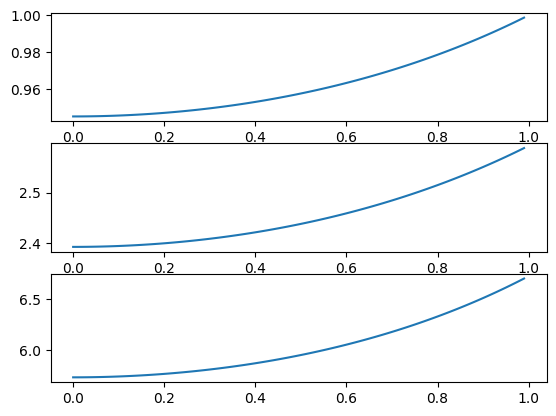

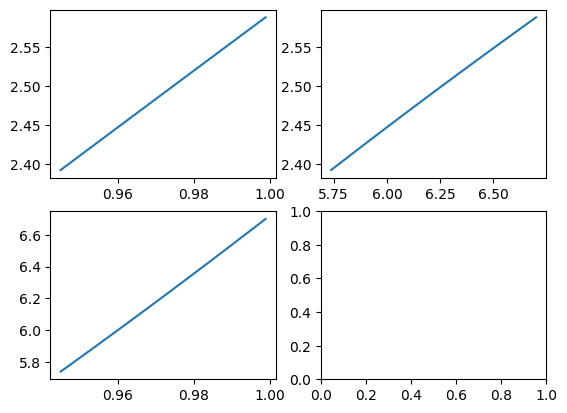

In [30]:
es = np.arange(100)/100
#[mm.schmidtparam3(10/(1 - e**2), e, np.pi/4, 0.5) for e in es]
#print(6/1.9, mm.find_rmb(0.5), mm.find_rms(0.5))
#gurp = np.array([mm.schmidtparam3(8/(1 - e**2), e, np.pi/4, 0.5) for e in es])
fig, ax = plt.subplots(3, 1)
fig1, ax1 = plt.subplots(2, 2)
ax[0].plot(es, gurp[:,0])
ax[1].plot(es, gurp[:,1])
ax[2].plot(es, gurp[:,2])
ax1[0,0].plot(gurp[:,0], gurp[:,1])
ax1[0,1].plot(gurp[:,2], gurp[:,1])
ax1[1,0].plot(gurp[:,0], gurp[:,2])
print(np.polyfit(gurp[:,0], gurp[:,1], 4))
print(np.polyfit(gurp[:,2], gurp[:,1], 4))
print(np.polyfit(gurp[:,0], gurp[:,2], 4))
print([(min(thing), max(thing)) for thing in gurp.transpose()])

C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_17352\1830522042.py:3: RuntimeWarning: invalid value encountered in sqrt
  circE2 = lambda r, a, C: ((r**3)*(r - 2) - a*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_17352\1830522042.py:4: RuntimeWarning: invalid value encountered in sqrt
  circL2 = lambda r, a, C: -(2*a*(r**3) + (r**2 + a**2)*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))


(200, 2) [[0.9835406  3.91437154]
 [0.9836801  3.94724194]]
(82, 2) [ 0.96504579 -0.05783367]


C:\Users\camcinto\AppData\Local\Temp\1\ipykernel_17352\1830522042.py:43: RuntimeWarning: invalid value encountered in arccos
  adds.append([teste[1][0], teste[1][1], np.arccos(np.mean(np.abs(poof[2][1:-1]))), 2*poof[0][-1]*poof[0][-2]/(poof[0][-1] + poof[0][-2])])


np.float64(2.320883041761887)

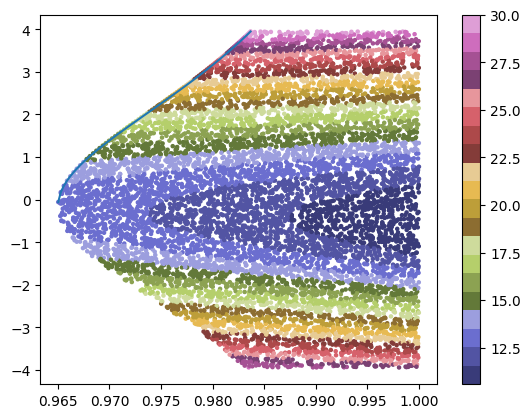

In [151]:
#from scipy.optimize import fmin
Yfunc = lambda r, a, C: r**5 - C*(r - 3)*(r**3) + (a*C)**2
circE2 = lambda r, a, C: ((r**3)*(r - 2) - a*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
circL2 = lambda r, a, C: -(2*a*(r**3) + (r**2 + a**2)*(a*C - (Yfunc(r, a, C))**0.5))/((r**2)*np.sqrt((r**3)*(r - 3) - 2*a*(a*C - (Yfunc(r, a, C))**0.5)))
#rs = np.linspace(4, 10)
#plt.plot(rs, circE2(rs, 0.1, 0))
#print(circE2(np.array([[4,5,6,7],
#                       [4,5,6,7]), 0.1, np.arange(0, 2)))
r, C = np.linspace(2.15, 10, 100), np.linspace(0, 12, 100)
r_mesh, C_mesh = np.meshgrid(r, C)
E, L = circE2(r_mesh, 0.9, C_mesh), circL2(r_mesh, 0.9, C_mesh)
#print(circE2(r, 0.1, C))
#from matplotlib.collections import LineCollection
rs = 26*(np.linspace(0,1000, 200)/1000)**2 + 4
a_real, C_real = 0.9, 17

yarp = np.transpose([circE2(rs, a_real, C_real), circL2(rs, a_real, C_real)])
print(np.shape(yarp), yarp[-2:])
mask = np.where(yarp[:,0] <= 1)[0]
yarp = yarp[mask]
print(np.shape(yarp), yarp[0])

Es, Ls = yarp[:,0], yarp[:,1]

plt.plot(Es, Ls)
#th = plt.scatter(Es, Ls, c=np.sin(Ls/np.sqrt(Ls**2 + 4)))
#plt.colorbar(th)
#xa, xb = ax.get_zlim3d()
#ax.set_zlim3d(xa, 3.8)
adds = []
for i in range(10000):
    num = 0
    while num != 4:
        try:
            Enew, Lnew = np.random.random(2)*np.array([1 - min(Es), 2*max(Ls)]) + np.array([min(Es), -max(Ls)])
            teste = mm.set_u_kerr(a_real, [Enew, Lnew, C_real])
            poof = mm.root_getter(*teste[1], a_real)
            num = len(np.where(np.isreal(poof[0]))[0])
            #print(np.arccos(mm.root_getter(*teste[1], 0.5)[2][1:-1]), np.mean(np.arccos(mm.root_getter(*teste[1], 0.5)[2][1:-1])))
        except:
            num = 0
    #print(teste[0][1])
    adds.append([teste[1][0], teste[1][1], np.arccos(np.mean(np.abs(poof[2][1:-1]))), 2*poof[0][-1]*poof[0][-2]/(poof[0][-1] + poof[0][-2])])
adds = np.array(adds)
def rootwrap(E, L, C, a):
    try:
        return mm.root_getter(E, L, C, a)
    except:
        return np.nan*np.zeros(4), np.nan*np.zeros(3), np.nan*np.zeros(4)
    
poof = [rootwrap(Es[i], Ls[i], C_real, a_real) for i in range(len(Es))]
th = plt.scatter([*Es, *adds[:,0]], [*Ls, *adds[:,1]], s=5, c=[*[2*poof[i][0][-1]*poof[i][0][-2]/(poof[i][0][-1] + poof[i][0][-2]) for i in range(len(Es))], *adds[:,3]], cmap="tab20b")
plt.colorbar(th)
#plt.hlines([1, 1.2], 0.93, 1, "k")
mm.find_rms(a_real)

In [128]:
print(np.nan*0)
for i in range(len(Es)):
    try:
        oop = mm.root_getter(Es[i], Ls[i], C_real, a_real)
    except:
        break#print(Es[i], Ls[i], C_real, a_real, np.isnan(Es[i]))

nan


c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2492: RuntimeWarning: invalid value encountered in scalar divide
  p3 = (c**2 - 3*b*d + 12*a*e)/(3*a*((0.5*p2)**(1/3))) + ((0.5*p2)**(1/3))/(3*a)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2493: RuntimeWarning: invalid value encountered in scalar divide
  p4 = ((b**2)/(4*(a**2)) - (2*c)/(3*a) + p3)**(0.5)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2494: RuntimeWarning: invalid value encountered in scalar divide
  p5 = (b**2)/(2*(a**2)) - (4*c)/(3*a) - p3
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2495: RuntimeWarning: invalid value encountered in scalar divide
  p6 = (-(b**3)/(a**3) + (4*b*c)/(a**2) - 8*d/a)/(4*p4)
c:\Users\camcinto\OneDrive - NASA\Documents\GitHub\Black-Hole-Stuff\MetricMathStreamline.py:2496: RuntimeWarning: invalid value encountere

Text(0.5, 0, 'C')

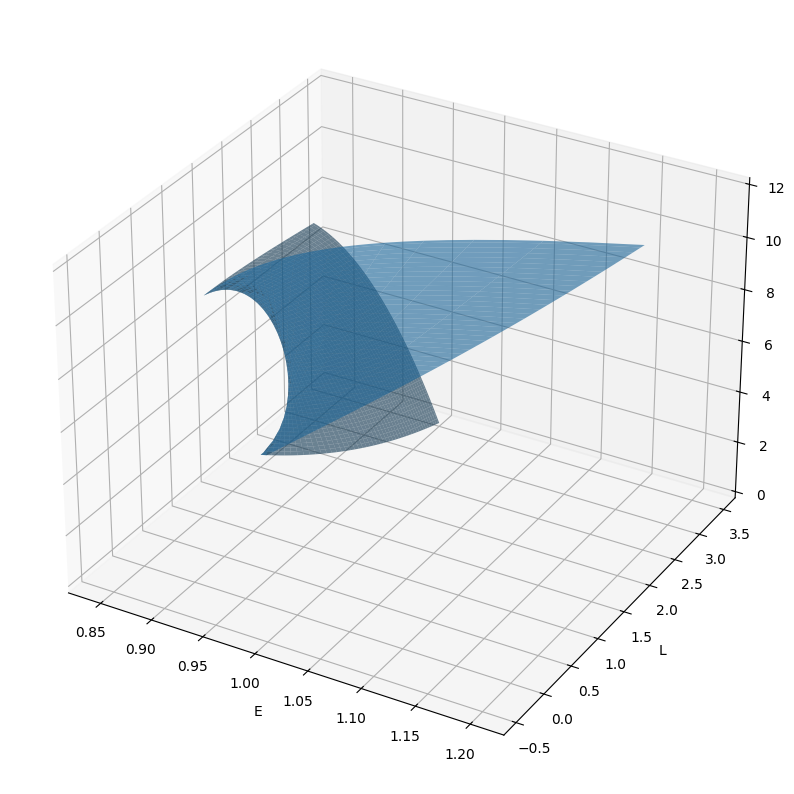

In [14]:
fig = plt.figure(figsize=(10,12))
ax = fig.add_subplot(projection="3d")
#ax.view_init(elev=0, azim=50)
ax.plot_surface(E, L, C_mesh, zorder=2, alpha = 0.6)
#ax.plot(sim1["energy"], sim1["phi_momentum"], sim1["carter"], zorder=1)
#ax.plot(sim2["energy"], sim2["phi_momentum"], sim2["carter"])

ax.set_xlabel("E")
ax.set_ylabel("L")
ax.set_zlabel("C")

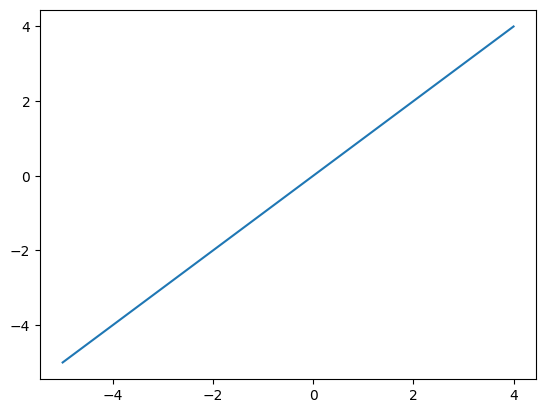

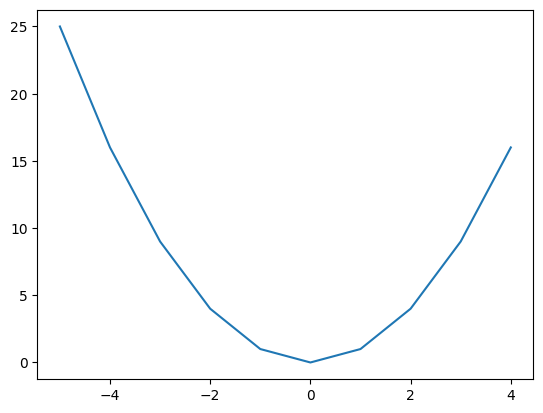

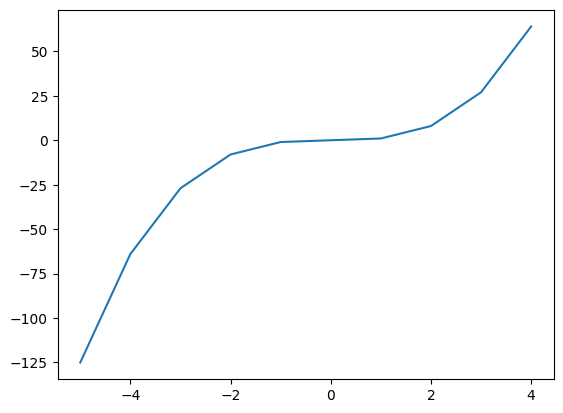

In [3]:
for i in range(3):
    fig1, ax1 = plt.subplots()
    ax1.plot(np.arange(10)-5, (np.arange(10)-5)**(1+i))
    plt.show()


In [128]:
from mayavi import mlab

#fig = mlab.figure()

#ax_ranges = [-2, 2, -2, 2, 0, 8]
#ax_scale = [1.0, 1.0, 0.4]
#ax_extent = ax_ranges * np.repeat(ax_scale, 2)

surf3 = mlab.surf(E, L, C_mesh, colormap='Blues')
#surf4 = mlab.surf(mx, my, mz2, colormap='Oranges')

surf3.actor.actor.scale = ax_scale
#surf4.actor.actor.scale = ax_scale
#mlab.view(60, 74, 17, [-2.5, -4.6, -0.3])
mlab.outline(surf3, color=(.7, .7, .7))#, extent=ax_extent)
mlab.axes(surf3, color=(.7, .7, .7))#, extent=ax_extent,
            #ranges=ax_ranges,
            #xlabel='x', ylabel='y', zlabel='z')

ImportError: Could not import backend for traitsui.  Make sure you
        have a suitable UI toolkit like PyQt/PySide or wxPython
        installed.

In [131]:
def test_barchart():
    """ Demo the bar chart plot with a 2D array.
    """
    s = np.abs(np.random.random((3, 3)))
    return mlab.barchart(s)

test_barchart()

ImportError: Could not import backend for traitsui.  Make sure you
        have a suitable UI toolkit like PyQt/PySide or wxPython
        installed.